<a href="https://colab.research.google.com/github/srishtipithadia/DataScience/blob/main/Group6_FinalProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

---

**Data Science Final Project: Group 6**

*   By: Srishti Pithadia, Luke Cheun, Cherry Bommu, Miles Harrison, Afsana Bhuiyan, Bianca Nichola
*   Date: December 8th, 2022

---

**Task 3: Data Analysis & Explore the Statistical Aspects of Datasets**

In [ ]:
#!pip install keras-tuner
#!pip install matplotlib
#!pip install --upgrade xlrd
#!pip install --upgrade pandas
#!pip install pycountry

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import tensorflow as tf
import keras_tuner as kt
import random
import math
import pycountry

from sklearn.model_selection import train_test_split
from keras.callbacks import ModelCheckpoint
from sklearn.preprocessing import Normalizer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from tensorflow import keras
from keras_tuner.tuners import RandomSearch
from sklearn.mixture import GaussianMixture
from keras import Sequential
from keras.layers import Dense
from sklearn import model_selection as ms
from collections import Counter
from google.colab import drive

In this section, we are going to be working with 3 datasets, labelled #1-3 for the sake of organization.
1. Dataset #1 was found on The World Bank, and was collected by the World Health Organization which can be found [here](https://apps.who.int/nha/database). It contains data reflecting health expenditures per capita around the world (measured in US dollars, by country), and has data from 2000-2019. This dataset increments annually, and is linked [here](https://data.worldbank.org/indicator/SH.XPD.CHEX.PC.CD?view=chart). 


2. Dataset #2 was found on The World Bank, and was collected by the World Resources Institute which can be found [here](https://www.climatewatchdata.org/ghg-emissions?end_year=2019&start_year=1990). It contains data reflecting total greenhouse gas emissions from around the world (measured in kt of CO2 equivalent, by country), and has data from 1990-2019. This dataset increments annually, and is linked [here](https://data.worldbank.org/indicator/EN.ATM.GHGT.KT.CE?most_recent_year_desc=false&type=shaded&view=map&year=2019). 


3. Dataset #3 was found on The World Bank, and was collected by the SE4ALL Global Tracking Framework which can be found [here](https://www.worldbank.org/en/topic/energy/publication/Global-Tracking-Framework-Report). It contains data reflecting renewable energy consumption from around the world (measured by the percentage of total final energy consumption, by country), and has data from 1990-2019. This dataset increments annually, and is linked [here](https://data.worldbank.org/indicator/EG.FEC.RNEW.ZS?view=map&year=1990).

a. Retrieve Datasets

In [ ]:
# connect to Google Drive where compressed dataset has been uploaded
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
# load up dataset #1
df_health = pd.read_excel('/content/gdrive/MyDrive/health_expenditure.xlsx', sheet_name = 'Data')
df_h1 = pd.read_excel('/content/gdrive/MyDrive/health_expenditure.xlsx', sheet_name = 'Metadata - Countries')
df_h2 = pd.read_excel('/content/gdrive/MyDrive/health_expenditure.xlsx', sheet_name = 'Metadata - Indicators')

# load up dataset #2
df_gas = pd.read_excel('/content/gdrive/MyDrive/greenhouse_gas_emission.xlsx', sheet_name = 'Data')
df_g1 = pd.read_excel('/content/gdrive/MyDrive/greenhouse_gas_emission.xlsx', sheet_name = 'Metadata - Countries')
df_g2 = pd.read_excel('/content/gdrive/MyDrive/greenhouse_gas_emission.xlsx', sheet_name = 'Metadata - Indicators')

# load up dataset #3
df_energy = pd.read_excel('/content/gdrive/MyDrive/renewable_energy_consumption.xlsx', sheet_name = 'Data')
df_e1 = pd.read_excel('/content/gdrive/MyDrive/renewable_energy_consumption.xlsx', sheet_name = 'Metadata - Countries')
df_e2 = pd.read_excel('/content/gdrive/MyDrive/renewable_energy_consumption.xlsx', sheet_name = 'Metadata - Indicators')

b. Create Hypotheses

Keeping in mind that the goal of this project is to see if there is a correlation between renewable energy usage and health expediture, we are going to come up with 2 hypotheses to relate each of our datasets to this goal.

1. If renewable energy usage is high in a particular country during a particular year, then greenhouse gas emissions will be low in that same country during the same year.

2. If health expenditures per capita are high in a particular region during a particular year, then the greenhouse gas emissions will also be high in that same region during the same year.

The rationale behind the first hypothesis lies on the fact that non-renewable energy sources produce greenhouse gases when burnt. If renewable energy sources are being used in a region though (as opposed to non-renewable energy sources), then the amount of greenhouse gases being emitted from that region should decrease. For that reason, we predict that renewable energy usage and greenhouse gas emissions will be inversely related.


The rationale behind the second hypothesis lies on the fact that greenhouse gases contribute to climate change, and climate change can impact health. If more greenhouse gases are being emitted by a region, then the atmosphere (in particular, the Ozone Layer) above them will become more damaged. A damaged atmosphere facilitates climate change by trapping heat, and ultimately raises the liklihood of negative health affects. We expect health issues to be tracked by the amount of money spent on health issues, which is why we believe that increased greenhouse gas emissions will be directly correlated with the health expenditure per capita. 

c. Design Analysis Study for Hypotheses

We are going to create a plan for how we will analyze the data from the above datasets in order to answer our hypotheses. To recap, our first hypothesis states that an increase in renewable energy usage will correlate to a decrease in greenhouse gas emission, and our second hypothesis states that an increase in health enpenditure will correlate to an increase in greenhouse gas emission. There will be 3 stages for each analysis study, described in more detail below:

1. Preliminary stage: 

We will clean and visualize the datasets so that they will be ready to use in the next stage, print out statistics for each dataset to make general observations that may explain later outcomes, and we will create a metric that is a ratio of each factor to graph and see if there is any obvious correlation. 

2. Full stage:

We will model the datasets using linear regression and clustering to determine what relation exists for each country.

3. Post stage:

For our linear regression model, we will look at the directionality of the slope as well as the R-squared value to determine if the model is a good fit and if it yielded the expected results. For our clustering model, we will look at how each cluster is grouped, where each cluster center point lies, and it yielded the expected results. 


d. Preview the Datasets

In [ ]:
# viewing the first few rows of the data from dataset #1
print(df_health.shape)
df_health.head()

(269, 66)


,Data Source,World Development Indicators,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 56,Unnamed: 57,Unnamed: 58,Unnamed: 59,Unnamed: 60,Unnamed: 61,Unnamed: 62,Unnamed: 63,Unnamed: 64,Unnamed: 65
0,Last Updated Date,09/16/2022,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Country Name,Country Code,Indicator Name,Indicator Code,1960.0,1961.0,1962.0,1963.0,1964.0,1965.0,...,2012.000000,2013.000000,2014.000000,2015.000000,2016.000000,2017.000000,2018.00000,2019.000000,2020.0,2021.0
3,Aruba,ABW,Current health expenditure per capita (current...,SH.XPD.CHEX.PC.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Africa Eastern and Southern,AFE,Current health expenditure per capita (current...,SH.XPD.CHEX.PC.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,113.183637,111.227695,104.541257,99.008506,94.739159,102.410661,96.28948,91.970113,NaN,NaN


In [ ]:
# viewing the first few rows of the data from dataset #2
print(df_gas.shape)
df_gas.head()

(269, 66)


,Data Source,World Development Indicators,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 56,Unnamed: 57,Unnamed: 58,Unnamed: 59,Unnamed: 60,Unnamed: 61,Unnamed: 62,Unnamed: 63,Unnamed: 64,Unnamed: 65
0,Last Updated Date,09/16/2022,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Country Name,Country Code,Indicator Name,Indicator Code,1960.0,1961.0,1962.0,1963.0,1964.0,1965.0,...,2.012000e+03,2.013000e+03,2.014000e+03,2.015000e+03,2.016000e+03,2.017000e+03,2.018000e+03,2.019000e+03,2020.0,2021.0
3,Aruba,ABW,Total greenhouse gas emissions (kt of CO2 equi...,EN.ATM.GHGT.KT.CE,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Africa Eastern and Southern,AFE,Total greenhouse gas emissions (kt of CO2 equi...,EN.ATM.GHGT.KT.CE,NaN,NaN,NaN,NaN,NaN,NaN,...,1.318920e+06,1.342550e+06,1.370950e+06,1.369670e+06,1.385480e+06,1.401180e+06,1.407690e+06,1.427180e+06,NaN,NaN


In [ ]:
# viewing the first few rows of the data from dataset #3
print(df_energy.shape)
df_energy.head()

(269, 66)


,Data Source,World Development Indicators,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 56,Unnamed: 57,Unnamed: 58,Unnamed: 59,Unnamed: 60,Unnamed: 61,Unnamed: 62,Unnamed: 63,Unnamed: 64,Unnamed: 65
0,Last Updated Date,09/16/2022,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Country Name,Country Code,Indicator Name,Indicator Code,1960.0,1961.0,1962.0,1963.0,1964.0,1965.0,...,2012.000000,2013.000000,2014.000000,2015.000000,2016.00,2017.0,2018.00,2019.00,2020.0,2021.0
3,Aruba,ABW,Renewable energy consumption (% of total final...,EG.FEC.RNEW.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,6.860000,6.890000,6.930000,6.730000,6.99,6.7,8.02,7.48,NaN,NaN
4,Africa Eastern and Southern,AFE,Renewable energy consumption (% of total final...,EG.FEC.RNEW.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,61.081094,60.378305,60.712292,61.106397,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# viewing the first few rows of the metadata from dataset #1 (countries)
print(df_h1.shape)
df_h1.head()

(265, 5)


,Country Code,Region,IncomeGroup,SpecialNotes,TableName
0,ABW,Latin America & Caribbean,High income,NaN,Aruba
1,AFE,NaN,NaN,"26 countries, stretching from the Red Sea in t...",Africa Eastern and Southern
2,AFG,South Asia,Low income,The reporting period for national accounts dat...,Afghanistan
3,AFW,NaN,NaN,"22 countries, stretching from the westernmost ...",Africa Western and Central
4,AGO,Sub-Saharan Africa,Lower middle income,The World Bank systematically assesses the app...,Angola


In [ ]:
# seeing if countries are the same across all datasets
print(df_h1.equals(df_g1))
print(df_h1.equals(df_e1))

True
True


In [ ]:
# viewing the first few rows of the metadata from dataset #1 (indicators)
print(df_h2.shape)
df_h2.head()

(1, 4)


,INDICATOR_CODE,INDICATOR_NAME,SOURCE_NOTE,SOURCE_ORGANIZATION
0,SH.XPD.CHEX.PC.CD,Current health expenditure per capita (current...,Current expenditures on health per capita in c...,World Health Organization Global Health Expend...


In [ ]:
# viewing the first few rows of the metadata from dataset #2 (indicators)
print(df_g2.shape)
df_g2.head()

(1, 4)


,INDICATOR_CODE,INDICATOR_NAME,SOURCE_NOTE,SOURCE_ORGANIZATION
0,EN.ATM.GHGT.KT.CE,Total greenhouse gas emissions (kt of CO2 equi...,Total greenhouse gas emissions in kt of CO2 eq...,Climate Watch. 2020. GHG Emissions. Washington...


In [ ]:
# viewing the first few rows of the metadata from dataset #3 (indicators)
print(df_e2.shape)
df_e2.head()

(1, 4)


,INDICATOR_CODE,INDICATOR_NAME,SOURCE_NOTE,SOURCE_ORGANIZATION
0,EG.FEC.RNEW.ZS,Renewable energy consumption (% of total final...,Renewable energy consumption is the share of r...,"World Bank, Sustainable Energy for All (SE4ALL..."


Above each preview, we've printed the shape of the data. The corresponding pages in workbook #1, #2 and #3 (since the datasets came in Excel format) have the same shape at the moment, which is notable. The data does, however, include what seems like a lot of NaNs, so hopefully after dealing with those the shapes remain similar. It is clearly observable that the indicator metadata differs (as expected), but the country metadata seems to be the same. This is verified above. 

e. Data Cleaning

First, we need to adjust the column titles/index for each dataset.

In [ ]:
# set 3rd row as column headings of dataset #1, #2 & #3
df_health.rename(columns=df_health.iloc[2], inplace=True)
df_gas.rename(columns=df_gas.iloc[2], inplace=True)
df_energy.rename(columns=df_energy.iloc[2], inplace=True)

# remove first 3 rows of dataset (since they're irrelevant) and reset indices
df_health.drop([0,1,2], inplace=True)
df_gas.drop([0,1,2], inplace=True)
df_energy.drop([0,1,2], inplace=True)

df_health.reset_index(drop=True, inplace=True)
df_gas.reset_index(drop=True, inplace=True)
df_energy.reset_index(drop=True, inplace=True)

# view example of changes
df_health.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960.0,1961.0,1962.0,1963.0,1964.0,1965.0,...,2012.0,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0,2020.0,2021.0
0,Aruba,ABW,Current health expenditure per capita (current...,SH.XPD.CHEX.PC.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Africa Eastern and Southern,AFE,Current health expenditure per capita (current...,SH.XPD.CHEX.PC.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,113.183637,111.227695,104.541257,99.008506,94.739159,102.410661,96.289480,91.970113,NaN,NaN
2,Afghanistan,AFG,Current health expenditure per capita (current...,SH.XPD.CHEX.PC.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,51.440262,55.034630,59.008934,58.906528,60.188671,65.706024,69.998604,65.806030,NaN,NaN
3,Africa Western and Central,AFW,Current health expenditure per capita (current...,SH.XPD.CHEX.PC.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,71.039947,78.746863,81.804505,73.297775,63.649069,60.968846,59.328810,61.338476,NaN,NaN
4,Angola,AGO,Current health expenditure per capita (current...,SH.XPD.CHEX.PC.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,122.185585,143.606873,131.647659,108.582939,95.124977,114.334602,87.310738,71.326004,NaN,NaN


Next, we need to edit/remove irrelevant columns for clarity.

In [ ]:
# trimming irrelevant "country" values from df_h1

# setting country name as key in table
df_h1.set_index("TableName", inplace=True, drop=False)

# creating lists of acceptable country values (and exceptions hardcoded)
countries, codes, exc = [], [], ['Bahamas, The', 'Bolivia', 'Congo, Dem. Rep.', 'Congo, Rep.', 'Egypt, Arab Rep.', 'Micronesia, Fed. Sts.', 'Gambia, The',
        'Hong Kong SAR, China', 'Iran, Islamic Rep.', 'Kyrgyz Republic', 'St. Kitts and Nevis', 'Korea, Rep.', 'Lao PDR', 'St. Lucia', 
        'St. Martin (French part)', 'Moldova', 'Korea, Dem. People\'s Rep.', 'São Tomé and Principe', 'Slovak Republic', 'Türkiye',
        'Tanzania', 'St. Vincent and the Grenadines', 'Venezuela, RB', 'British Virgin Islands', 'Virgin Islands (U.S.)', 'Vietnam',
        'Kosovo', 'Yemen, Rep.']

for x in pycountry.countries:
  countries.append(x.name)

# looping through table and saving the country codes for each acceptable value
for i, row in df_h1.iterrows():
  if row.TableName in countries or row.TableName in exc:
    codes.append(row['Country Code'])

In [ ]:
# adjusting datasets so all country names correlate to country name in approved countries dataset
# need to do this since some don't consistently include accents, etc.

# resetting country code as key in table
df_h1.set_index("Country Code", drop=False, inplace=True)

# looping through and reassigning value of country name as one from countries dataset
def adjust_countries(loop_table, table):
  for i, r in loop_table:
    if r['Country Code'] in codes:
      table.at[i, 'Country Name'] = df_h1.loc[r['Country Code']]['TableName']
    else:
      table.drop([i], inplace=True)
  
  table.set_index("Country Name", inplace=True)

# performing changes on each dataset
adjust_countries(df_health.iterrows(), df_health)
adjust_countries(df_gas.iterrows(), df_gas)
adjust_countries(df_energy.iterrows(), df_energy)

In [ ]:
# seeing if "Indicator Name" and "Indicator Code" are the same value in every row
print('Health Indicator Name Values: ', df_health.describe(include=['O'])['Indicator Name']['unique'])
print('Health Indicator Code Values: ', df_health.describe(include=['O'])['Indicator Code']['unique'])

print('\nGas Indicator Name Values: ', df_gas.describe(include=['O'])['Indicator Name']['unique'])
print('Gas Indicator Code Values: ', df_gas.describe(include=['O'])['Indicator Code']['unique'])

print('\nEnergy Indicator Name Values: ', df_energy.describe(include=['O'])['Indicator Name']['unique'])
print('Energy Indicator Code Values: ', df_energy.describe(include=['O'])['Indicator Code']['unique'])

Health Indicator Name Values:  1
Health Indicator Code Values:  1

Gas Indicator Name Values:  1
Gas Indicator Code Values:  1

Energy Indicator Name Values:  1
Energy Indicator Code Values:  1


In [ ]:
# dropping "Indicator Name" and "Indicator Code" columns since constant
df_health.drop(['Indicator Name'], axis=1, inplace=True)
df_health.drop(['Indicator Code'], axis=1, inplace=True)

df_gas.drop(['Indicator Name'], axis=1, inplace=True)
df_gas.drop(['Indicator Code'], axis=1, inplace=True)

df_energy.drop(['Indicator Name'], axis=1, inplace=True)
df_energy.drop(['Indicator Code'], axis=1, inplace=True)

# removing "Country Code" since "Country Name" is descriptive enough
df_health.drop(['Country Code'], axis=1, inplace=True)
df_gas.drop(['Country Code'], axis=1, inplace=True)
df_energy.drop(['Country Code'], axis=1, inplace=True)

Finally, the last task is to handle all the NaN values by adjusting each of the 3 datasets. Ideally, by the end, all the datasets will have indexes/columns that are easily comparable. 

We will start by removing all the rows (countries) that only have NaN values. Then, we will have to adjust all 3 datasets so that they all have the same row headings (for easier comparability). Next, we will remove all columns that only have NaN values. Luckily there is no difference in column range between the 3 datasets, but if there was then we would've had to adjust that as well. Finally, the last step is the fill in the odd NaN values that are here and there in each dataset. We do this by replacing the NaN value with the previous year's value. In cases where there are no valid values from the previous year, we then just use the value from the next year.

In [ ]:
# checking to see if there are any missing vals in the datasets
print("Health: \n", df_health.isnull().sum())
print("\nGas: \n", df_gas.isnull().sum())
print("\nEnergy: \n", df_energy.isnull().sum())

Health: 
 1960.0    214
1961.0    214
1962.0    214
1963.0    214
1964.0    214
         ... 
2017.0     27
2018.0     27
2019.0     28
2020.0    214
2021.0    214
Length: 62, dtype: int64

Gas: 
 1960.0    214
1961.0    214
1962.0    214
1963.0    214
1964.0    214
         ... 
2017.0     23
2018.0     23
2019.0     23
2020.0    214
2021.0    214
Length: 62, dtype: int64

Energy: 
 1960.0    214
1961.0    214
1962.0    214
1963.0    214
1964.0    214
         ... 
2017.0      3
2018.0      3
2019.0      3
2020.0    214
2021.0    214
Length: 62, dtype: int64


In [ ]:
all = df_health.index

# dropping all rows in which all values are null
df_health.dropna(how='all', inplace=True)
df_gas.dropna(how='all', inplace=True)
df_energy.dropna(how='all', inplace=True)

# adjusting datasets so that they all have data on the same countries
for c in all:
  if c not in df_health.index or c not in df_gas.index or c not in df_energy.index:
    if c in df_health.index:
      df_health.drop([c], inplace=True)
    if c in df_gas.index:
      df_gas.drop([c], inplace=True)
    if c in df_energy.index:
      df_energy.drop([c], inplace=True)

# checking to see new shape
print("Health: ", df_health.shape)
print("Gas:    ", df_gas.shape)
print("Energy: ", df_energy.shape)

Health:  (188, 62)
Gas:     (188, 62)
Energy:  (188, 62)


In [ ]:
# dropping all columns in which all values are null
df_health.dropna(how='all', axis=1, inplace=True)
df_gas.dropna(how='all', axis=1, inplace=True)
df_energy.dropna(how='all', axis=1, inplace=True)

# adjusting range of years in all datasets to match (2000-2019)
for c in df_gas.columns:
  if c not in df_health.columns:
    df_gas.drop([c], axis=1, inplace=True)
    df_energy.drop([c], axis=1, inplace=True)

# checking to see new shape
print("Health: ", df_health.shape)
print("Gas:    ", df_gas.shape)
print("Energy: ", df_energy.shape)

Health:  (188, 20)
Gas:     (188, 20)
Energy:  (188, 20)


In [ ]:
# replacing NaNs with previous year's data
df_health.fillna(method='ffill', inplace=True)
df_energy.fillna(method='ffill', inplace=True)

# in cases that previous year's value is invalid/unavailable, we use next year's value
df_health.fillna(method='bfill', inplace=True)
df_energy.fillna(method='bfill', inplace=True)

# checking to see if there are any missing values remaining in the datasets
print("Health: ", df_health.isnull().sum().sum())
print("Gas:    ", df_gas.isnull().sum().sum())
print("Energy: ", df_energy.isnull().sum().sum())

Health:  0
Gas:     0
Energy:  0


In [ ]:
# previewing dataset #1 (changes will be similar in #2 and #3 as well) after changes
df_health.head()

,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0
Country Name,,,,,,,,,,,,,,,,,,,,
Afghanistan,12.998967,28.918121,15.803164,17.035744,20.412764,23.890501,27.836571,31.271839,38.102661,41.722744,44.990532,50.853474,51.440262,55.034630,59.008934,58.906528,60.188671,65.706024,69.998604,65.806030
Angola,12.998967,28.918121,29.049364,34.875187,49.810741,54.260777,69.812302,92.860306,135.605820,119.996284,96.697014,122.107231,122.185585,143.606873,131.647659,108.582939,95.124977,114.334602,87.310738,71.326004
Albania,80.616951,89.580734,96.271118,125.987976,156.568176,165.265366,174.530243,222.303665,220.464249,186.442810,192.003220,211.075516,213.719742,236.957962,251.358261,192.885132,202.013321,226.280670,274.914093,71.326004
Andorra,1302.620728,1347.484985,1528.750610,1820.041870,2043.302246,2299.703613,2161.205322,2403.599121,2818.804688,2714.249756,2685.479736,2634.032715,2370.057129,2432.782715,2529.089844,2246.254395,2361.217529,2567.423828,2821.801270,2744.194336
United Arab Emirates,787.021118,777.130615,857.911926,886.501221,894.540405,913.356079,974.520630,1072.705322,1303.140747,1296.977661,1314.630005,1438.472168,1403.524902,1523.883789,1588.282349,1385.537720,1322.004272,1650.018555,1817.347656,1842.694458


Now that the data is cleaned, we're going to merge all 3 datasets together into one dataset for easier visualization and graphing.

In [ ]:
df_h1.set_index("TableName", inplace = True, drop = False)

# method that loops through and combines all the individual year columns into one "Year" column
def reformat_data(iter, label):
  data = []

  for index, row in iter:   
      for i in range (2000, 2020, 1):
        temp = []
        temp.append(index)
        temp.append(df_h1.loc[index].IncomeGroup)
        temp.append(i)
        temp.append(row[i-2000])
        data.append(temp)

  return pd.DataFrame(data, columns=['Country Name', 'Income Group', 'Year', label])

# applying the above method to each dataset
df_health2 = reformat_data(df_health.iterrows(), 'Health Expenditure')
df_gas2 = reformat_data(df_gas.iterrows(), 'Greenhouse Gas Emission')
df_energy2 = reformat_data(df_energy.iterrows(), 'Renewable Energy Usage')

# merging the datasets together into one dataset
df = pd.merge(df_health2, pd.merge(df_gas2, df_energy2, on=['Country Name','Income Group', 'Year']), on=['Country Name','Income Group', 'Year'])
print(df.shape)
df

(3760, 6)


,Country Name,Income Group,Year,Health Expenditure,Greenhouse Gas Emission,Renewable Energy Usage
0,Afghanistan,Low income,2000,12.998967,13890.000343,44.99
1,Afghanistan,Low income,2001,28.918121,12250.000000,45.60
2,Afghanistan,Low income,2002,15.803164,14890.000343,37.83
3,Afghanistan,Low income,2003,17.035744,15529.999733,36.66
4,Afghanistan,Low income,2004,20.412764,15310.000420,44.24
...,...,...,...,...,...,...
3755,Zimbabwe,Lower middle income,2015,107.686999,30700.000763,80.82
3756,Zimbabwe,Lower middle income,2016,112.411404,28530.000687,81.90
3757,Zimbabwe,Lower middle income,2017,115.646201,28299.999237,82.46
3758,Zimbabwe,Lower middle income,2018,141.369308,30829.999924,80.23


f. Exploratory Data Analysis

In [ ]:
# getting general info about the columns and value types
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3760 entries, 0 to 3759
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Country Name             3760 non-null   object 
 1   Income Group             3740 non-null   object 
 2   Year                     3760 non-null   int64  
 3   Health Expenditure       3760 non-null   float64
 4   Greenhouse Gas Emission  3760 non-null   float64
 5   Renewable Energy Usage   3760 non-null   float64
dtypes: float64(3), int64(1), object(2)
memory usage: 205.6+ KB


First, let's examine an example of the data for one country (United States) from all 3 angles, just to get an idea of the data (and a potential relationship).

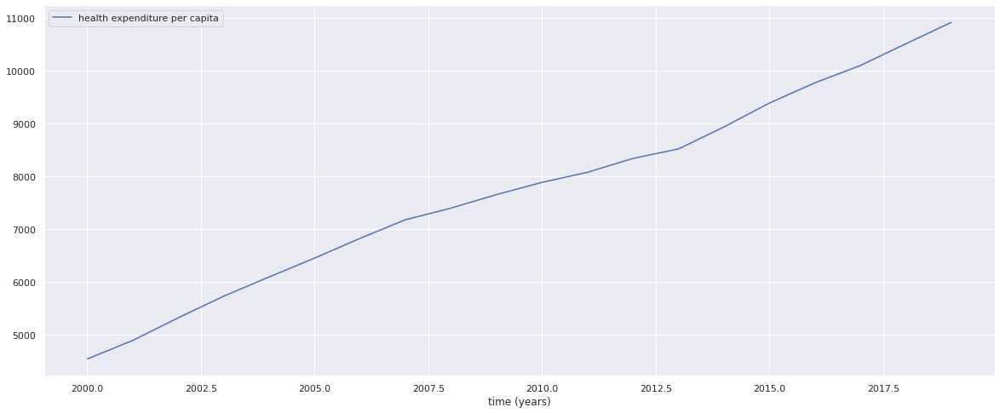

In [ ]:
# graph of health expenditure per capita in US
plt.plot(df_health.T['United States'], label='health expenditure per capita')

plt.xlabel('time (years)')
plt.legend()
plt.show()

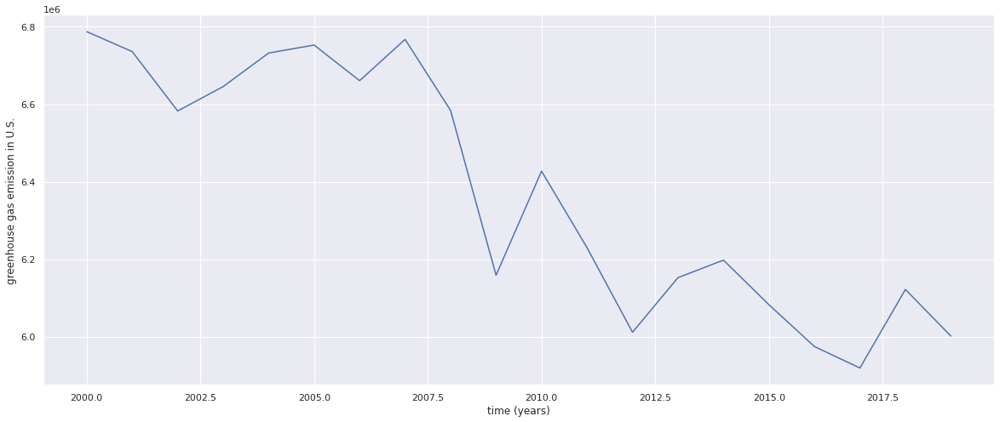

In [ ]:
# graph of greenhouse gas emission in US
plt.plot(df_gas.T['United States'], label='greenhouse gas emission')

plt.ylabel('greenhouse gas emission in U.S.')
plt.xlabel('time (years)')
plt.show()

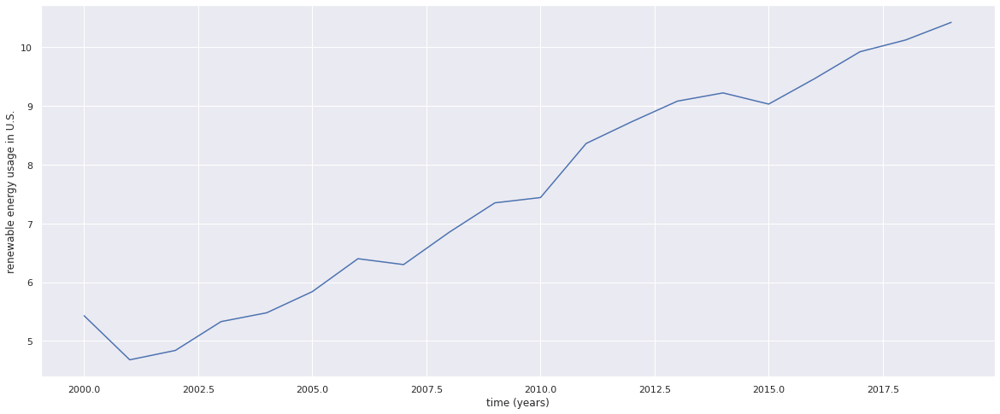

In [ ]:
# graph of renewable energy usage in the US
plt.plot(df_energy.T['United States'], label='renewable energy usage')

plt.ylabel('renewable energy usage in U.S.')
plt.xlabel('time (years)')
plt.show()

Next, lets examine the distribution of data via histograms for quantitative data.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f6b8321e880>]],
      dtype=object)

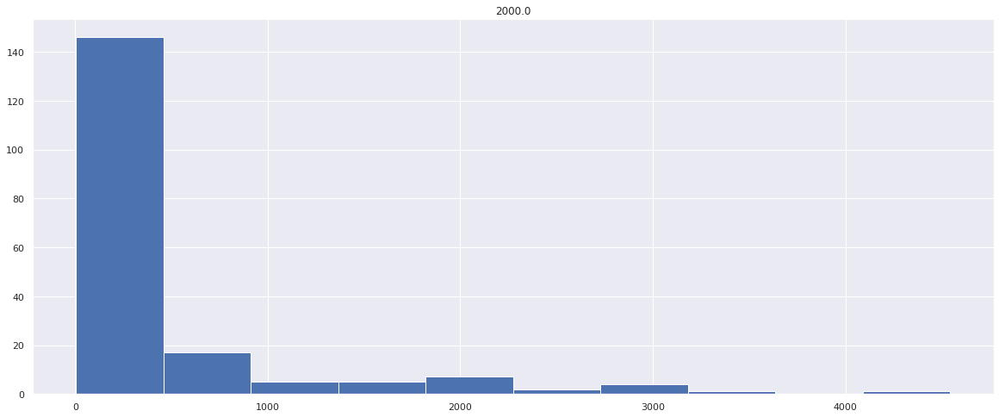

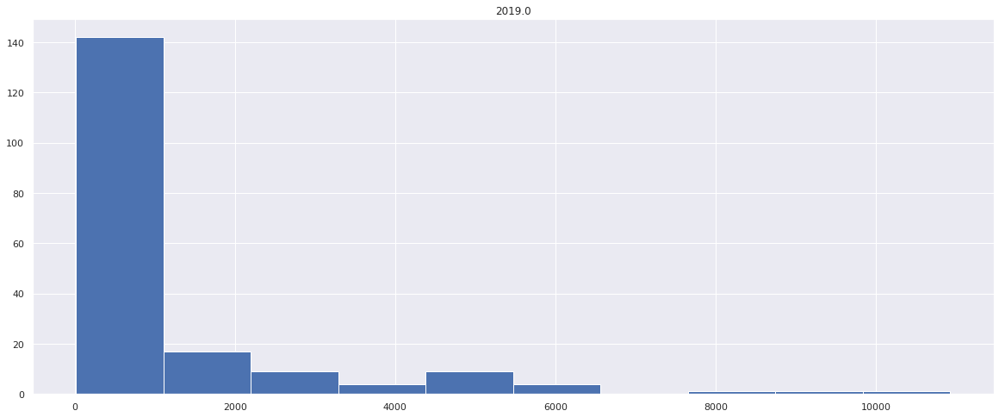

In [ ]:
# distribution of health expenditure per capita (in USD) in 2000 vs 2019
df_health.hist(column=2000)
df_health.hist(column=2019)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f6b8311ebb0>]],
      dtype=object)

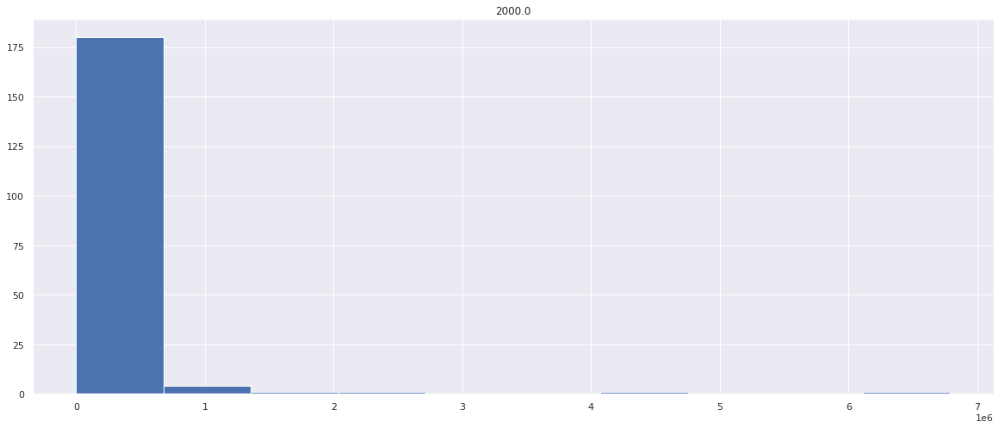

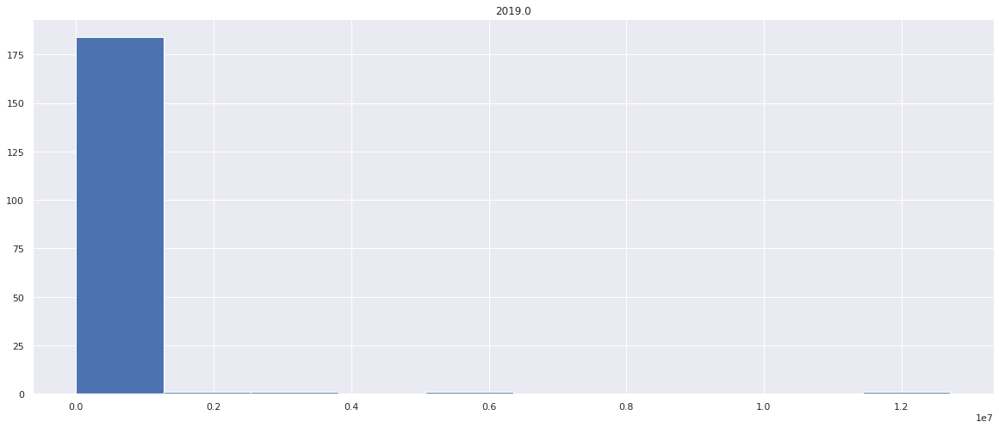

In [ ]:
# distribution of greenhouse gas emission (in kt of CO2 equivalent) in 2000 vs 2019
df_gas.hist(column=2000)
df_gas.hist(column=2019)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f6b82ff67f0>]],
      dtype=object)

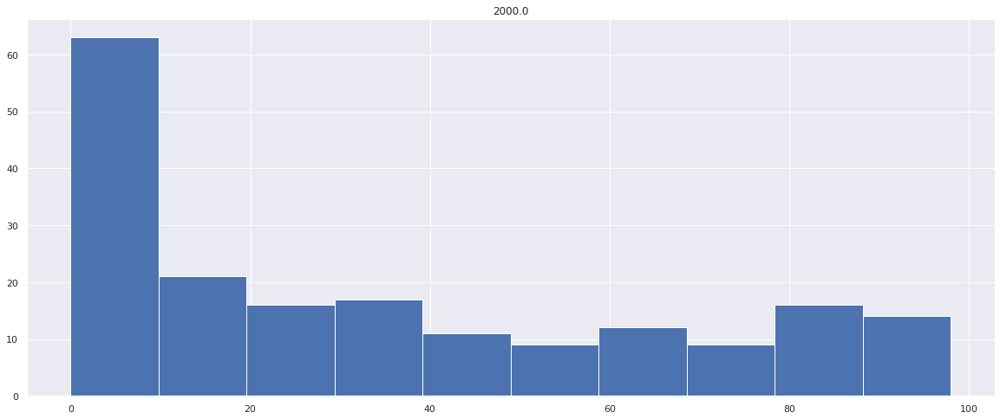

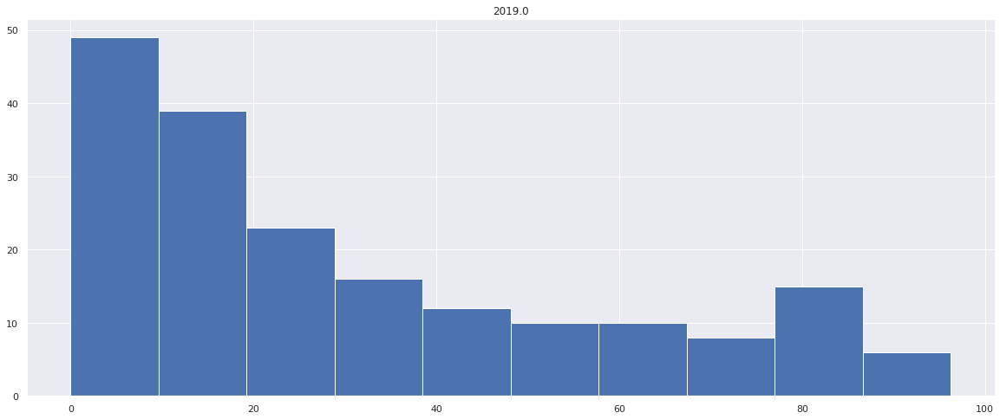

In [ ]:
# distribution of renewable energy usage (in % of total final energy) in 2000 vs 2019
df_energy.hist(column=2000)
df_energy.hist(column=2019)

Now, lets examine the distribution of data via barplots for qualitative data. I believe year can count as a categorical category based on how the table is formatted, like in the case of df_health/df_gas/df_energy.

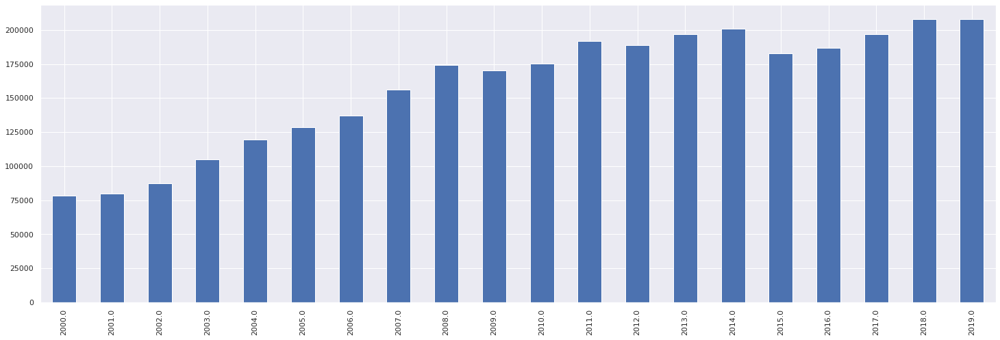

In [ ]:
# total health expenditure by year
df_health.sum().plot(kind="bar", figsize=(25, 8))

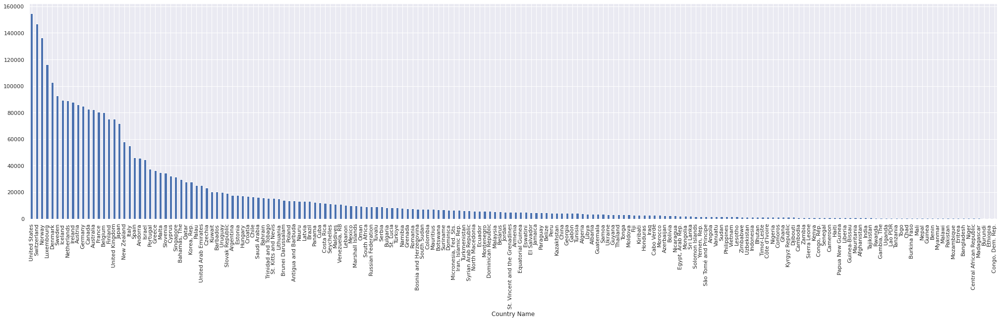

In [ ]:
# total health expenditure by country
df_health.T.sum().sort_values(ascending=False).plot(kind="bar", figsize=(35, 8))

For health expenditure, there seems to be be an increasing trend in spending over the years. In terms of country, it can be seen that:
1. United States
2. Switzerland
3. Norway
4. Luxembourg
5. Denmark

Have a significantly higher total health expenditure than all other countries.

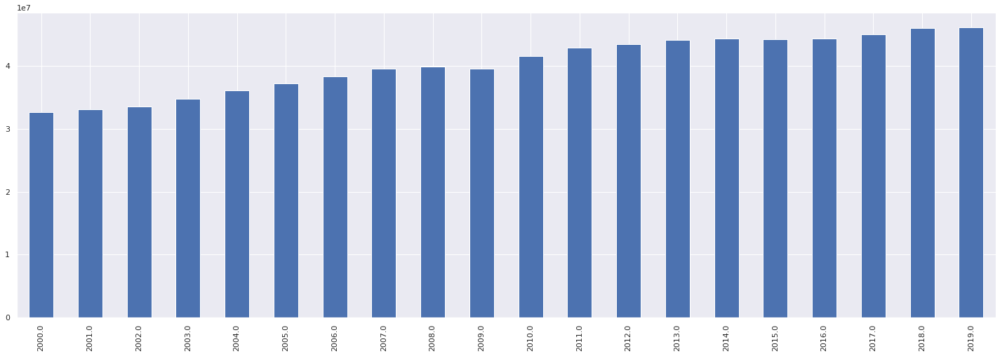

In [ ]:
# total greenhouse gas emission by year
df_gas.sum().plot(kind="bar", figsize=(25, 8))

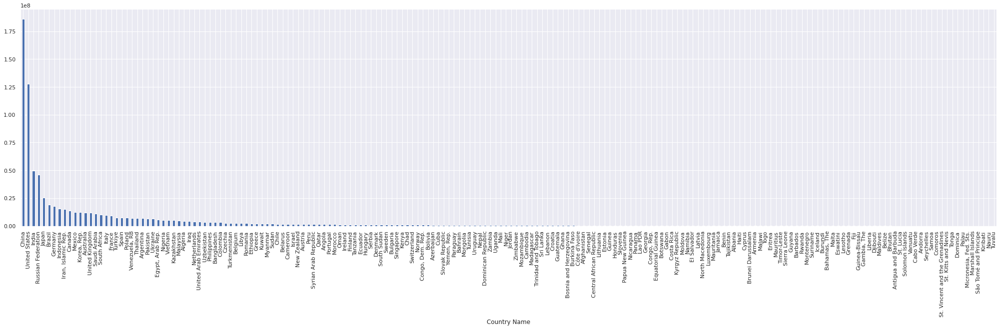

In [ ]:
# total greenhouse gas emission by country
df_gas.T.sum().sort_values(ascending=False).plot(kind="bar", figsize=(35, 8))

For greenhouse gas emission, there seems to be be an increasing trend over the years. In terms of country, it can be seen that:
1. China
2. United States
3. India
4. Russia

Have a significantly greenhouse gas emissions than all other countries. China and the United States, specifically, seem to have a significantly higher emission of greenhouse gas than even the 2 closest countries, India and Russia.

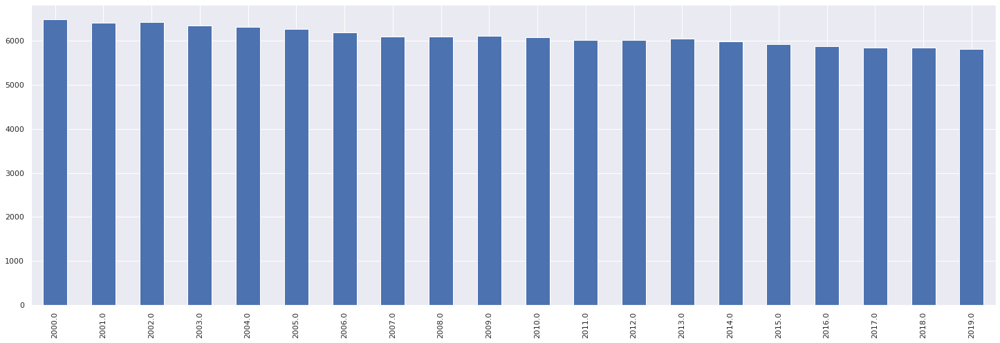

In [ ]:
# total renewable energy usage by year
df_energy.sum().plot(kind="bar", figsize=(25, 8))

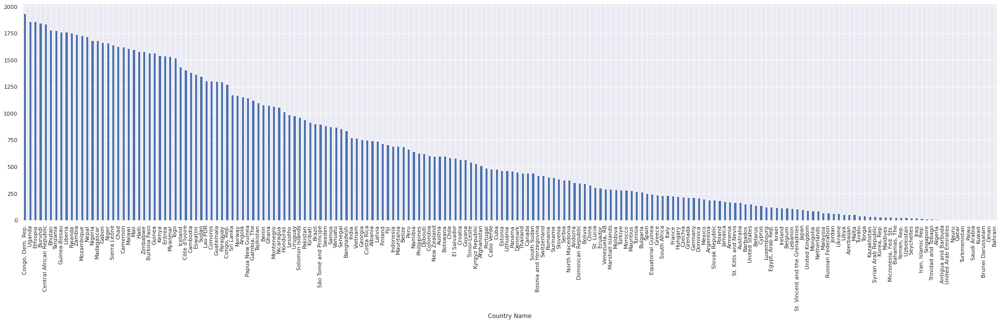

In [ ]:
# total renewable energy usage by country
df_energy.T.sum().sort_values(ascending=False).plot(kind="bar", figsize=(35, 8))

For renewable energy usage, there seems to be be a slightly decreasing trend over the years. In terms of country, it can be seen that:
1. Democratic Republic of Congo
2. Uganda
3. Ethiopia
4. Burundi
5. Central African Republic 

Have the highest usage of renewable energy out of all other countries. It is notable that unlike health expenditure and greenhouse gas emissions, renewable energy usage does not seem to have a few countries leading significantly. Rather, there are many countries using nearly as much renewable energy usage as the leading countries.

Finally, lets examine some factors about our data, such as:
1. Minimums
2. Maximums
3. Medians
4. Quartiles
5. Outliers

We will look at them in term of both year and country for each of the 3 datasets.

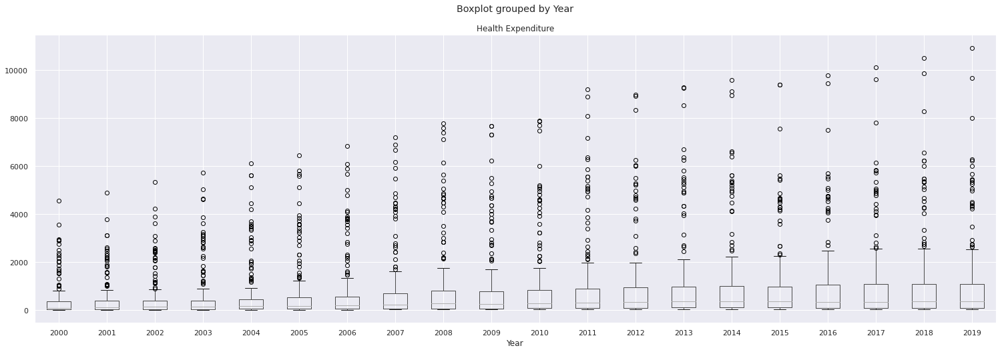

In [ ]:
# the stats for health by year (boxplot)
df.boxplot(by="Year", column=["Health Expenditure"], figsize=(25, 8))

In [ ]:
# the stats for health by year (table)
df_health.describe()

,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0
count,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000
mean,415.778176,425.898652,465.528639,557.772387,635.964263,685.293032,728.105036,829.630431,927.598174,904.534062,933.654284,1021.521071,1005.279318,1046.887902,1069.129150,973.319905,995.054308,1047.718612,1105.511378,1106.426161
std,748.749757,770.416709,866.154922,1046.713081,1190.817108,1260.097524,1313.557671,1479.575124,1616.430905,1584.875017,1612.689348,1771.621117,1722.296373,1771.707341,1802.628932,1624.727782,1663.905938,1742.359845,1835.883971,1822.694960
min,4.335375,4.484550,4.648788,5.841339,5.880651,6.653603,8.213587,9.614869,13.451802,13.575726,12.894424,12.629234,14.016035,16.333883,19.367996,19.000767,20.577927,19.413782,18.520622,19.849976
25%,24.724640,26.855593,27.228025,31.309769,37.383168,40.921148,49.661297,56.976614,63.881608,64.275959,74.079964,83.526339,86.178131,103.098503,101.514246,97.709036,88.923027,83.690775,80.909634,75.233194
50%,82.407295,106.230976,123.497055,134.516350,157.071877,174.627663,197.610664,230.008408,266.611908,254.596756,284.885361,312.024597,331.019012,359.802765,369.858810,345.211349,320.504272,334.965912,358.435318,362.459305
75%,362.091866,388.047737,371.700005,379.587334,446.677475,518.297058,563.402771,692.300125,792.075806,785.362793,836.739319,888.892563,940.008759,964.483597,1008.879150,965.247177,1046.427368,1074.898254,1080.886322,1068.745880
max,4543.436035,4894.280762,5322.742188,5732.229492,6097.287598,6454.403809,6828.615723,7181.892090,7768.050293,7670.593750,7888.352051,9191.958984,8970.120117,9275.798828,9578.645508,9392.066406,9775.000000,10103.091797,10515.323242,10921.012695


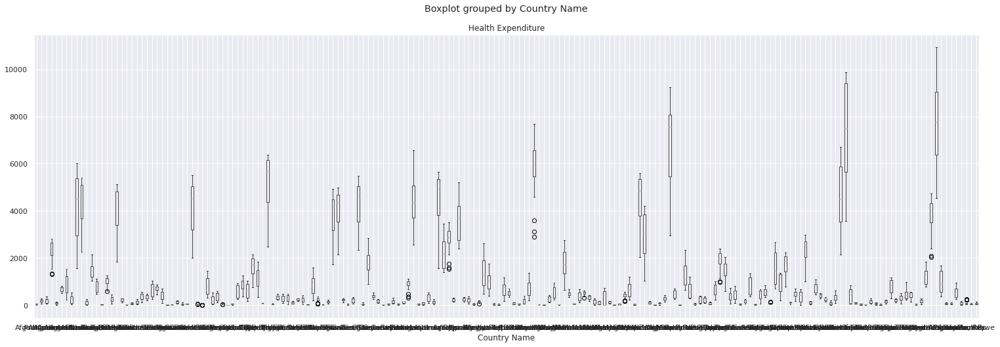

In [ ]:
# the stats for health by country (boxplot)
df.boxplot(by="Country Name", column=["Health Expenditure"], figsize=(25, 8))

In [ ]:
# the stats for health by country (table)
df_health.T.describe()

Country Name,Afghanistan,Angola,Albania,Andorra,United Arab Emirates,Argentina,Armenia,Antigua and Barbuda,Australia,Austria,...,Uzbekistan,St. Vincent and the Grenadines,"Venezuela, RB",Vietnam,Vanuatu,Samoa,"Yemen, Rep.",South Africa,Zambia,Zimbabwe
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,...,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,41.996338,86.055575,179.528260,2291.604822,1252.510080,884.626555,250.588856,676.407880,4115.813007,4309.200610,...,74.010430,256.763184,559.798978,80.168786,84.895340,173.670039,92.622972,467.359986,53.941427,74.382345
std,18.654113,40.019828,59.131781,467.096777,339.130706,432.135858,155.546499,87.270077,1526.047235,1052.511830,...,39.402932,57.407318,217.826956,51.064021,25.692955,68.956477,78.296558,145.305381,17.654244,36.964448
min,12.998967,12.998967,71.326004,1302.620728,777.130615,223.848602,26.129089,512.568298,1564.166504,2269.126465,...,24.476669,157.935867,245.401566,18.916744,46.255718,58.871178,25.827745,186.781479,24.724640,24.724640
25%,26.850053,53.148268,148.923126,2131.729553,908.652161,542.979599,90.309078,599.876511,2951.599976,3681.461060,...,34.830616,202.443974,351.052521,33.464125,63.067134,122.003054,42.320012,404.326317,45.653767,45.653767
50%,43.356638,93.992641,192.444176,2386.828125,1308.885376,865.831085,281.770325,694.171844,4476.681763,4755.334717,...,76.954823,274.416473,538.956177,71.536144,83.101074,185.991417,67.838501,483.973923,56.650871,74.981110
75%,58.932130,120.524021,220.924103,2646.894470,1459.825073,1227.848114,372.787743,751.074890,5380.272827,5085.275024,...,104.647476,295.886574,707.154388,118.277651,105.121309,227.172085,80.059076,553.397949,67.270624,104.192954
max,69.998604,143.606873,274.914093,2821.801270,1842.694458,1531.484253,523.999084,808.699280,6025.344727,5393.602051,...,131.833023,354.808655,945.915100,180.718185,129.784912,271.915771,271.915771,699.967529,88.128204,141.369308


From the above charts, is it clear that in terms of year, there are many outliers, whereas in terms of country, there are significantly less. This demonstrates how countries seems to be fairly consistent on their own, but in comparison to each other there is no overall "average" in health expenditure that can be applied to all countries.

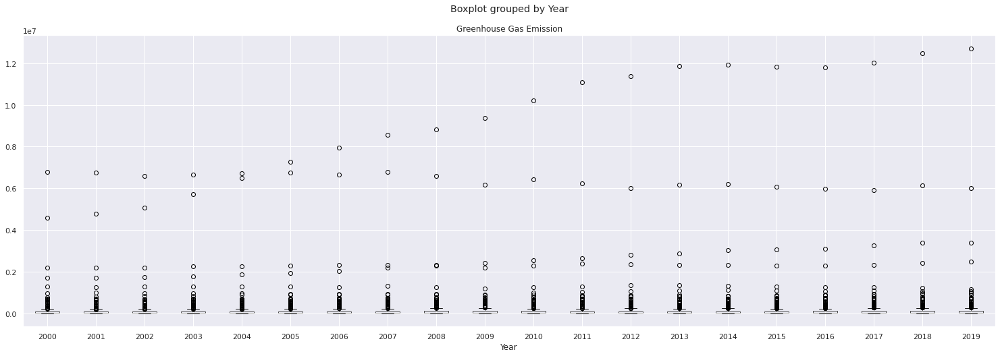

In [ ]:
# the stats for gas by year (boxplot)
df.boxplot(by="Year", column=["Greenhouse Gas Emission"], figsize=(25, 8))

In [ ]:
# the stats for gas by year (table)
df_gas.describe()

,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0
count,1.880000e+02,1.880000e+02,1.880000e+02,1.880000e+02,1.880000e+02,1.880000e+02,1.880000e+02,1.880000e+02,1.880000e+02,1.880000e+02,1.880000e+02,1.880000e+02,1.880000e+02,1.880000e+02,1.880000e+02,1.880000e+02,1.880000e+02,1.880000e+02,1.880000e+02,1.880000e+02
mean,1.740085e+05,1.761698e+05,1.783111e+05,1.849179e+05,1.923689e+05,1.983945e+05,2.040317e+05,2.108030e+05,2.124558e+05,2.106597e+05,2.214535e+05,2.280874e+05,2.310814e+05,2.347616e+05,2.361093e+05,2.356204e+05,2.362711e+05,2.399135e+05,2.448602e+05,2.456541e+05
std,6.403749e+05,6.455666e+05,6.499715e+05,6.825333e+05,7.237130e+05,7.627189e+05,7.951111e+05,8.343312e+05,8.413459e+05,8.562568e+05,9.179814e+05,9.666684e+05,9.794519e+05,1.014551e+06,1.022092e+06,1.011120e+06,1.007245e+06,1.022894e+06,1.058939e+06,1.070346e+06
min,2.000000e+01,2.000000e+01,2.000000e+01,2.000000e+01,2.000000e+01,2.000000e+01,2.000000e+01,3.000000e+01,2.000000e+01,2.000000e+01,2.000000e+01,2.000000e+01,2.000000e+01,2.000000e+01,2.000000e+01,2.000000e+01,2.000000e+01,2.000000e+01,3.000000e+01,3.000000e+01
25%,6.455000e+03,6.400000e+03,6.362500e+03,6.665000e+03,7.032500e+03,7.245000e+03,7.840000e+03,8.355000e+03,8.532500e+03,8.227500e+03,8.482500e+03,8.770000e+03,8.437500e+03,8.602500e+03,8.560000e+03,8.345000e+03,8.922500e+03,8.935000e+03,9.447500e+03,9.227500e+03
50%,2.500500e+04,2.532000e+04,2.460500e+04,2.489000e+04,2.449000e+04,2.672500e+04,2.655500e+04,2.795500e+04,2.873000e+04,2.833000e+04,2.958500e+04,3.079000e+04,3.202000e+04,3.297000e+04,3.412000e+04,3.412000e+04,3.471000e+04,3.651500e+04,3.622500e+04,3.707000e+04
75%,8.005500e+04,8.265500e+04,8.470750e+04,8.621750e+04,8.692750e+04,9.135000e+04,9.526750e+04,9.806750e+04,1.036725e+05,1.024625e+05,1.040850e+05,9.752250e+04,1.006375e+05,9.871000e+04,9.881000e+04,1.023150e+05,1.062375e+05,1.077100e+05,1.080325e+05,1.093000e+05
max,6.787480e+06,6.736030e+06,6.582640e+06,6.645610e+06,6.732260e+06,7.266530e+06,7.946140e+06,8.555800e+06,8.810970e+06,9.386580e+06,1.021851e+07,1.109819e+07,1.138546e+07,1.187803e+07,1.193803e+07,1.181847e+07,1.180083e+07,1.203527e+07,1.247109e+07,1.270509e+07


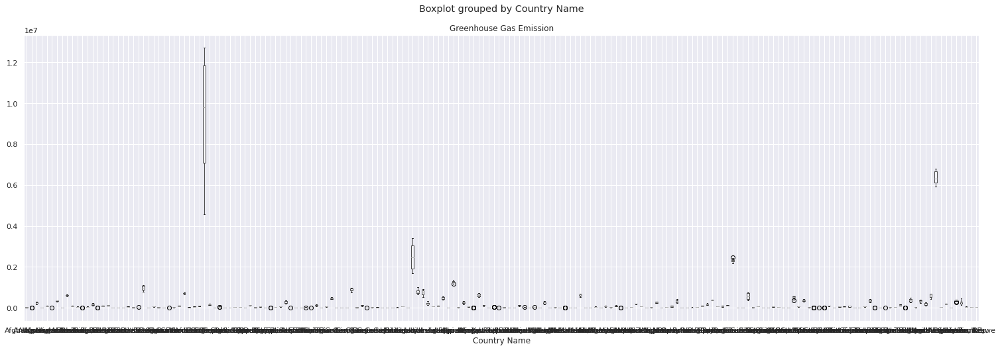

In [ ]:
# the stats for gas by country (boxplot)
df.boxplot(by="Country Name", column=["Greenhouse Gas Emission"], figsize=(25, 8))

In [ ]:
# the stats for gas by country (table)
df_gas.T.describe()

Country Name,Afghanistan,Angola,Albania,Andorra,United Arab Emirates,Argentina,Armenia,Antigua and Barbuda,Australia,Austria,...,Uzbekistan,St. Vincent and the Grenadines,"Venezuela, RB",Vietnam,Vanuatu,Samoa,"Yemen, Rep.",South Africa,Zambia,Zimbabwe
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,...,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,22055.000019,73260.500336,8949.000025,611.499995,190371.001434,340604.499817,8056.999946,1005.499998,599935.504150,81650.500107,...,177697.999573,361.000004,347709.500885,251049.503326,693.000001,540.500000,40428.499985,502637.500000,31889.000130,28651.000023
std,6100.384370,8975.520717,388.829484,24.978943,47894.004125,31219.623657,1345.265010,294.537545,31797.344504,5095.036261,...,7677.957511,148.036274,33073.713145,87651.844426,108.971269,80.228297,10155.204521,54082.705835,4034.566528,2156.763880
min,12250.000000,57639.999390,8109.999657,569.999993,109019.996643,280480.010986,5769.999981,600.000024,539309.997559,75150.001526,...,161029.998779,239.999995,255740.005493,134889.999390,550.000012,430.000007,23840.000153,373950.012207,24799.999237,24600.000381
25%,16054.999590,66684.999466,8825.000286,589.999974,147877.506256,321729.995728,7137.500167,772.499979,580397.506714,77512.498856,...,173645.004272,310.000002,337489.997864,186097.503662,569.999993,485.000007,35010.000229,475535.003662,29249.999523,26554.999828
50%,24579.999924,74520.000458,8940.000057,605.000019,198135.002136,350035.003662,8284.999847,1039.999962,597125.000000,80200.000763,...,176069.999695,330.000013,351760.009766,248590.003967,704.999983,514.999986,43370.000839,525395.019531,31045.000076,28715.000153
75%,27097.500324,80012.500763,9174.999952,632.499993,231117.500305,365622.505188,9169.999838,1127.499998,617862.518311,84730.001450,...,183434.997559,342.500001,361184.997559,302320.007324,774.999991,572.500005,47184.998512,540999.984741,35642.498970,30692.500591
max,29409.999847,87360.000610,9659.999847,660.000026,252919.998169,377209.991455,9960.000038,1919.999957,668340.026855,90349.998474,...,190279.998779,970.000029,396489.990234,450149.993896,870.000005,680.000007,54090.000153,560859.985352,37569.999695,31709.999084


From the above charts, the same applies for greenhouse gas emissions as does for health expenditure per capita. In terms of year, there are many outliers, whereas in terms of country, there are significantly less. This demonstrates how countries seems to be fairly consistent on their own, but in comparison to each other there is no overall "average" in greenhouse gas emissions that can be applied to all countries.

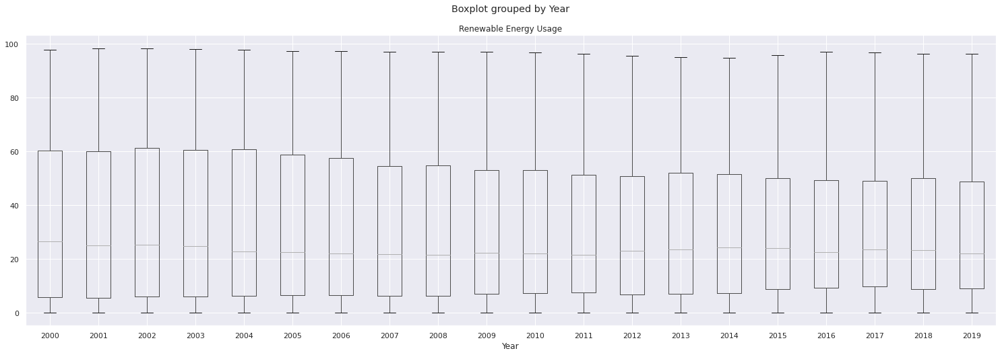

In [ ]:
# the stats for energy by year (boxplot)
df.boxplot(by="Year", column=["Renewable Energy Usage"], figsize=(25, 8))

In [ ]:
# the stats for energy by year (table)
df_energy.describe()

,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0
count,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000
mean,34.506702,34.046117,34.159255,33.769468,33.564362,33.312394,32.927447,32.390638,32.434096,32.499628,32.331383,32.001543,31.957181,32.128723,31.861383,31.516436,31.247766,31.067394,31.105000,30.883989
std,31.399434,31.353612,31.238387,30.953937,30.988772,30.863959,30.838331,30.517004,30.527604,30.164967,29.729378,29.483012,29.143956,28.904197,28.670138,28.335954,28.053734,27.829473,27.651192,27.460235
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.595000,5.410000,5.935000,6.047500,6.172500,6.437500,6.355000,6.237500,6.125000,6.940000,7.112500,7.305000,6.620000,6.920000,7.290000,8.752500,9.215000,9.585000,8.740000,8.872500
50%,26.540000,24.835000,25.330000,24.730000,22.815000,22.380000,21.860000,21.720000,21.540000,22.110000,21.990000,21.500000,23.005000,23.515000,24.165000,23.925000,22.455000,23.475000,23.210000,22.075000
75%,60.300000,60.002500,61.187500,60.627500,60.830000,58.720000,57.622500,54.500000,54.790000,53.100000,53.057500,51.275000,50.815000,51.895000,51.542500,49.955000,49.157500,48.927500,49.875000,48.632500
max,97.940000,98.340000,98.270000,97.970000,97.880000,97.420000,97.330000,97.170000,96.970000,97.020000,96.810000,96.210000,95.470000,95.080000,94.820000,95.820000,97.030000,96.700000,96.380000,96.240000


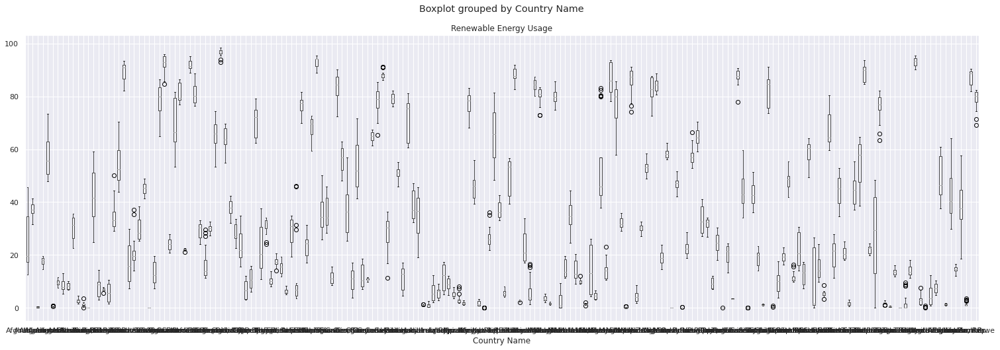

In [ ]:
# the stats for energy by country (boxplot)
df.boxplot(by="Country Name", column=["Renewable Energy Usage"], figsize=(25, 8))

In [ ]:
# the stats for energy by country (table)
df_energy.T.describe()

Country Name,Afghanistan,Angola,Albania,Andorra,United Arab Emirates,Argentina,Armenia,Antigua and Barbuda,Australia,Austria,...,Uzbekistan,St. Vincent and the Grenadines,"Venezuela, RB",Vietnam,Vanuatu,Samoa,"Yemen, Rep.",South Africa,Zambia,Zimbabwe
count,20.000000,20.000000,20.00000,20.000000,20.000000,20.0000,20.000000,20.000000,20.000000,20.000000,...,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,25.680500,57.697000,37.23600,17.652500,0.146500,9.5605,8.553000,0.200500,8.266500,30.108000,...,1.238500,5.335500,14.657000,38.514000,43.656000,43.783000,1.311500,11.549500,86.895500,79.012500
std,11.158775,8.505274,2.71723,1.477266,0.134918,1.1109,2.154284,0.312502,1.158812,4.449857,...,0.334684,1.060925,1.181632,11.135371,10.861383,6.599212,0.925494,1.827793,2.999971,3.606736
min,12.610000,47.840000,31.62000,14.510000,0.060000,7.6500,5.420000,0.000000,6.680000,22.560000,...,0.720000,3.320000,12.010000,18.650000,29.960000,34.210000,0.700000,9.770000,81.890000,69.260000
25%,17.362500,50.662500,35.83500,16.567500,0.100000,8.8200,6.957500,0.000000,7.100000,26.212500,...,0.937500,4.875000,13.970000,33.517500,35.970000,39.562500,0.760000,10.427500,84.317500,77.935000
50%,19.565000,55.565000,37.08000,17.985000,0.110000,9.3900,7.905000,0.000000,8.345000,31.230000,...,1.295000,5.310000,14.605000,37.625000,40.270000,42.895000,0.835000,10.855000,88.635000,80.190000
75%,34.575000,62.882500,39.13750,18.855000,0.122500,10.4075,9.942500,0.232500,9.312500,34.177500,...,1.510000,5.822500,15.397500,44.630000,49.100000,48.837500,1.300000,11.900000,89.377500,81.650000
max,45.600000,73.440000,41.36000,19.450000,0.670000,11.6200,13.150000,0.910000,10.130000,35.670000,...,1.750000,8.490000,16.640000,57.730000,64.260000,59.690000,3.600000,16.250000,90.320000,82.460000


Finally, from the above charts is it clear that in terms of year, there are no outliers, whereas in terms of country, there are many more. This is very different from the trends seen in health expenditure per capita and greenhouse gas emissions. For renewable energy usage, countries seems to be fairly inconsistent on their own, but in comparison to each other, there seems to be an overall "average" in renewable energy usage that can be applied to all countries.  

g. Ratio Graphs

In [ ]:
# creating 2 metrics for VERY GENERALLY evaluating hypothesis #1 & #2
df['h1'] = df['Renewable Energy Usage']/df['Greenhouse Gas Emission']
df['h2'] = df['Health Expenditure']/df['Greenhouse Gas Emission']

# previewing the changes made to the dataset
df.head()

,Country Name,Income Group,Year,Health Expenditure,Greenhouse Gas Emission,Renewable Energy Usage,h1,h2
0,Afghanistan,Low income,2000,12.998967,13890.000343,44.99,0.003239,0.000936
1,Afghanistan,Low income,2001,28.918121,12250.000000,45.60,0.003722,0.002361
2,Afghanistan,Low income,2002,15.803164,14890.000343,37.83,0.002541,0.001061
3,Afghanistan,Low income,2003,17.035744,15529.999733,36.66,0.002361,0.001097
4,Afghanistan,Low income,2004,20.412764,15310.000420,44.24,0.002890,0.001333


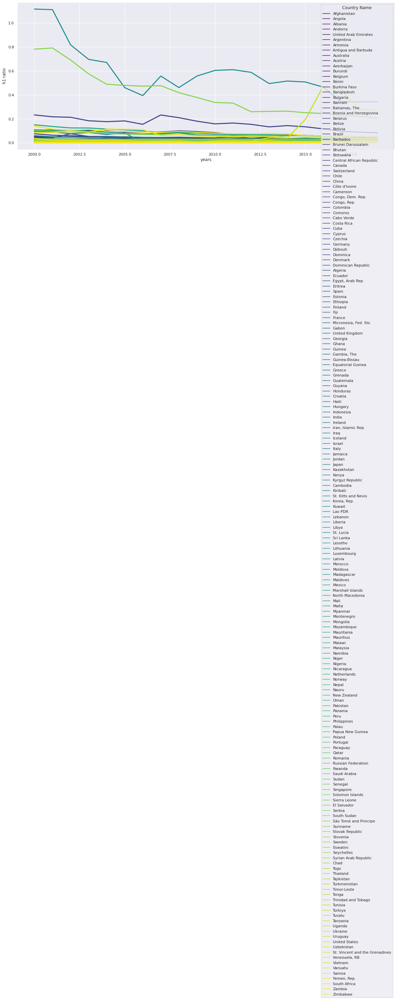

In [ ]:
# graph of h1 ratio over the years, by country
sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(20,8)})

ax = sns.lineplot(data=df, x ='Year', y = 'h1',
                  hue='Country Name', palette='viridis',
                  legend='full', lw=3)

plt.ylabel('h1 ratio')
plt.xlabel('years')
plt.show()

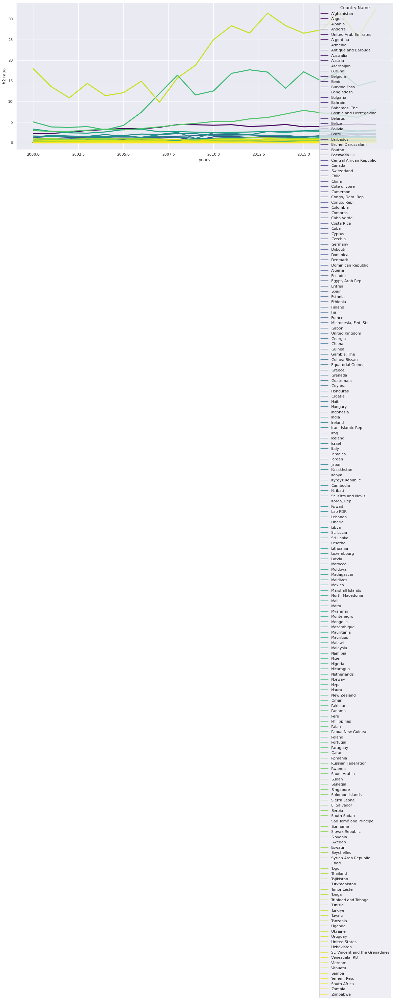

In [ ]:
# graph of h2 ratio over the years, by country
sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(20,8)})

ax = sns.lineplot(data=df, x ='Year', y = 'h2',
                  hue='Country Name', palette='viridis',
                  legend='full', lw=3)

plt.ylabel('h2 ratio')
plt.xlabel('years')
plt.show()

As you can see, the majority of lines seem to lie fairly flat, and are congregated in the lower region of each graph. This is a good sign, suggesting that there is a correlation. The lines that are not a part of that region (or that stick out from it) are outliers, though. The outliers were expected, considering that those were examined in the EDA graphs, but below we are going to examine the outliers and see if there is possibly any observable pattern there. 

In [ ]:
# viewing stats to identify outliers
df.describe()

,Year,Health Expenditure,Greenhouse Gas Emission,Renewable Energy Usage,h1,h2
count,3760.000000,3760.000000,3.760000e+03,3760.000000,3760.000000,3760.000000
mean,2009.500000,844.030247,2.147967e+05,32.485545,0.012919,0.335283
std,5.767048,1518.211938,8.854965e+05,29.678787,0.059613,1.948056
min,2000.000000,4.335375,2.000000e+01,0.000000,0.000000,0.000009
25%,2004.750000,61.043073,7.655000e+03,6.687500,0.000056,0.001455
50%,2009.500000,239.681892,2.957000e+04,22.920000,0.000900,0.007507
75%,2014.250000,773.134567,9.980750e+04,54.537500,0.003774,0.042917
max,2019.000000,10921.012695,1.270509e+07,98.340000,1.117000,32.420415


In [ ]:
# viewing outlier countries/income groups
def view_outliers(h, p75, metric):
  outliers = []

  for i, r in df.iterrows():
    if r[h] > p75:
      outliers.append(r[metric])

  print('Num: ', len(Counter(outliers)))
  print(Counter(outliers))
  print()

view_outliers('h1', .003774, 'Country Name')
view_outliers('h1', .003774, 'Income Group')
view_outliers('h2', .042917, 'Country Name')
view_outliers('h2', .042917, 'Income Group')

Num:  69
Counter({'Andorra': 20, 'Burundi': 20, 'Belize': 20, 'Bhutan': 20, 'Comoros': 20, 'Cabo Verde': 20, 'Djibouti': 20, 'Dominica': 20, 'Eritrea': 20, 'Fiji': 20, 'Micronesia, Fed. Sts.': 20, 'Gabon': 20, 'Gambia, The': 20, 'Guinea-Bissau': 20, 'Grenada': 20, 'Haiti': 20, 'Iceland': 20, 'Kiribati': 20, 'Liberia': 20, 'St. Lucia': 20, 'Lesotho': 20, 'Marshall Islands': 20, 'Montenegro': 20, 'Malawi': 20, 'Rwanda': 20, 'Solomon Islands': 20, 'Sierra Leone': 20, 'São Tomé and Principe': 20, 'Eswatini': 20, 'Togo': 20, 'Tonga': 20, 'St. Vincent and the Grenadines': 20, 'Vanuatu': 20, 'Samoa': 20, 'Central African Republic': 19, 'Congo, Rep.': 18, 'Guyana': 18, 'Albania': 17, 'Benin': 16, 'Tajikistan': 16, 'Lao PDR': 15, 'Suriname': 15, 'St. Kitts and Nevis': 13, 'Guinea': 11, 'Timor-Leste': 10, 'Tuvalu': 10, 'Burkina Faso': 8, 'Papua New Guinea': 8, 'Mauritania': 7, 'Nicaragua': 7, 'Uganda': 7, 'Mozambique': 5, 'Mauritius': 5, 'Niger': 5, 'Georgia': 4, 'Cambodia': 4, 'Mali': 4, "Côte 

As we can see above, 69 countries are outliers in terms of "h1", with 34/69 having all 20 values for 2000-2019 as outliers. The remainder only had outlying values some years between 2000-2019. Alternatively, 59 countries are outliers in terms of "h2", with 33/59 having all 20 values for 2000-2019 as outliers. 

In terms of income group, 68.21% of outliers for "h1" were "Middle Income" (with 39.10% being "Lower Middle Income" and 29.11% being "Upper Middle Income"), 25.50% were "Low Income" and 6.26% were "High Income". This is interesting, in that "Middle Income" and "Low Income" countries contributed the most to renewable energy usage, whereas "High Income" countries barely did. Alternatively, 47.34% of outliers for "h2" were "High Income", 30% were "Upper Middle Income" and 22.65% were "Lower Middle Income". It makes sense that "Lower Income" wouldn't have outliers in terms of health expenditure's ratio to greenhouse gas emission (since health expenditure requires money).

**Task 4: Model Development and Application of Models**


Our first proposed hypothesis is: If renewable energy usage is high in a particular country during a particular year, then greenhouse gas emissions will be low in that same country during the same year. The first model we use to answer this hypothesis will be linear regression. The variables used for the linear regression are the renewable energy data for each country, and the greenhouse gas data for each country. Since we assume that changes in how much renewable energy a country uses will effect the amount of greenhouse gases in the atmosphere of that country, we used the renewable energy data for the x-axis and the greenhouse gas emissions data for the y-axis. Graphs relating renewable energy data to greenhouse gas emissions data for each country were made. Once the graphs were examined, it was determined that a linear model would be a good, although imperfect fit.

R-squared: 0.8478196825551076


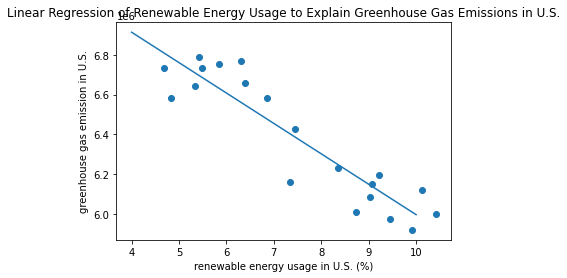

In [ ]:
# first for the US
x = np.array(df_energy.T['United States'])
y = np.array(df_gas.T['United States'])

i = 0
while i < len(x):
  if math.isnan(x[i]):
    x = np.delete(x, i)
    y = np.delete(y, i)
  elif math.isnan(y[i]):
    x = np.delete(x, i)
    y = np.delete(y, i)
  else:
    i += 1

x = np.reshape(x, (-1,1))

model = LinearRegression()
model.fit(x,y)
r_sq = model.score(x, y)
print("R-squared: {}".format(r_sq))

x_model = np.arange(4,11).reshape((-1,1))
y_model = model.predict(x_model)

plt.scatter(x,y , label='greenhouse gas emission')
plt.plot(x_model, y_model)

plt.title('Linear Regression of Renewable Energy Usage to Explain Greenhouse Gas Emissions in U.S.')
plt.ylabel('greenhouse gas emission in U.S.')
plt.xlabel('renewable energy usage in U.S. (%)')
plt.show()

R-squared: 0.8817134222894935


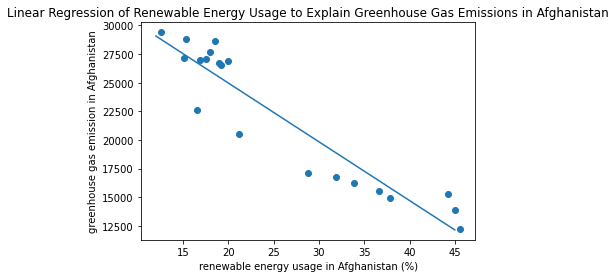

R-squared: 0.8823402194746328


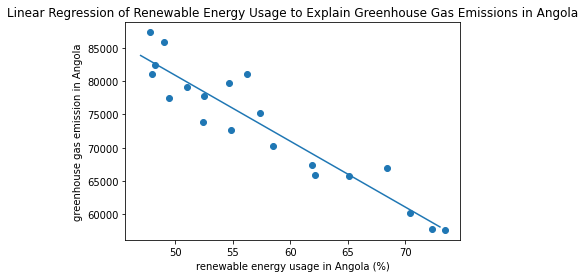

R-squared: 0.020641225484844816


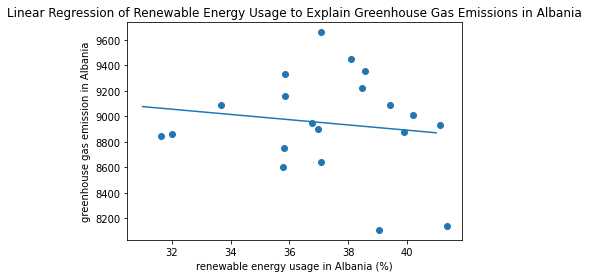

R-squared: 0.08816264033401866


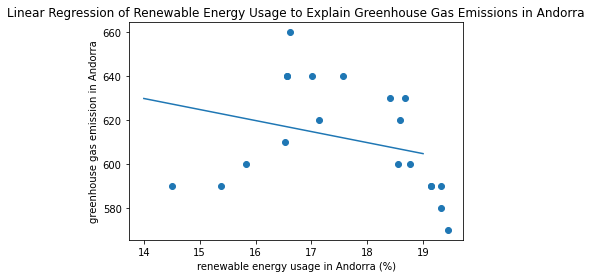

R-squared: 0.20617117031976628


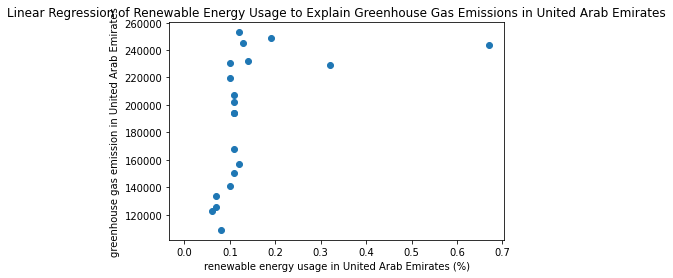

R-squared: 0.17022204654431194


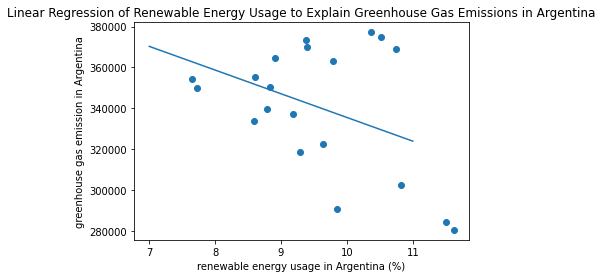

R-squared: 0.12607415574726322


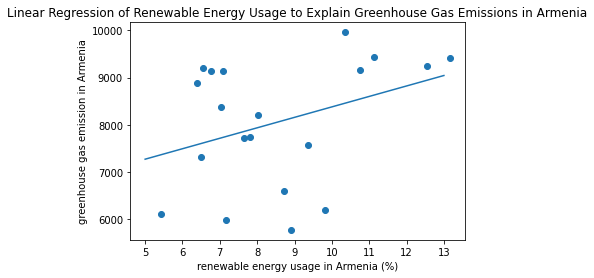

R-squared: 0.12424933240595692


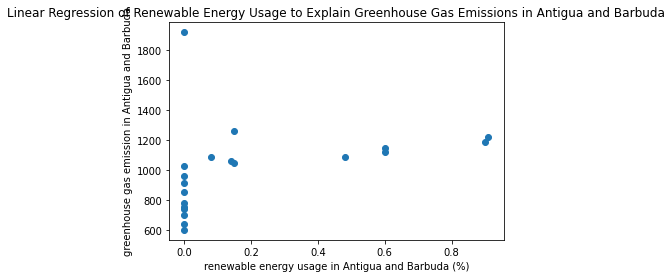

R-squared: 0.050109778667386085


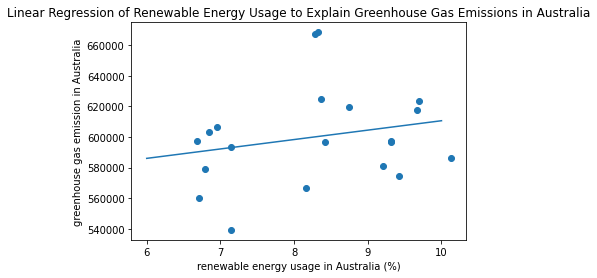

R-squared: 0.7470049179200956


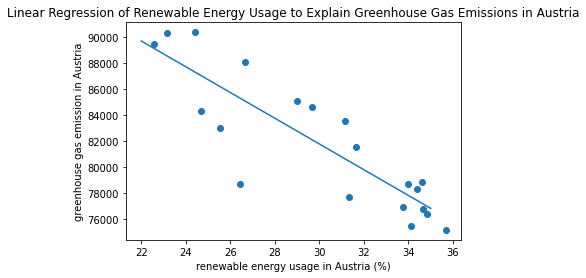

R-squared: 0.12211794716827529


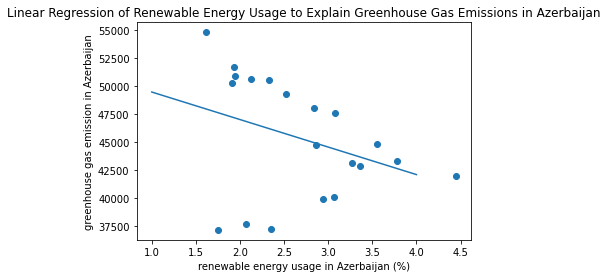

R-squared: 0.9017295866378638


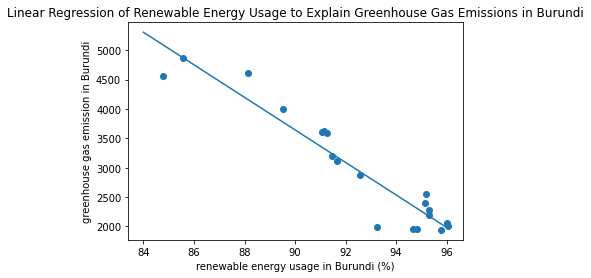

R-squared: 0.8956795155276127


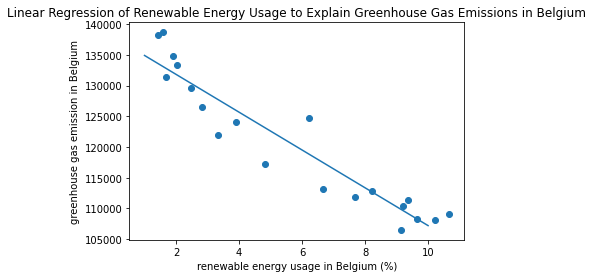

R-squared: 0.8305573786995455


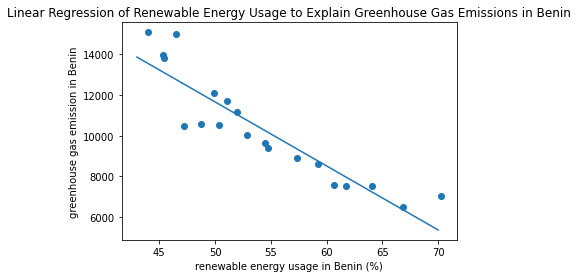

R-squared: 0.7284096782520315


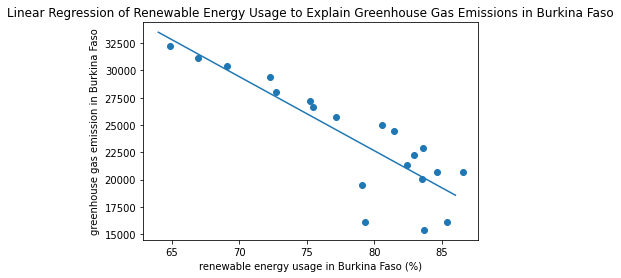

R-squared: 0.9943217149754736


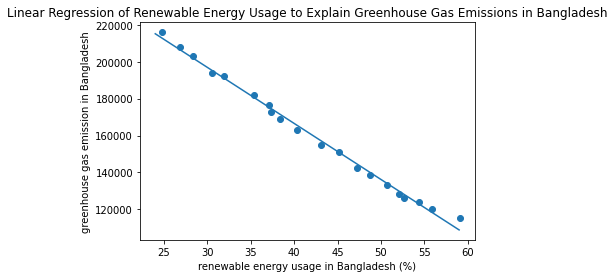

R-squared: 0.5913534077343813


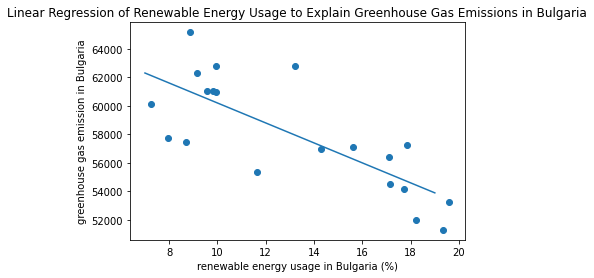

R-squared: 0.0


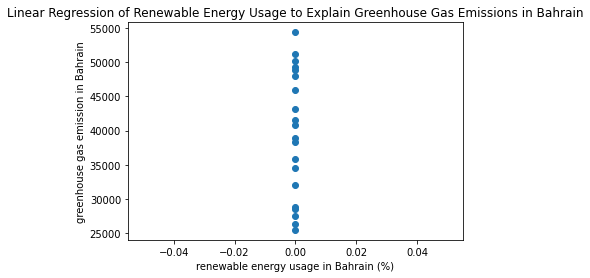

R-squared: 0.0002920726564489273


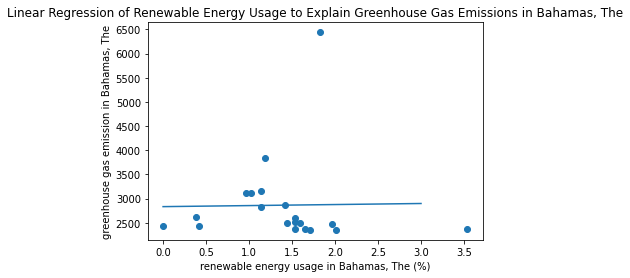

R-squared: 0.009306100920167926


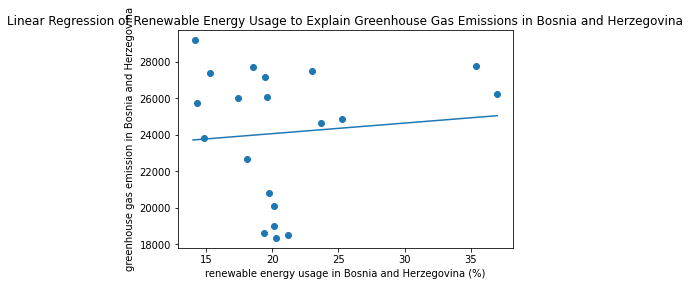

R-squared: 0.5340786091492733


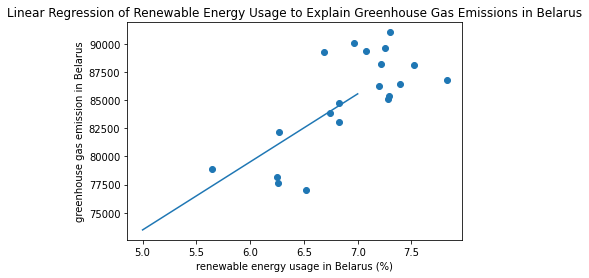

R-squared: 0.010161903102835379


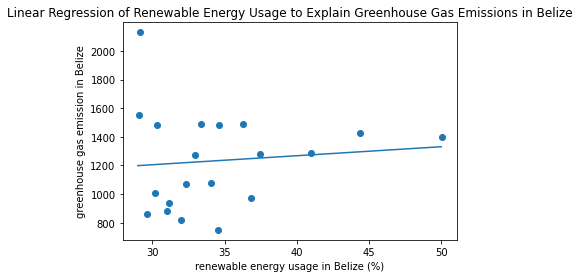

R-squared: 0.983029278987864


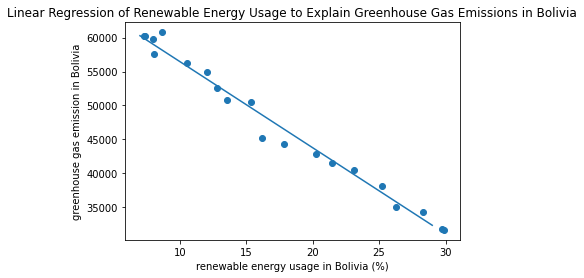

R-squared: 0.0015347305679618284


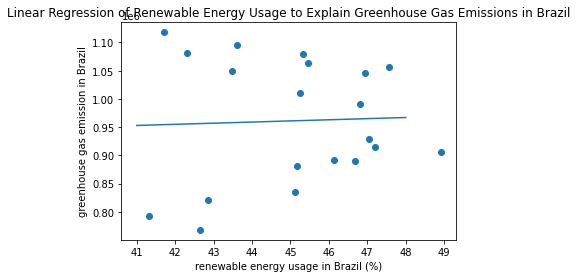

R-squared: 9.023712798128525e-05


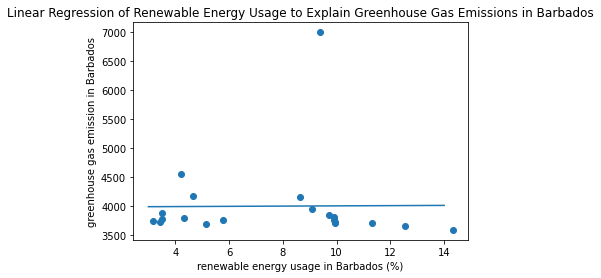

R-squared: 0.1874793792962557


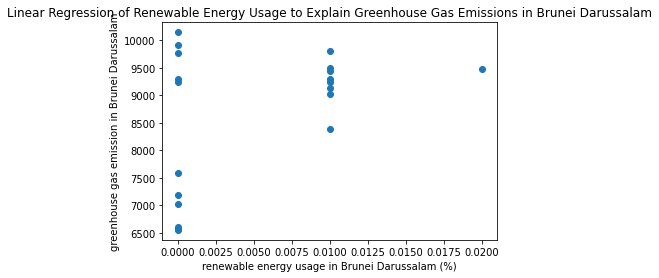

R-squared: 0.9371723717707275


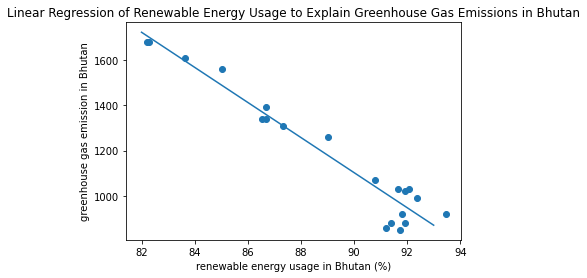

R-squared: 0.005711851719584327


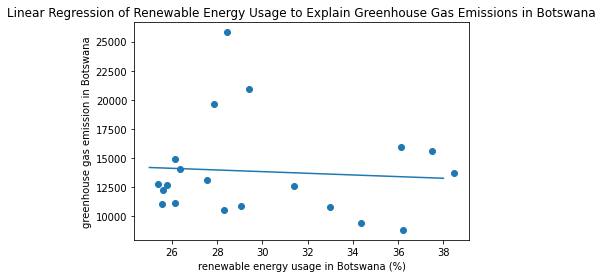

R-squared: 0.031188268282796416


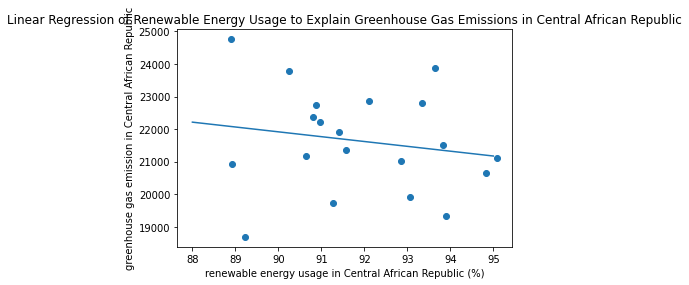

R-squared: 0.12263837528892252


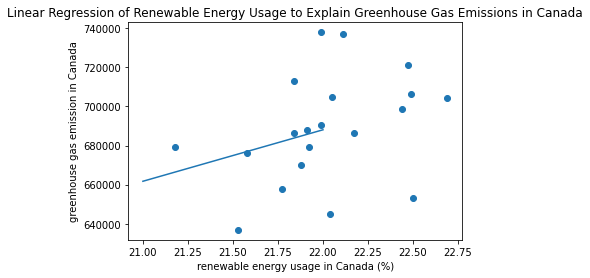

R-squared: 0.7954869310443589


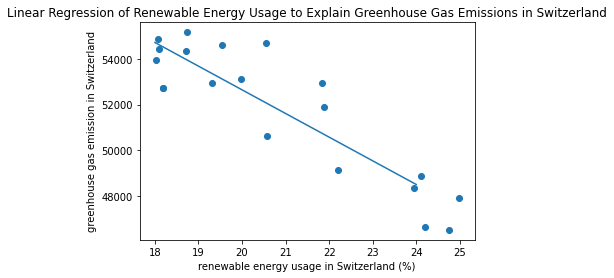

R-squared: 0.7231361628460342


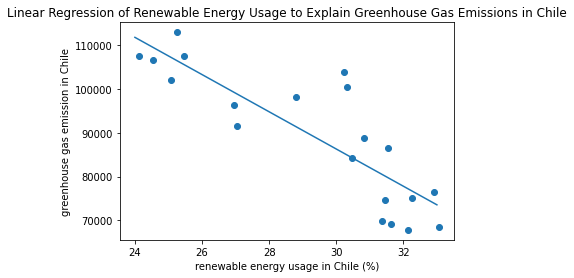

R-squared: 0.8160280312219794


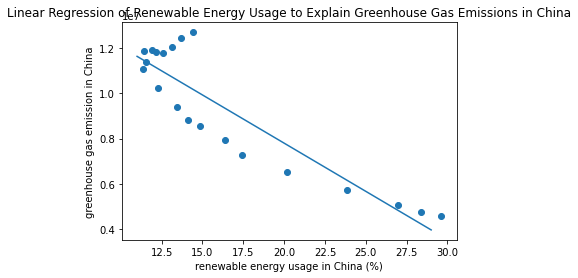

R-squared: 0.6733717740102615


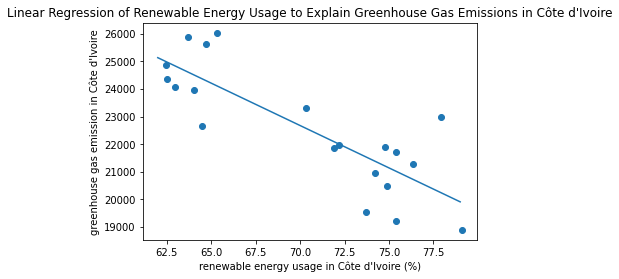

R-squared: 0.33831898612732847


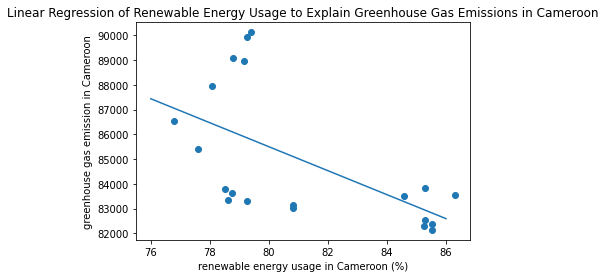

R-squared: 0.34611598740268534


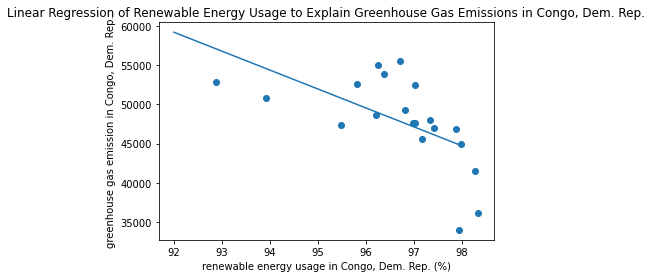

R-squared: 0.0429730898299725


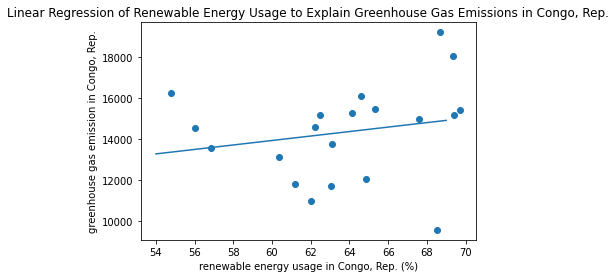

R-squared: 0.4365433720715691


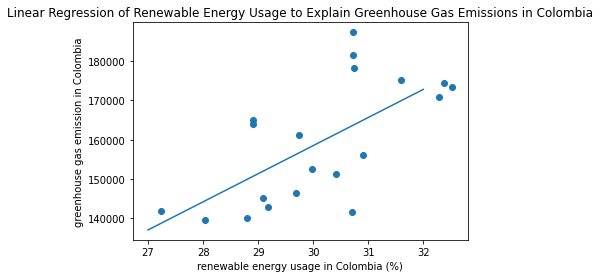

R-squared: 0.7539437191954077


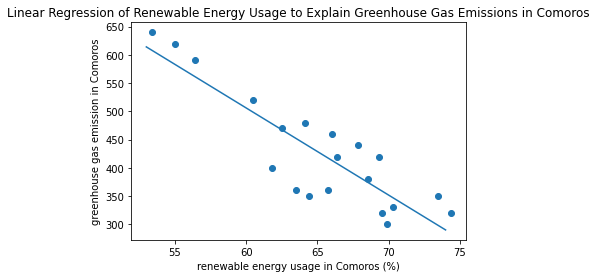

R-squared: 0.4554063273157989


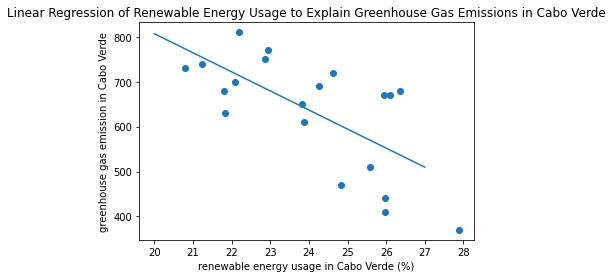

R-squared: 0.041832341939471385


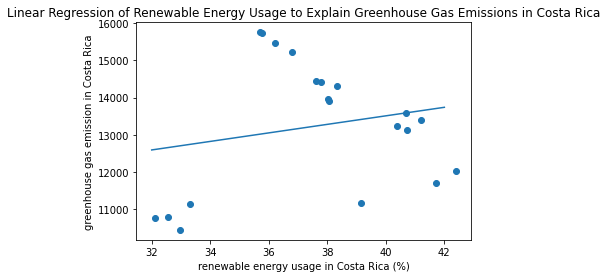

R-squared: 0.15511635749642594


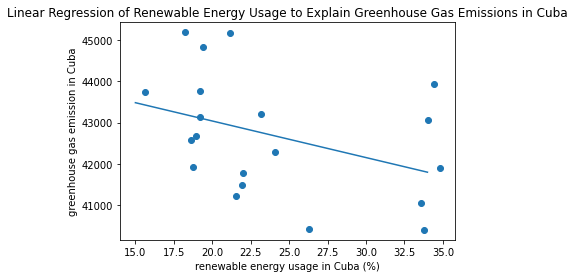

R-squared: 0.09306231276070698


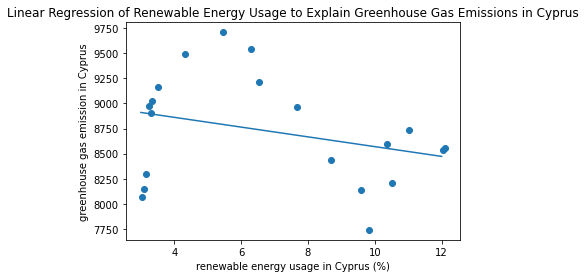

R-squared: 0.9603000032622714


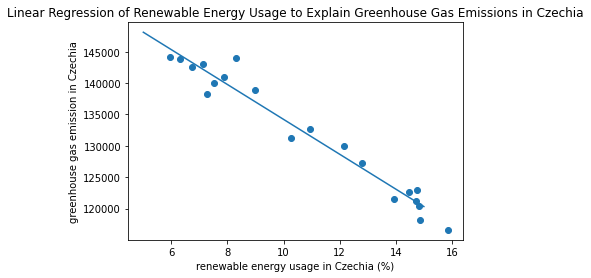

R-squared: 0.898991287910756


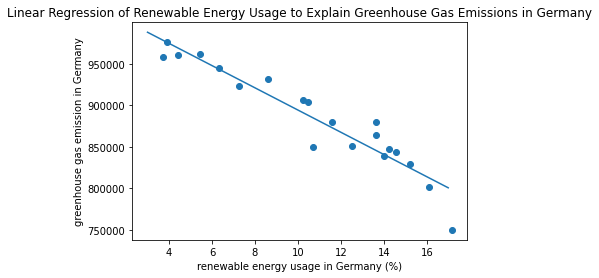

R-squared: 0.011933578911786702


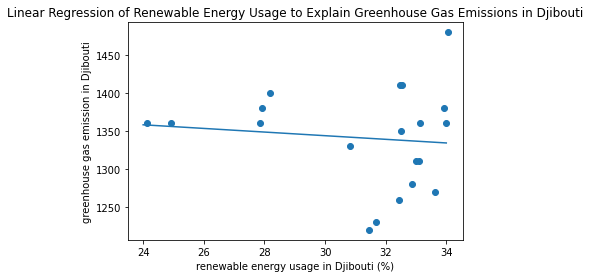

R-squared: 0.04888779406839694


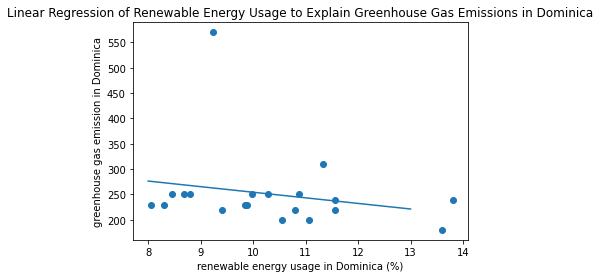

R-squared: 0.9506296811353294


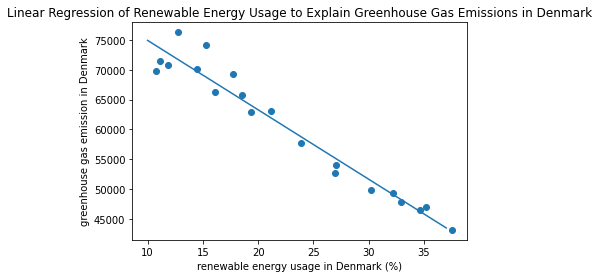

R-squared: 0.8613801824894252


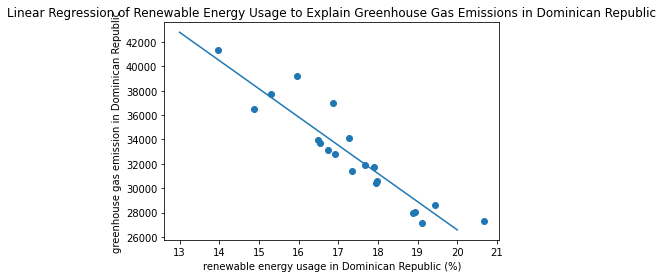

R-squared: 0.7703558107888684


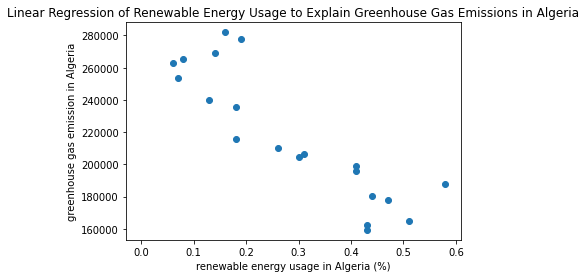

R-squared: 0.44769272089088075


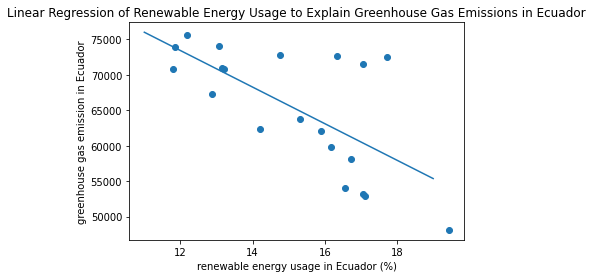

R-squared: 0.9309041842036561


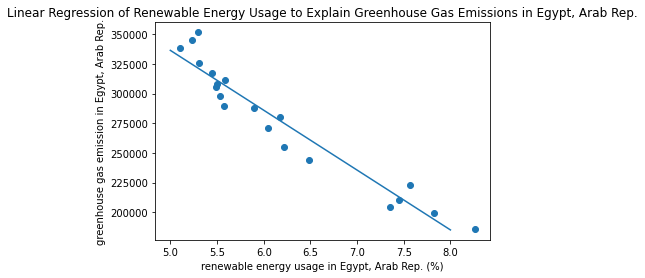

R-squared: 0.021383889547872292


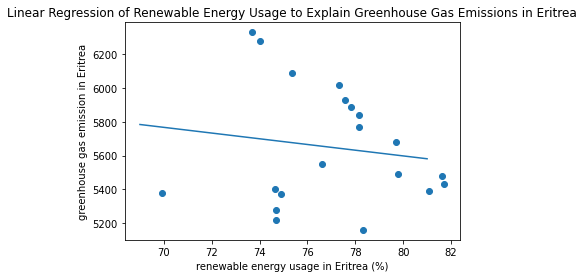

R-squared: 0.8276250768277974


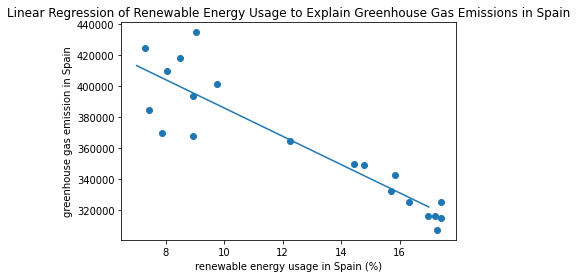

R-squared: 0.12042225975901222


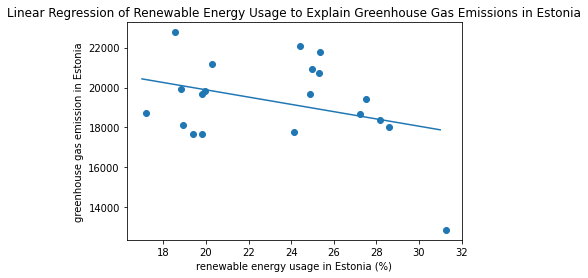

R-squared: 0.834076047310046


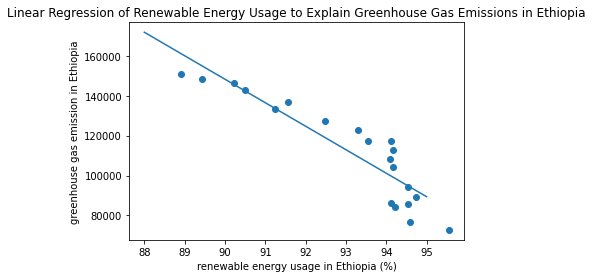

R-squared: 0.8754562668916641


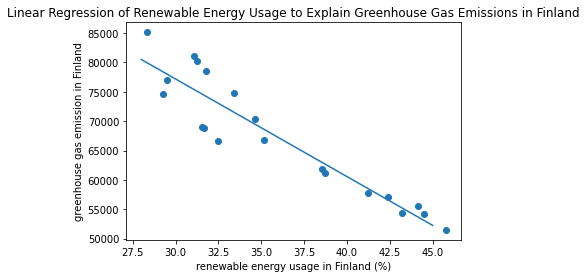

R-squared: 0.08673758257092057


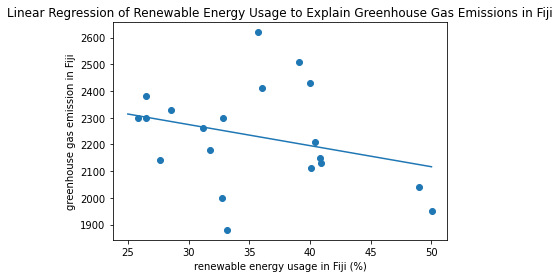

R-squared: 0.9094139956327374


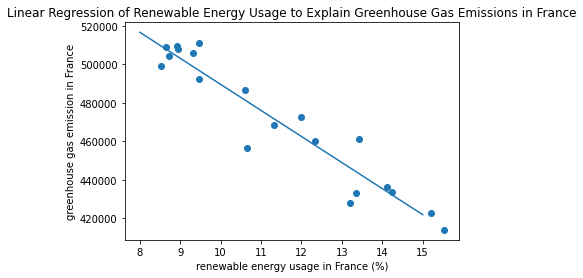

R-squared: 0.019872508738213113


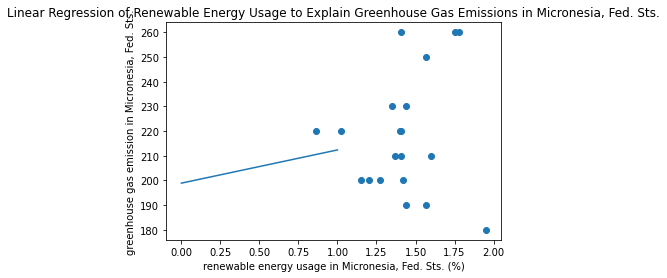

R-squared: 0.22970584647718217


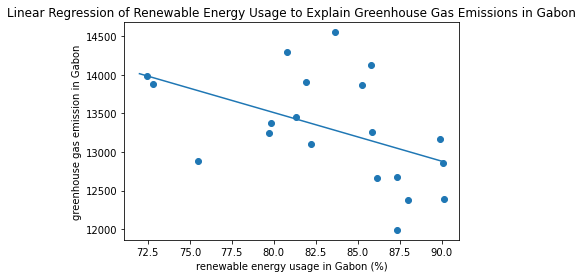

R-squared: 0.9572562420510443


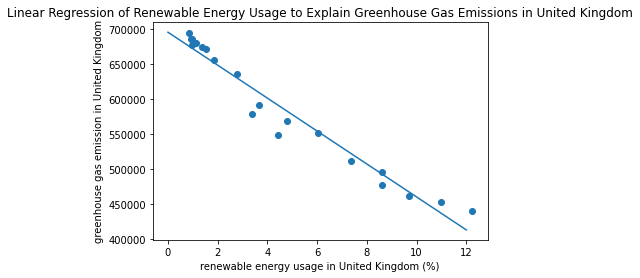

R-squared: 0.730966756385916


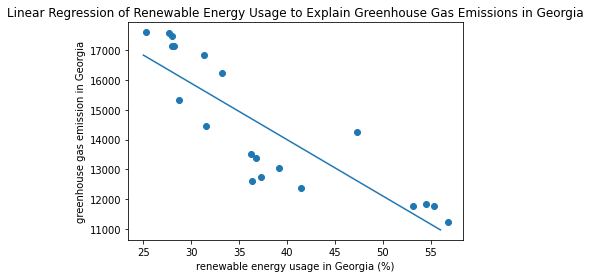

R-squared: 0.8731772648520484


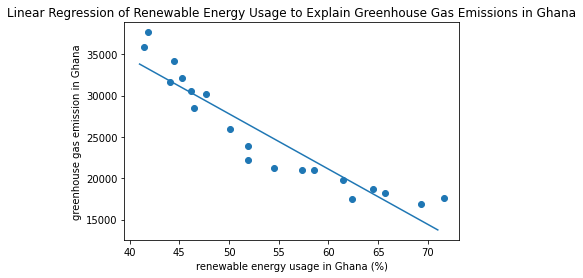

R-squared: 0.8730444112267489


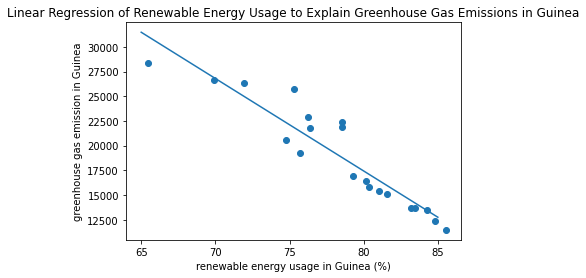

R-squared: 0.44389814379091586


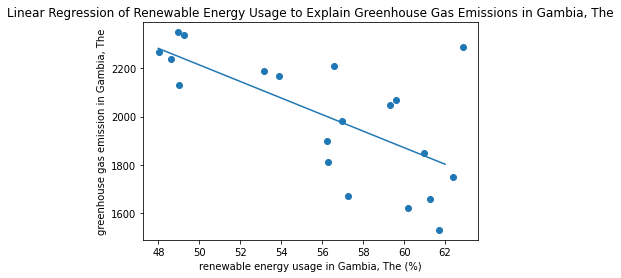

R-squared: 0.7229725325794736


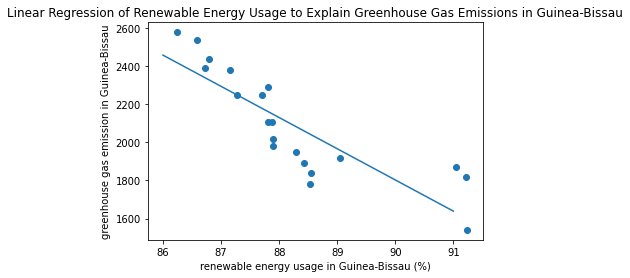

R-squared: 0.6381027400907981


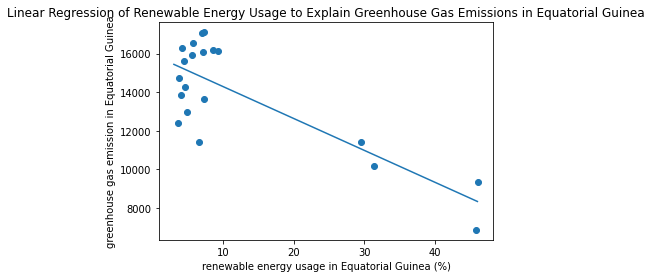

R-squared: 0.962648859485089


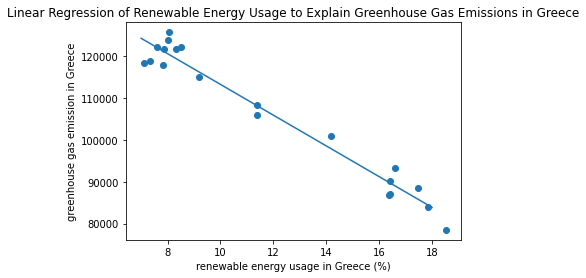

R-squared: 0.056980971015859194


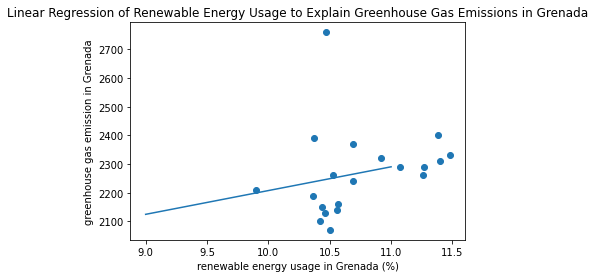

R-squared: 0.0008836523977931998


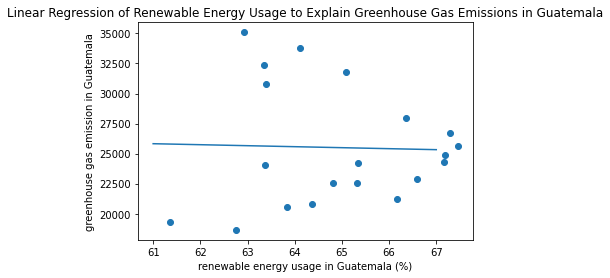

R-squared: 0.9024395298248017


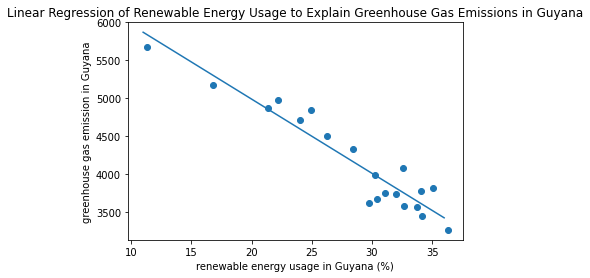

R-squared: 0.02427051321914775


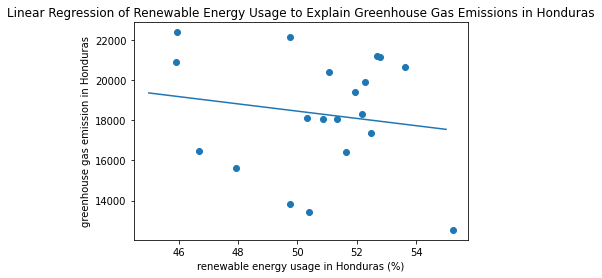

R-squared: 0.8887742822646578


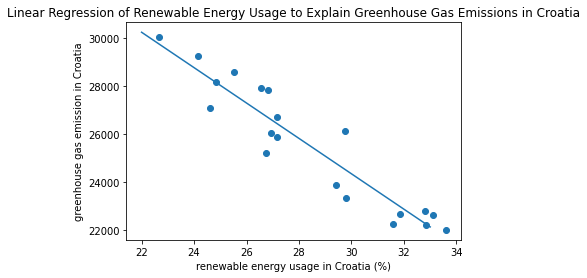

R-squared: 0.6723707574520861


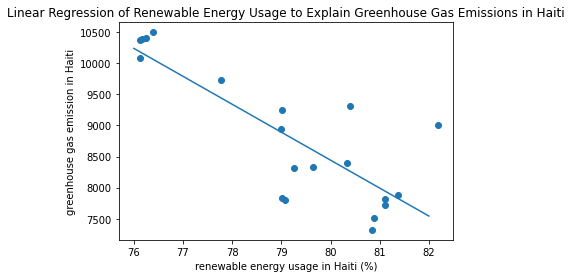

R-squared: 0.9544056606864222


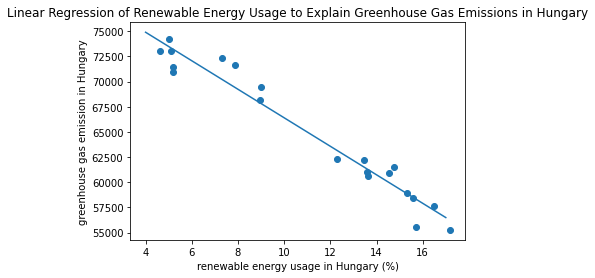

R-squared: 0.9629371109394678


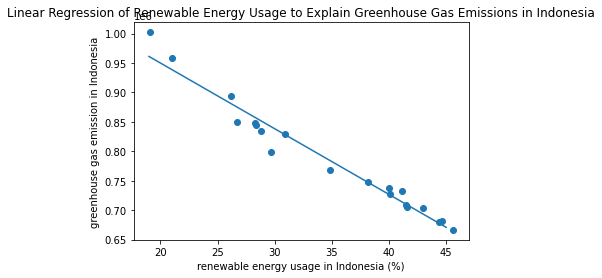

R-squared: 0.9448996992069698


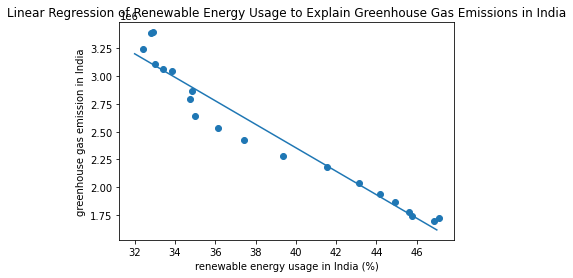

R-squared: 0.698202321919092


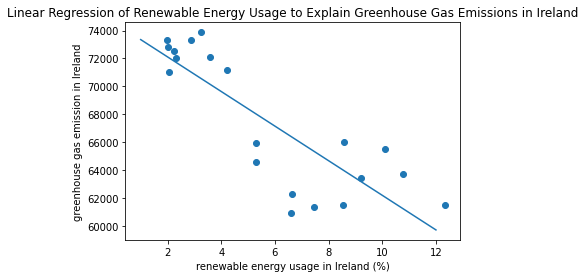

R-squared: 0.19182893340718943


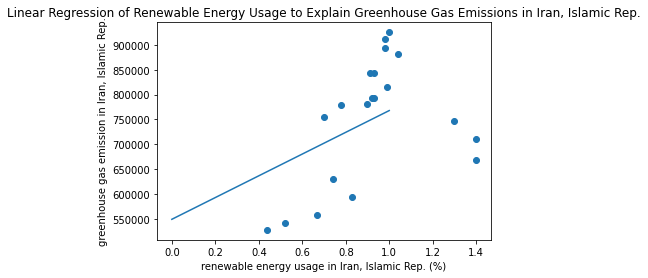

R-squared: 0.08590948152644018


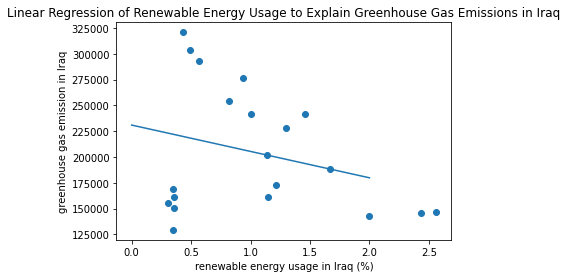

R-squared: 0.36506587162323156


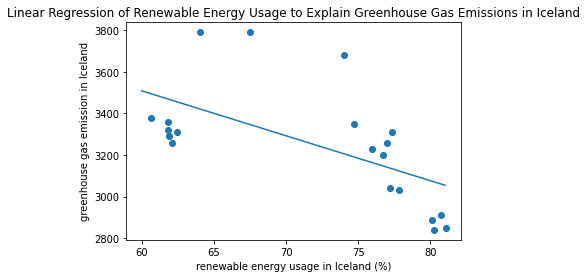

R-squared: 0.10810660850469644


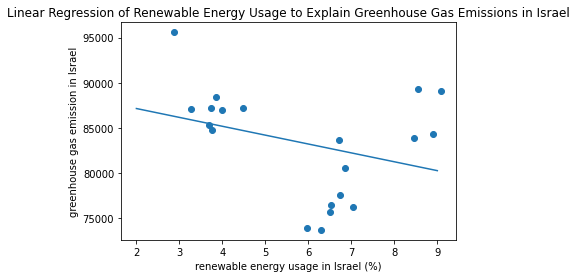

R-squared: 0.8866792924237756


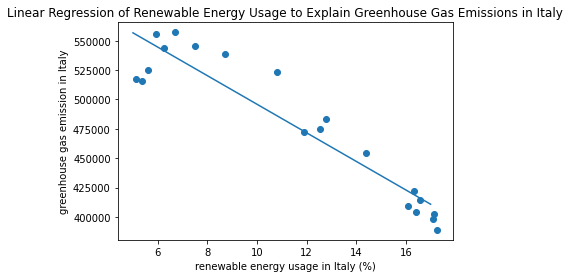

R-squared: 0.7129637648125737


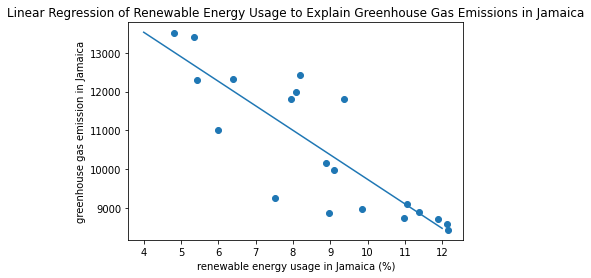

R-squared: 0.5945194451988669


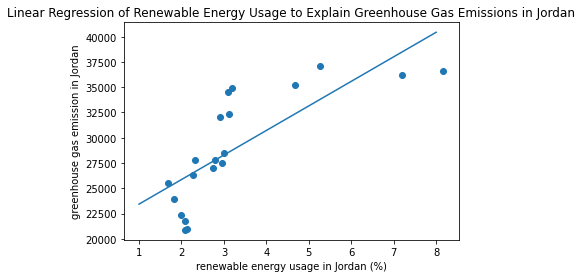

R-squared: 0.19042900014082498


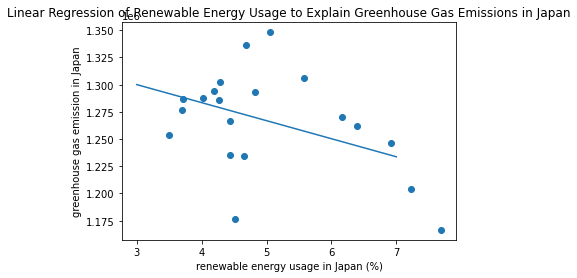

R-squared: 0.7519935397483509


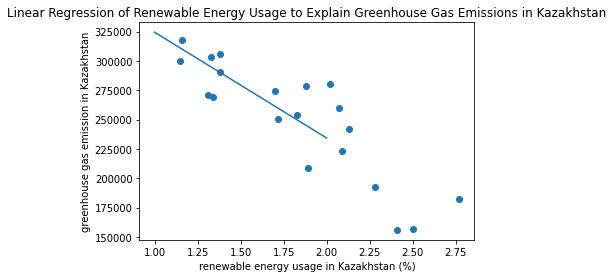

R-squared: 0.7432479030849355


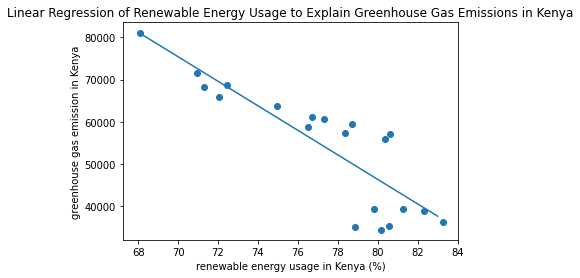

R-squared: 0.4754371916927198


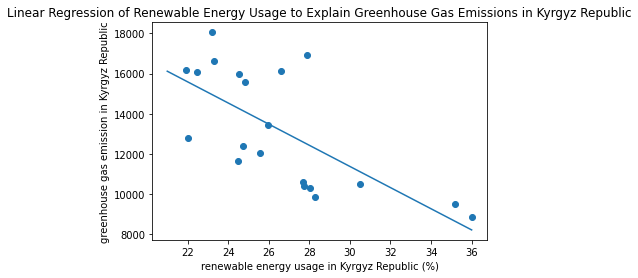

R-squared: 0.9306703445757005


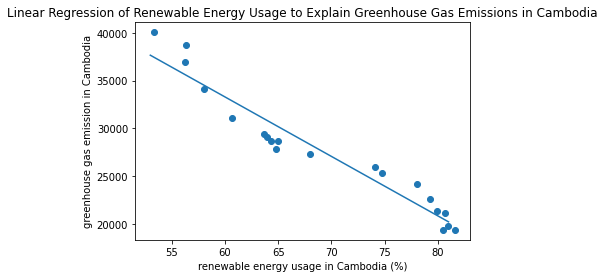

R-squared: 0.7318848995927032


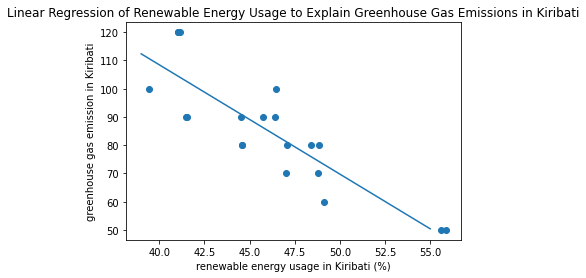

R-squared: 0.1144604388602245


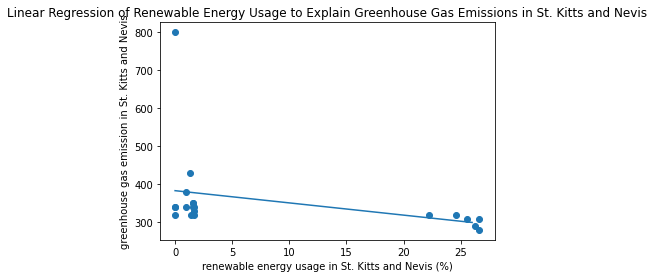

R-squared: 0.7932478595337866


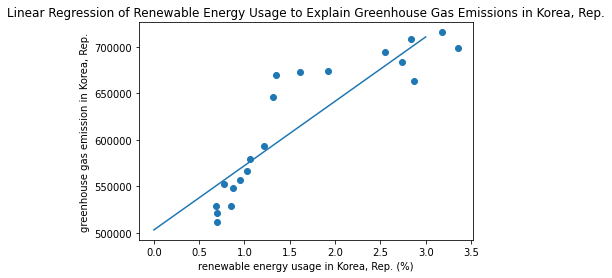

R-squared: 0.3528855441291251


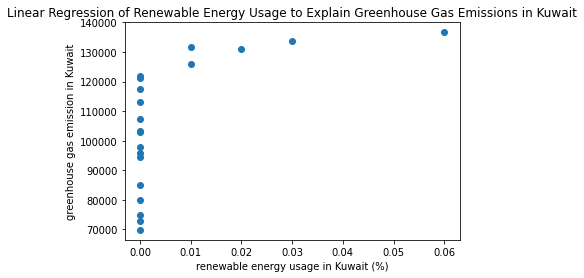

R-squared: 0.791338527717895


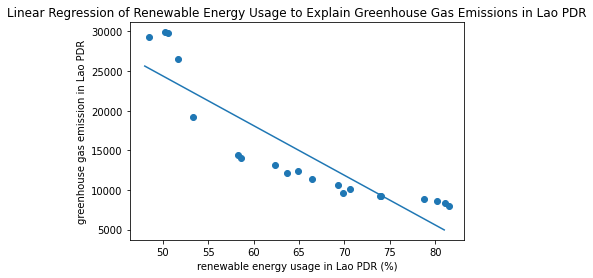

R-squared: 0.4360155717497418


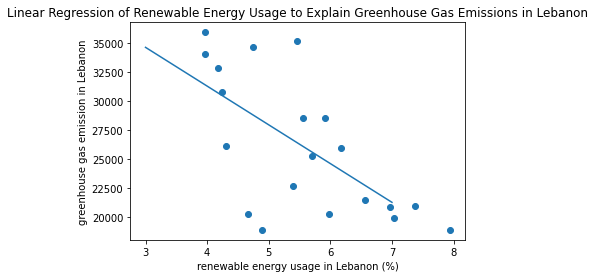

R-squared: 0.7316581553068231


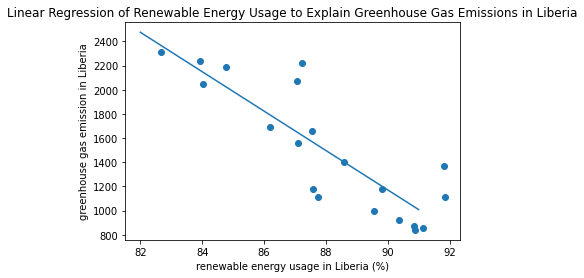

R-squared: 0.05944085873980387


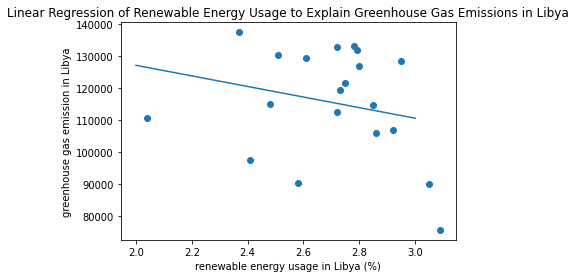

R-squared: 0.146733402920165


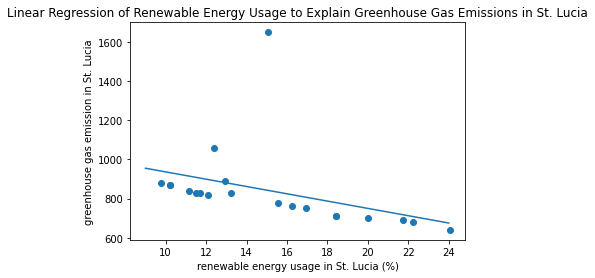

R-squared: 0.9073936590212102


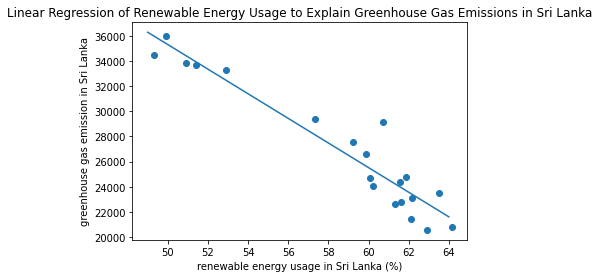

R-squared: 0.7059407850094286


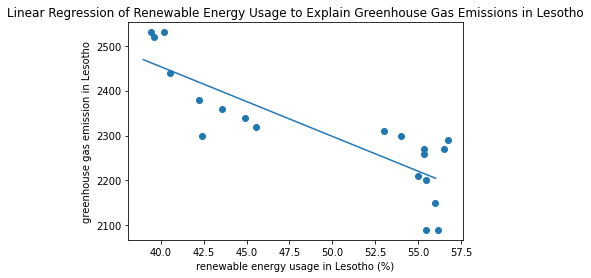

R-squared: 0.5346287778543248


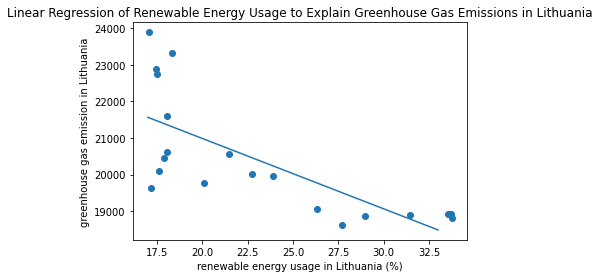

R-squared: 0.4224904496366714


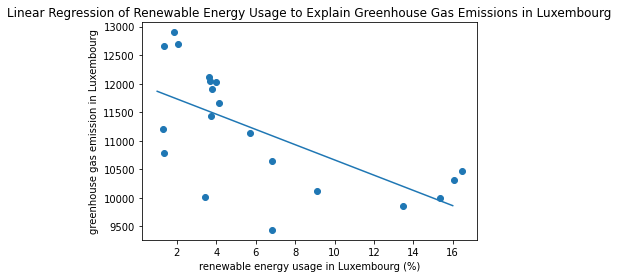

R-squared: 0.06630485129955443


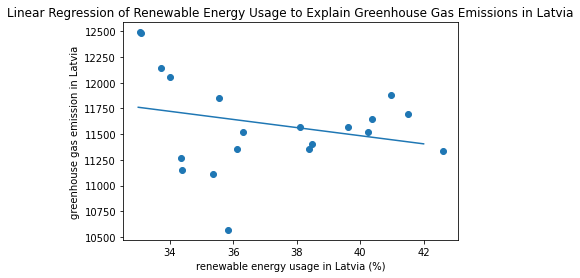

R-squared: 0.5312789600837056


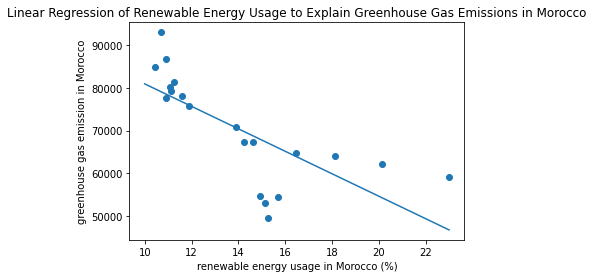

R-squared: 0.25268355554218813


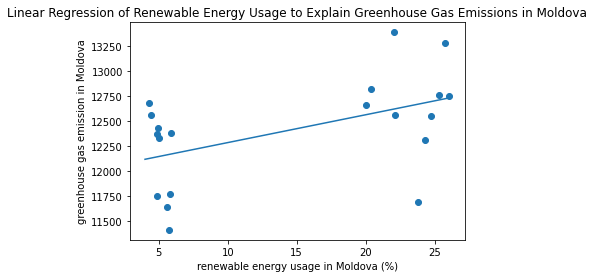

R-squared: 0.14259635526690506


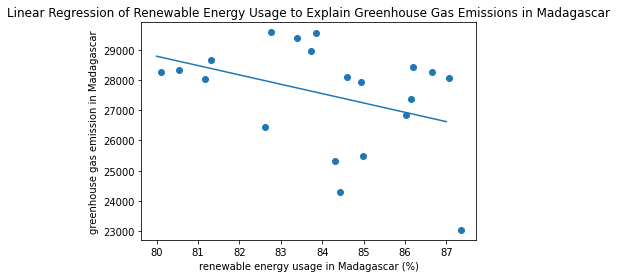

R-squared: 0.6429173885031012


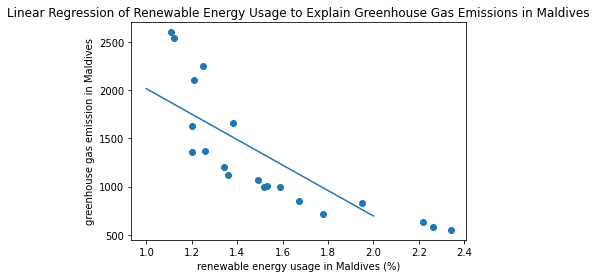

R-squared: 0.6648324179661211


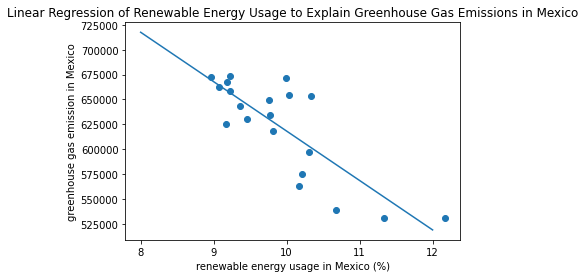

R-squared: 0.6700419291772767


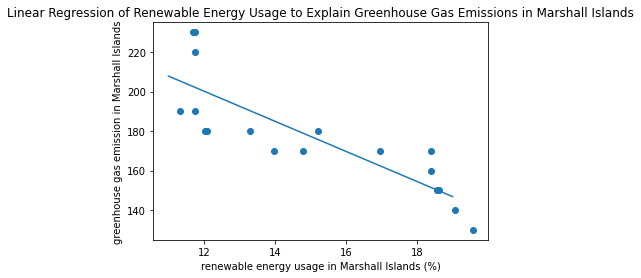

R-squared: 0.3188178733802568


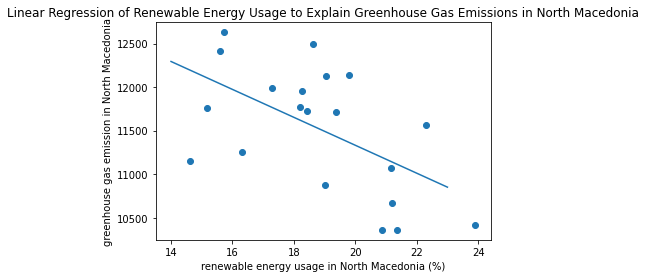

R-squared: 0.5694878346840879


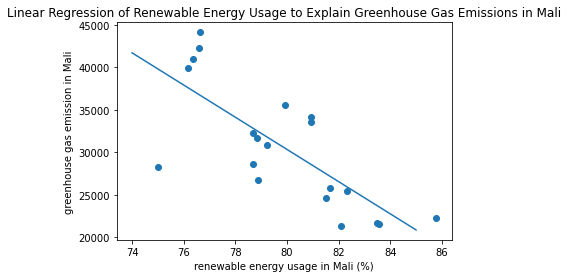

R-squared: 0.6702626516864718


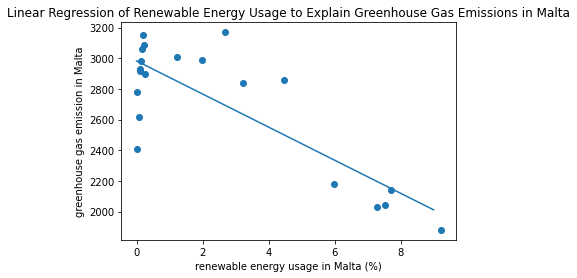

R-squared: 0.8290605584522668


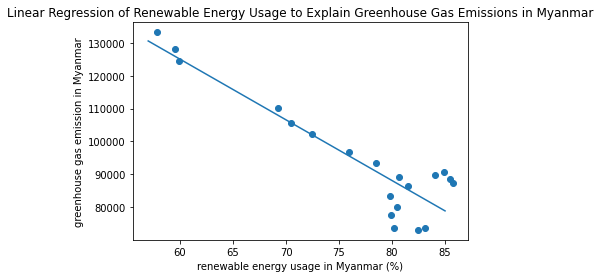

R-squared: 0.24306738334445666


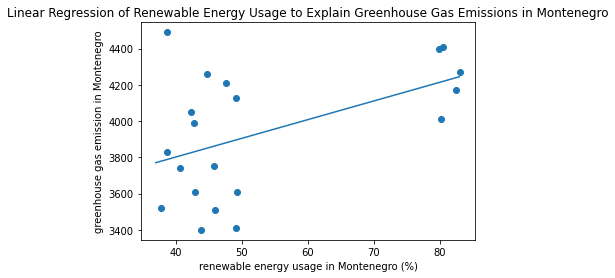

R-squared: 0.756005621477845


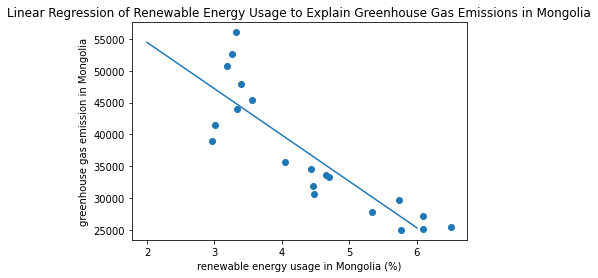

R-squared: 0.827980255781935


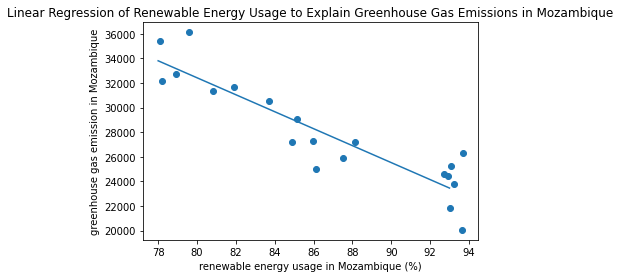

R-squared: 0.8686490950885848


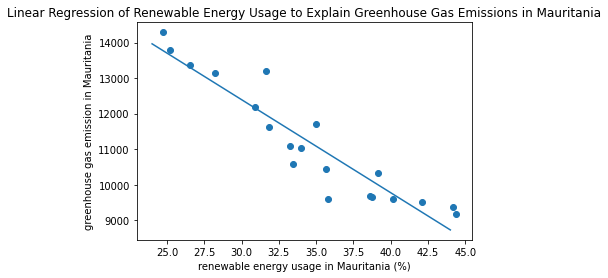

R-squared: 0.9509174694276952


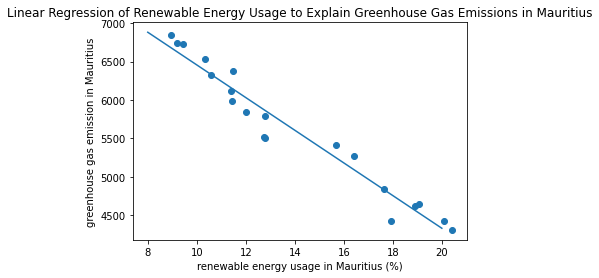

R-squared: 0.8003291666722605


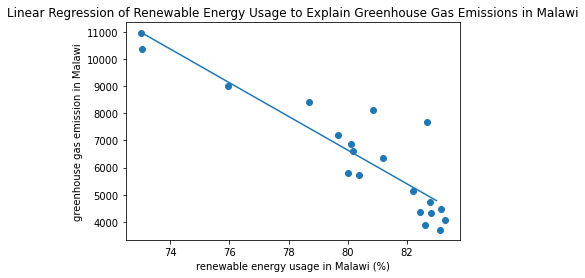

R-squared: 0.03110069008031935


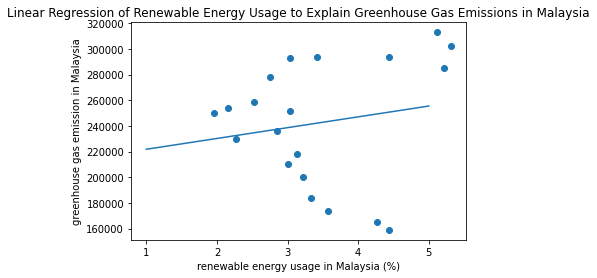

R-squared: 0.034145026682914525


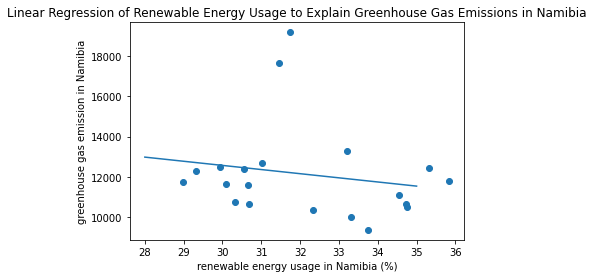

R-squared: 0.4551143210549182


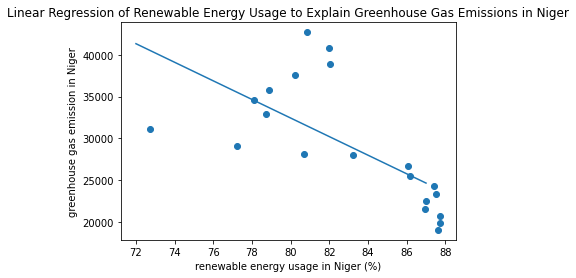

R-squared: 0.7383130339190171


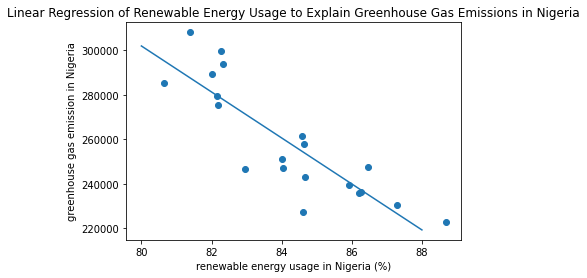

R-squared: 0.5469297771965045


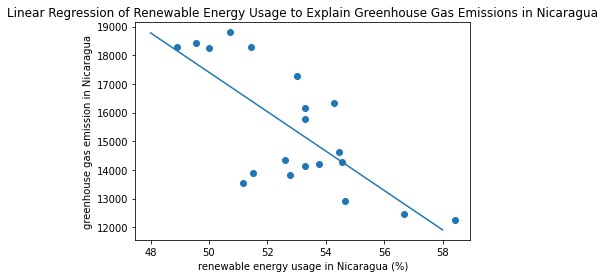

R-squared: 0.9255698210381061


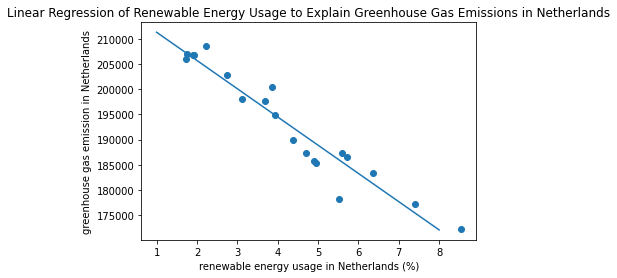

R-squared: 0.6231948213493426


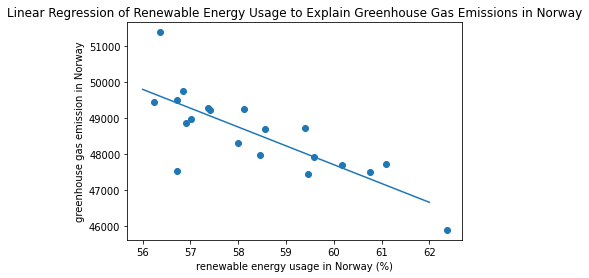

R-squared: 0.9193826936820186


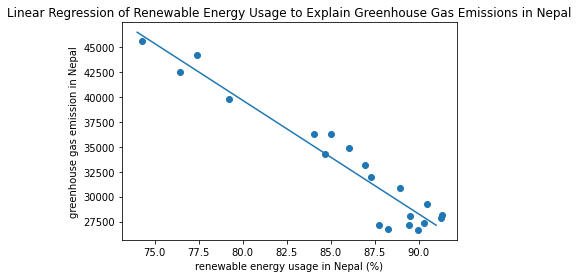

R-squared: 0.009442105352032715


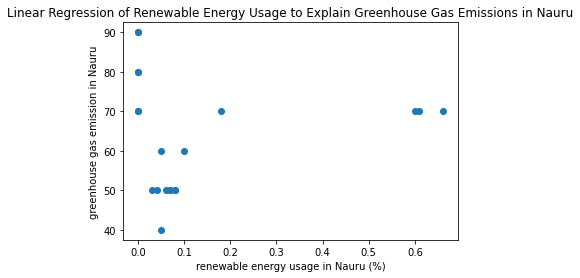

R-squared: 0.03719266090537754


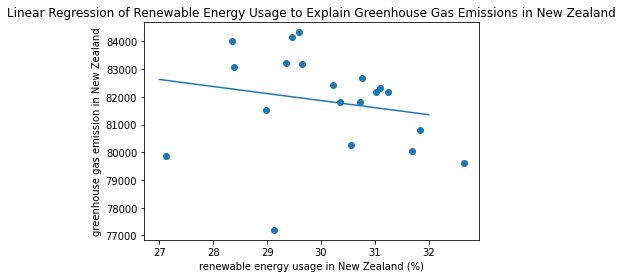

R-squared: 0.0


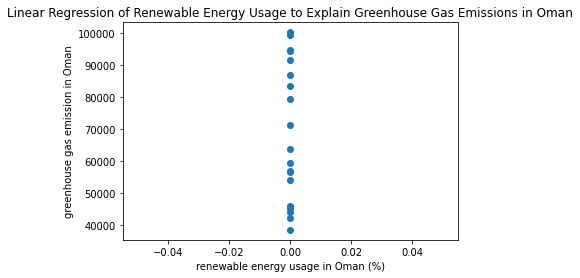

R-squared: 0.8392282037189676


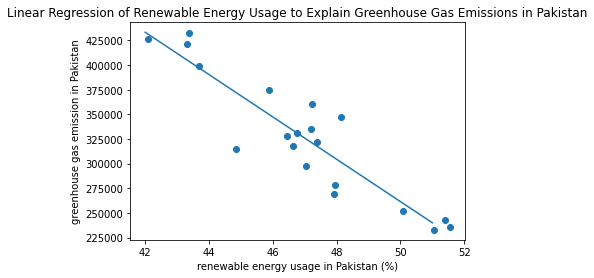

R-squared: 0.6056120128768454


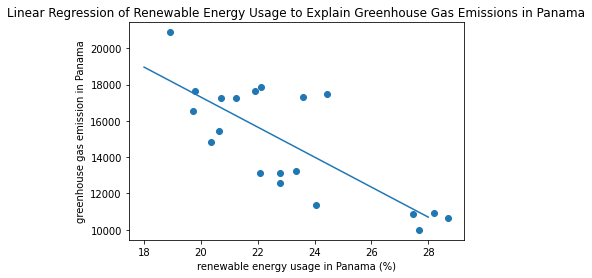

R-squared: 0.9814017838916559


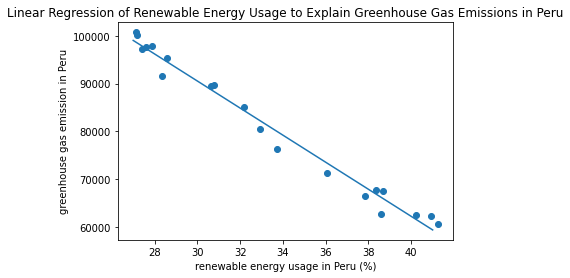

R-squared: 0.5805898369203057


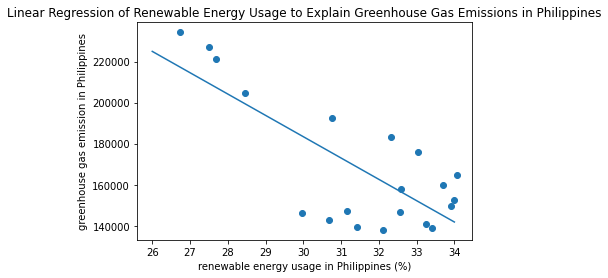

R-squared: 0.3354054684469504


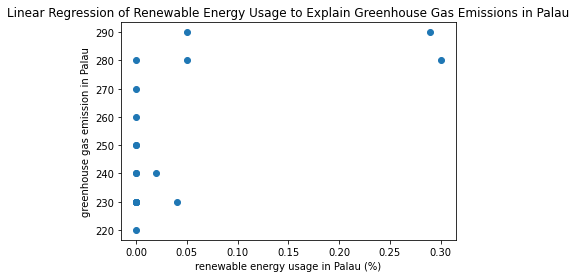

R-squared: 0.4926821078453356


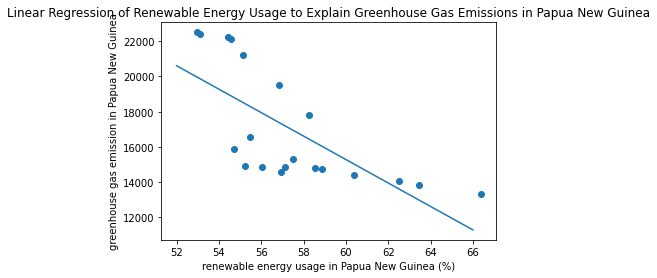

R-squared: 0.020581069123855822


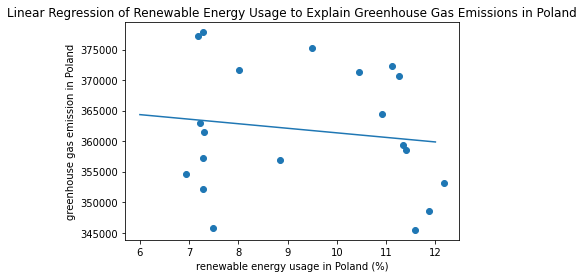

R-squared: 0.9191373030662943


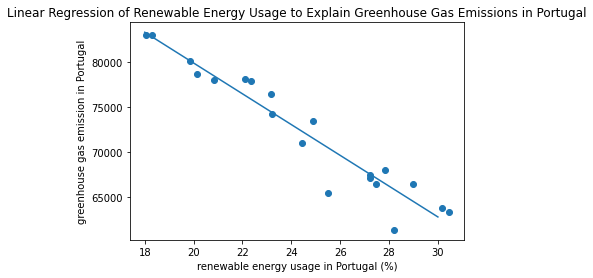

R-squared: 0.8983817901431603


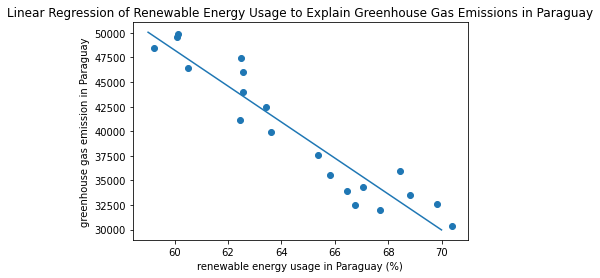

R-squared: 0.06168221955495912


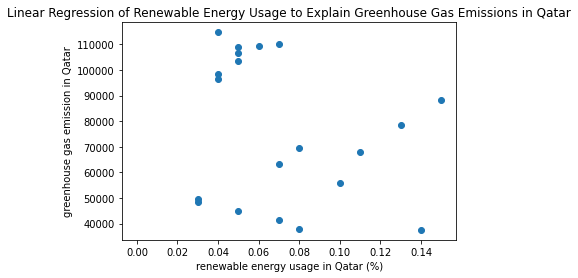

R-squared: 0.7971330522322894


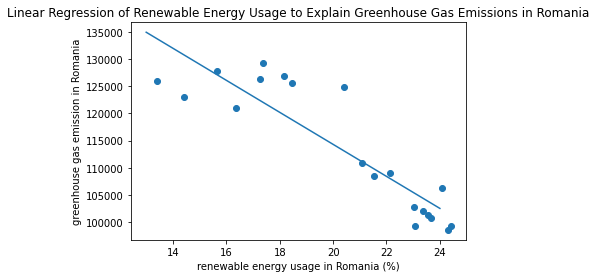

R-squared: 0.3361881755130294


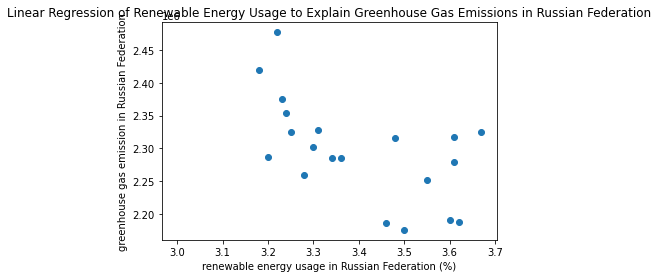

R-squared: 0.1712931590898491


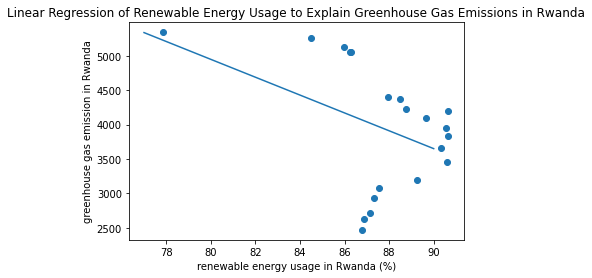

R-squared: 0.22550907301659762


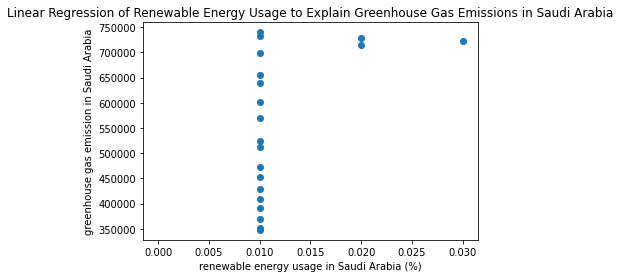

R-squared: 0.8872079142304241


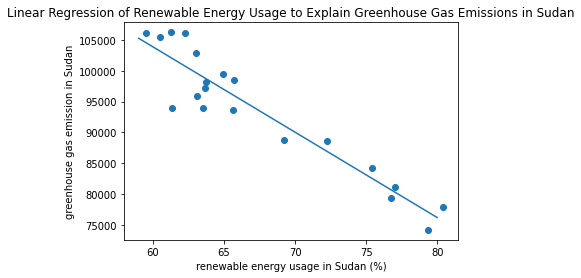

R-squared: 0.22694792699053623


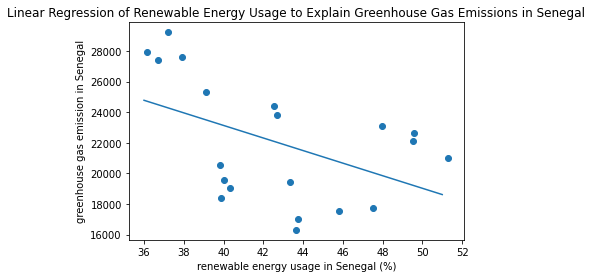

R-squared: 0.47967256740126196


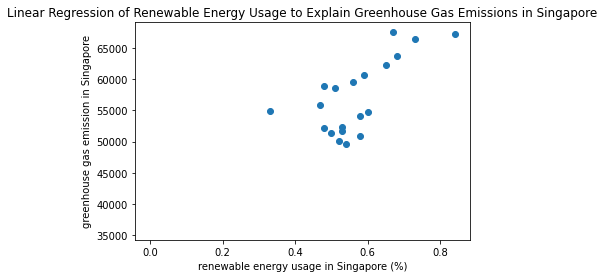

R-squared: 0.3440537922276765


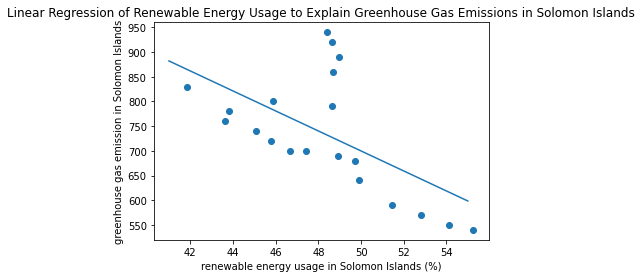

R-squared: 0.8131666143181787


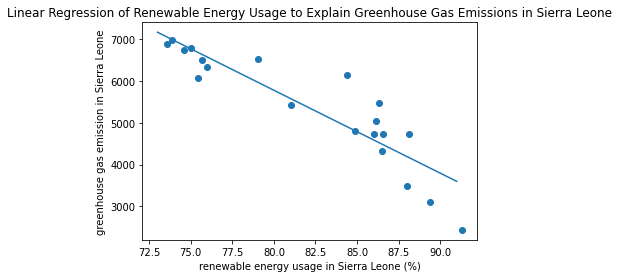

R-squared: 0.05878589967490766


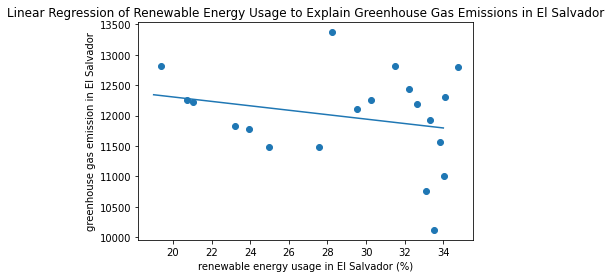

R-squared: 0.8230204803089467


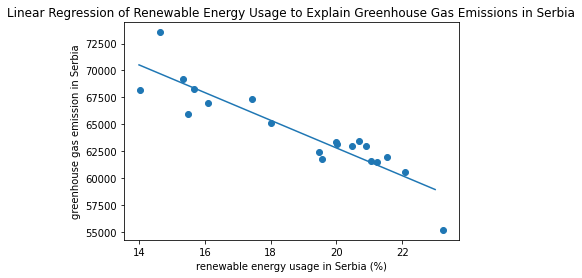

R-squared: 0.4335189360602514


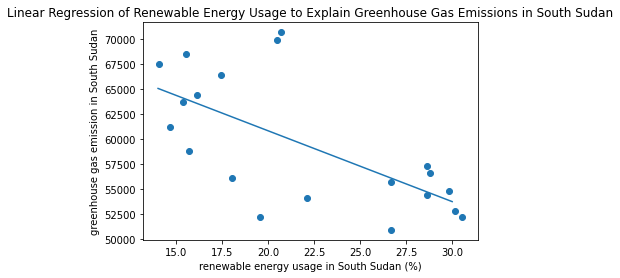

R-squared: 0.955136130231763


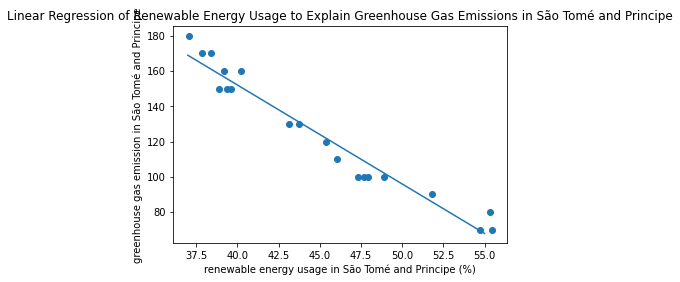

R-squared: 0.8609785284690208


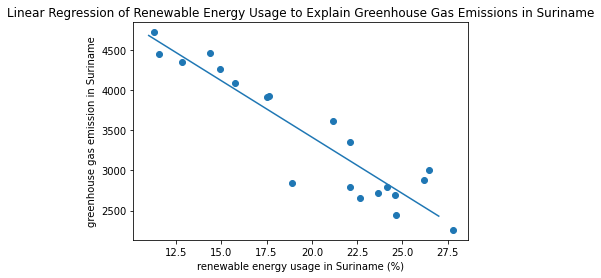

R-squared: 0.8314434297273456


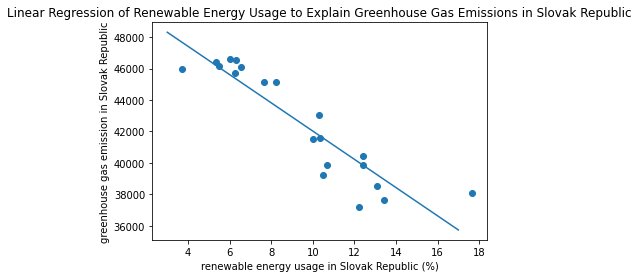

R-squared: 0.5976900157139198


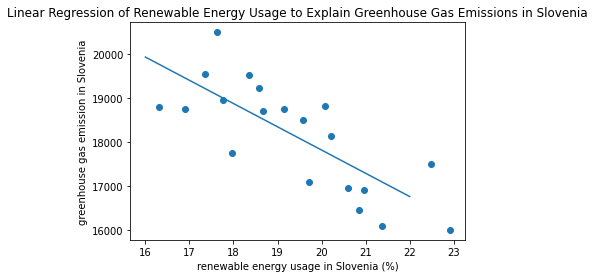

R-squared: 0.950350985353266


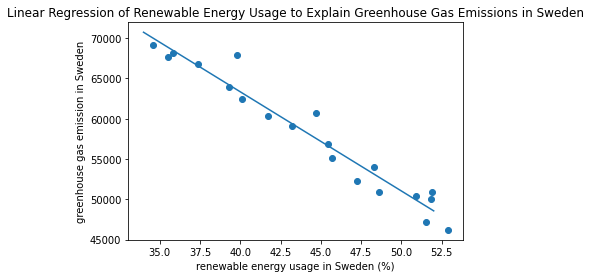

R-squared: 0.0005741901762608137


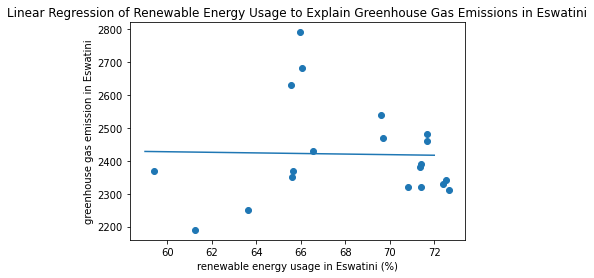

R-squared: 0.06127910286060201


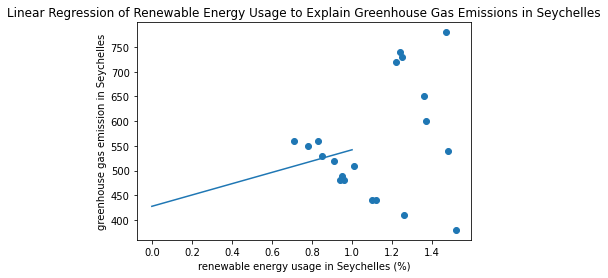

R-squared: 0.023468349882210915


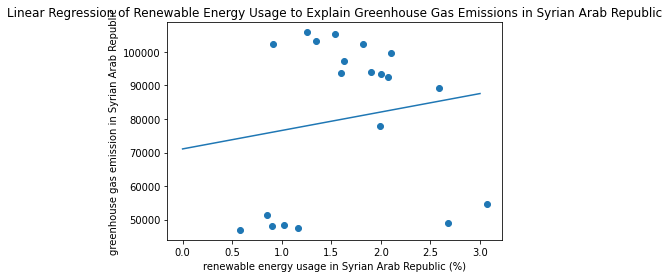

R-squared: 0.7190908802554112


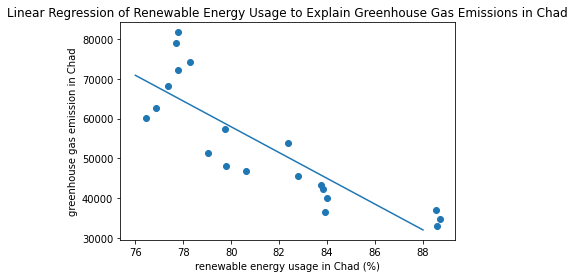

R-squared: 0.0960732867825359


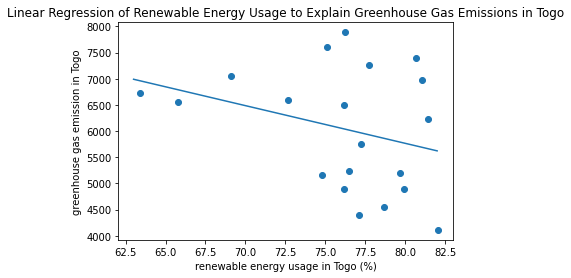

R-squared: 0.6191473963201489


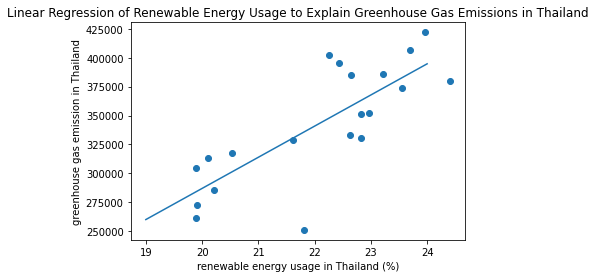

R-squared: 0.9288737486792024


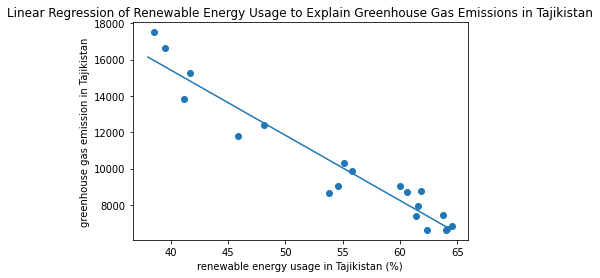

R-squared: 0.8699268403859086


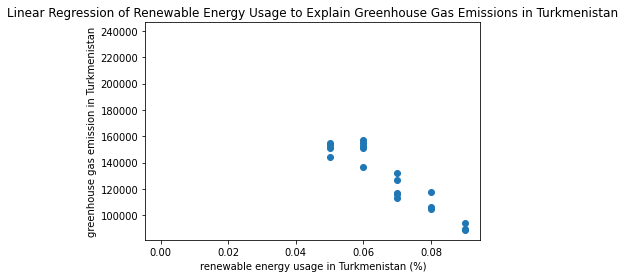

R-squared: 0.029577370742384312


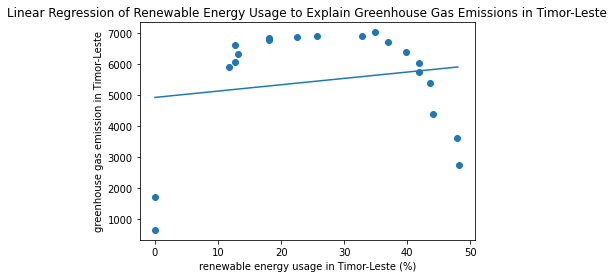

R-squared: 0.04023323339362883


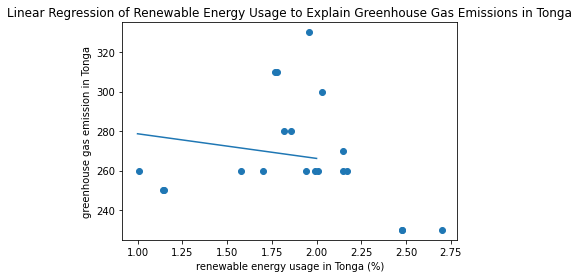

R-squared: 0.9431285725209464


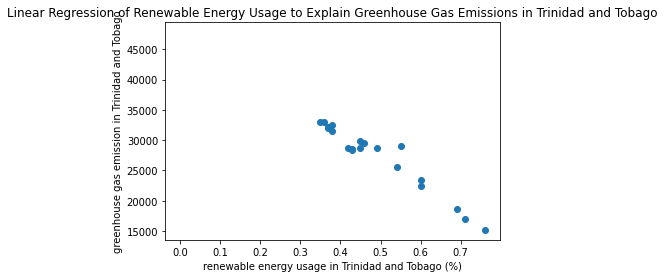

R-squared: 0.568326052117635


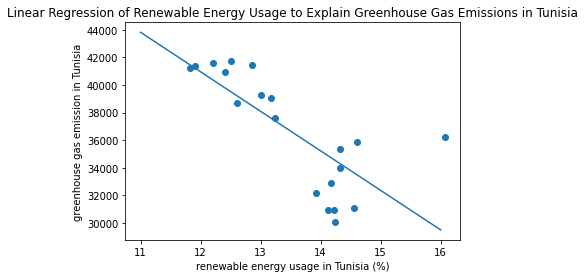

R-squared: 0.6684116279079254


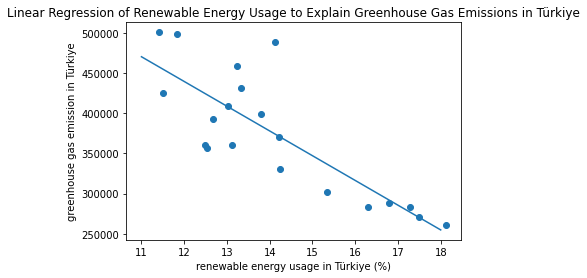

R-squared: 0.17940067122656522


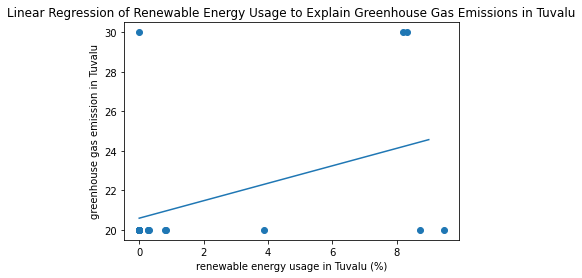

R-squared: 0.9617571569555878


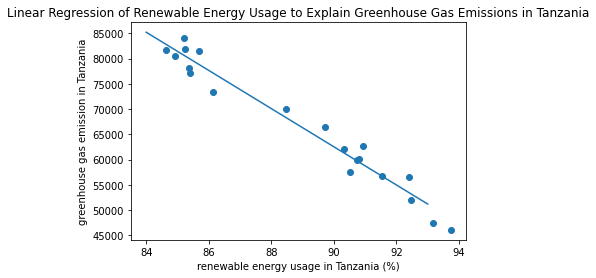

R-squared: 0.8917637067599149


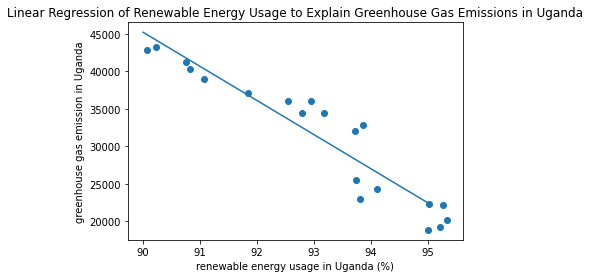

R-squared: 0.8755759055645669


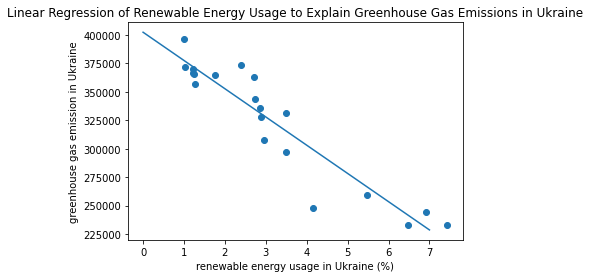

R-squared: 0.12535116726723428


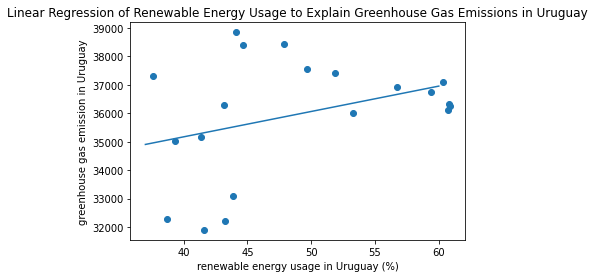

R-squared: 0.8478196825551076


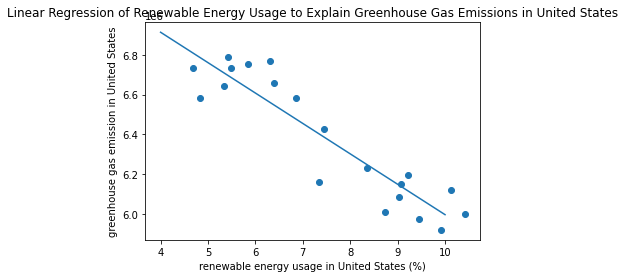

R-squared: 0.1339115446569672


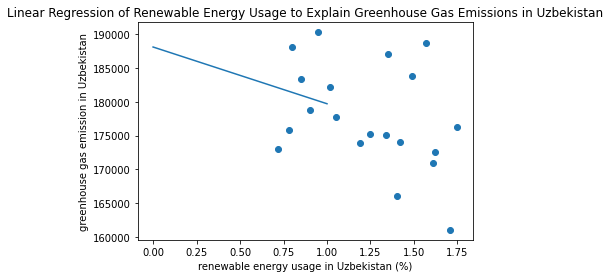

R-squared: 0.16946244312324854


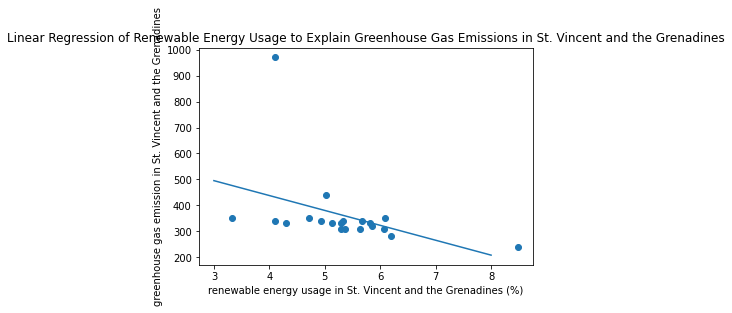

R-squared: 0.026209298273470738


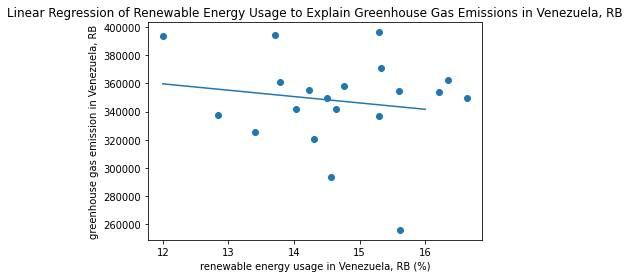

R-squared: 0.9290591856361845


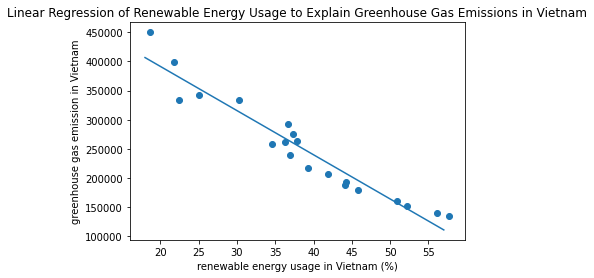

R-squared: 0.7588669550865306


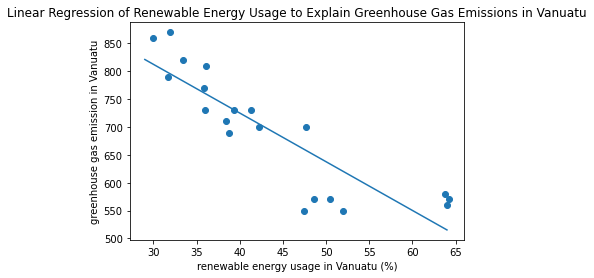

R-squared: 0.7238385253957613


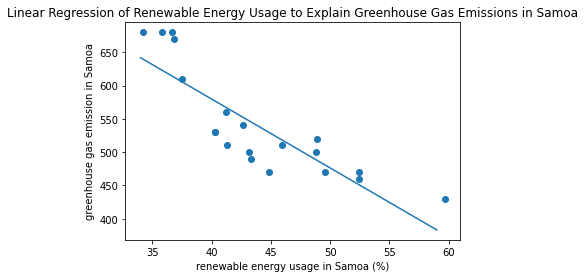

R-squared: 0.7746496496492782


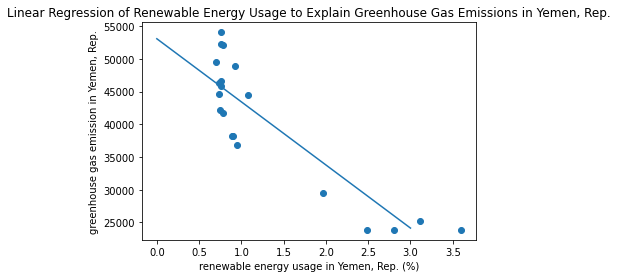

R-squared: 0.824233666613067


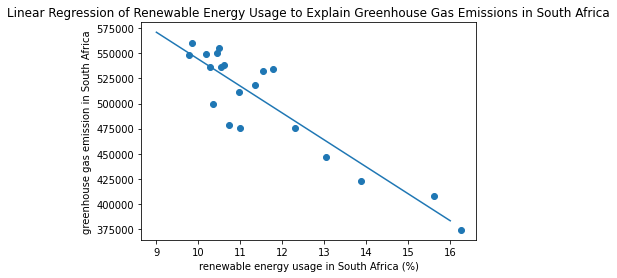

R-squared: 0.8631255590765884


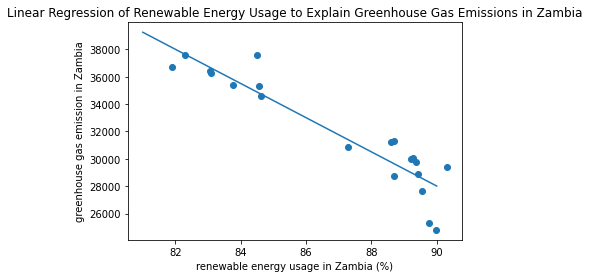

R-squared: 0.19286249893571727


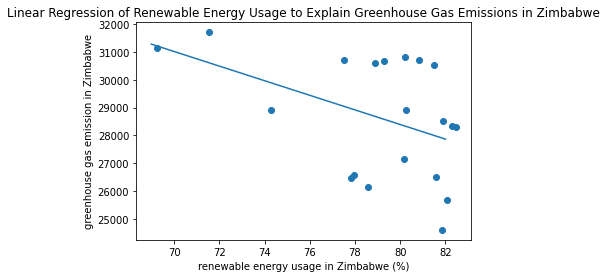

Good fits: 99/188
Poor fits: 85/188
Opposites: 4/188


In [ ]:
# for each country
big_x = np.array(0)
big_y = np.array(0)
good_fits = 0
poor_fits = 0
opposites = 0
total = 0
for country in df_energy.T:
  if country == 'Country Name':
    continue
  x = np.array(df_energy.T[country])
  y = np.array(df_gas.T[country])

  i = 0
  while i < len(x):
    if math.isnan(x[i]):
      x = np.delete(x, i)
      y = np.delete(y, i)
    elif math.isnan(y[i]):
      x = np.delete(x, i)
      y = np.delete(y, i)
    else:
      i += 1

  big_x = np.append(big_x, x)
  big_y = np.append(big_y, y)

  x = np.reshape(x, (-1,1))

  model = LinearRegression()
  model.fit(x,y)
  r_sq = model.score(x, y)
  print("R-squared: {}".format(r_sq))

  if r_sq > 0.5 and model.coef_ < 0:
    good_fits += 1
  elif r_sq < 0.5:
    poor_fits += 1
  else:
    opposites += 1
  total += 1

  x_model = np.arange(math.floor(min(x)),1+math.floor(max(x))).reshape((-1,1))
  y_model = model.predict(x_model)

  plt.scatter(x,y , label='greenhouse gas emission')
  plt.plot(x_model, y_model)

  plt.title('Linear Regression of Renewable Energy Usage to Explain Greenhouse Gas Emissions in {}'.format(country))
  plt.ylabel('greenhouse gas emission in {}'.format(country))
  plt.xlabel('renewable energy usage in {} (%)'.format(country))
  plt.show()
print("Good fits: {}/{}".format(good_fits, total))
print("Poor fits: {}/{}".format(poor_fits, total))
print("Opposites: {}/{}".format(opposites, total))

R-squared: 0.017022190162899853
Slope: [-3892.08772455]


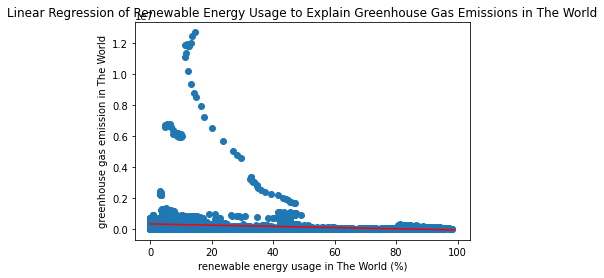

In [ ]:
# for all countries at once
big_x = np.reshape(big_x, (-1,1))

model = LinearRegression()
model.fit(big_x,big_y)
r_sq = model.score(big_x, big_y)
print("R-squared: {}".format(r_sq))
print("Slope: {}".format(model.coef_))

x_model = np.arange(0,100).reshape((-1,1))
y_model = model.predict(x_model)

plt.scatter(big_x,big_y , label='greenhouse gas emission')
plt.plot(x_model, y_model, color = 'red')

plt.title('Linear Regression of Renewable Energy Usage to Explain Greenhouse Gas Emissions in The World')
plt.ylabel('greenhouse gas emission in The World')
plt.xlabel('renewable energy usage in The World (%)')
plt.show()

**Discussion of results:** From the model, 99 out of 188 countries showed the expected relation between renewable energy and greenhouse gas emissions with an R-squared value of 0.5 or better. Another 85 countries showed no strong relation, having a low R-squared value. Finally, 4 countries showed the opposite of the expected relation with a strong R-squared value. Not surprisingly, the overall resulting relationship when looking at the world does not have a high R-squared value. This is likely because each country has it's own variation that cannot all be captured in one line. Overall, the results are convincing, while there isn't a very strong correlation between renewable energy use and greenhouse gas emissions, there is a definitive negative relation. The lack of a stronger relation is likely due to the fact that there are many factors that effect greenhouse gas emissions in an area and renewable energy use is just one factor.

Our second proposed hypothesis is: If health expenditures per capita are high in a particular region during a particular year, then the greenhouse gas emissions will also be high in that same region during the same year. The first model we use to answer this hypothesis will be linear regression. The variables used for the linear regression are the greenhouse gas emissions data for each country, and the health expenditure data for each country. Since we assume that changes in greenhouse gas emissions in a country will effect the amount of health spending in that country, we used the greenhouse gas emissions data for the x-axis and the health expenditure data for the y-axis. Like with the first relation, graphs relating greenhouse gas emissions data to health expenditure data for each country were made. Once the graphs were examined, it was determined that a linear model would be a good, although imperfect fit.

R-squared: 0.7725592861118553


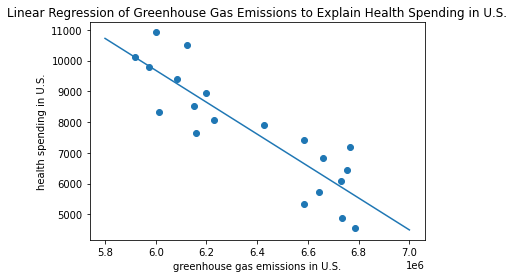

In [ ]:
# first for the US
x = np.array(df_gas.T['United States'])
y = np.array(df_health.T['United States'])

i = 0
while i < len(x):
  if math.isnan(x[i]):
    x = np.delete(x, i)
    y = np.delete(y, i)
  elif math.isnan(y[i]):
    x = np.delete(x, i)
    y = np.delete(y, i)
  else:
    i += 1

x = np.reshape(x, (-1,1))

model = LinearRegression()
model.fit(x,y)
r_sq = model.score(x, y)
print("R-squared: {}".format(r_sq))

x_model = np.arange(5800000,7000000).reshape((-1,1))
y_model = model.predict(x_model)

plt.scatter(x,y , label='health spending')
plt.plot(x_model, y_model)

plt.title('Linear Regression of Greenhouse Gas Emissions to Explain Health Spending in U.S.')
plt.ylabel('health spending in U.S.')
plt.xlabel('greenhouse gas emissions in U.S.')
plt.show()

R-squared: 0.8410406834919124


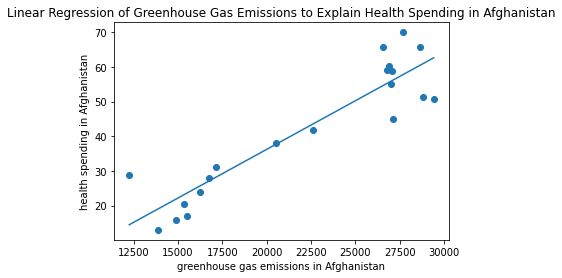

R-squared: 0.6479383836035211


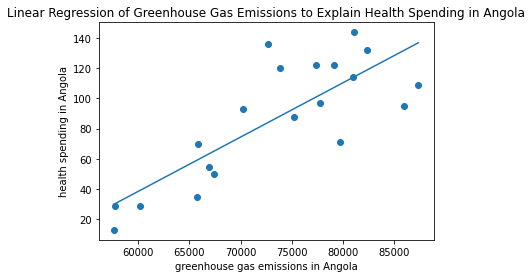

R-squared: 0.35044457287306585


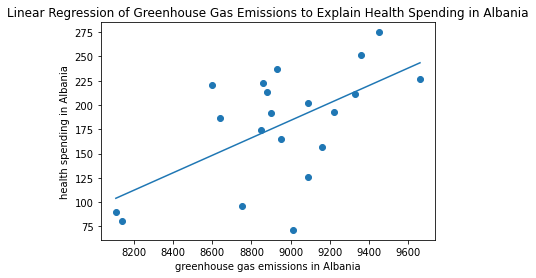

R-squared: 0.07056460755879523


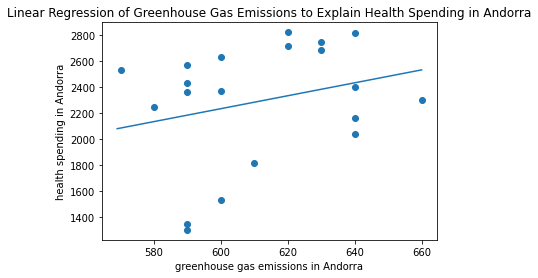

R-squared: 0.8388195051912282


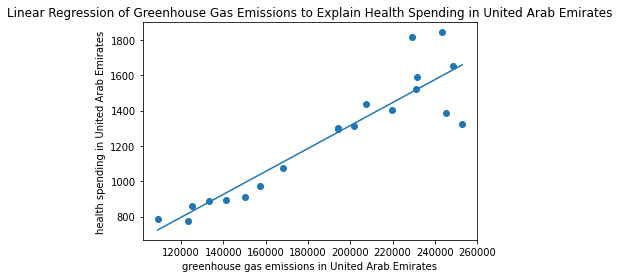

R-squared: 0.586123447506463


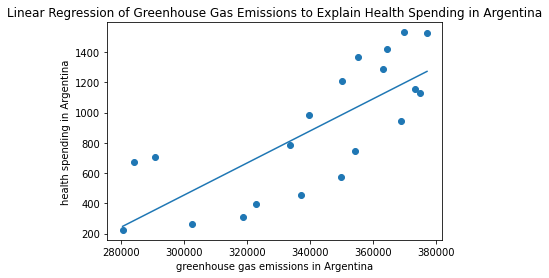

R-squared: 0.8653888355862402


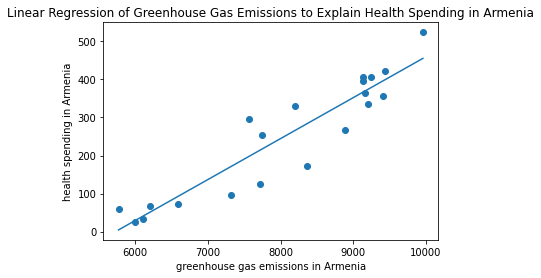

R-squared: 0.20188157865099088


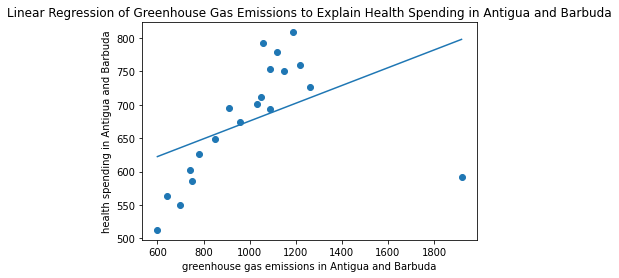

R-squared: 0.07161930622396562


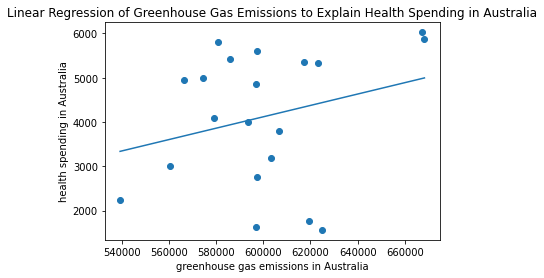

R-squared: 0.2594508842618064


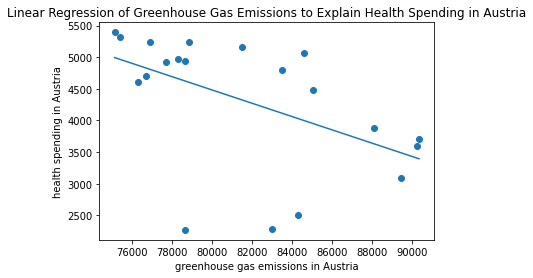

R-squared: 0.6812272540469906


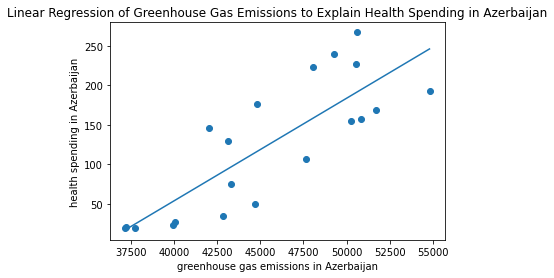

R-squared: 0.5045470279577073


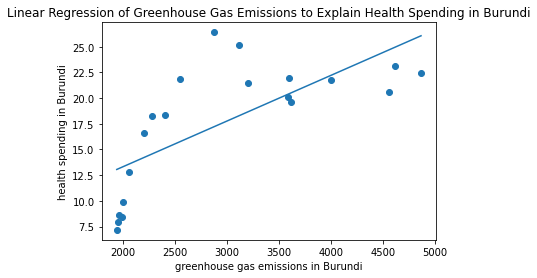

R-squared: 0.8047147878248162


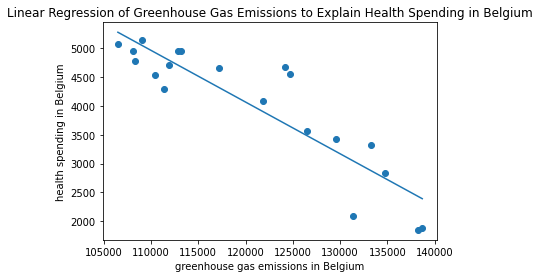

R-squared: 0.4097280971988956


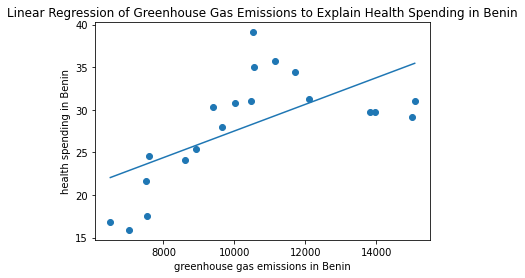

R-squared: 0.8821282863578228


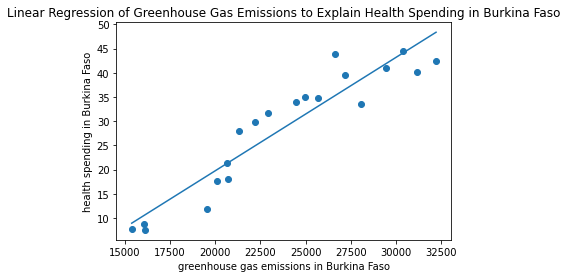

R-squared: 0.9747929704233735


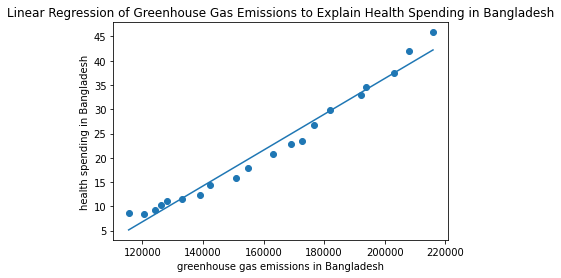

R-squared: 0.32111228770078537


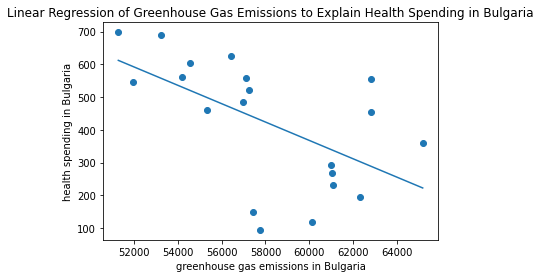

R-squared: 0.8883095843408344


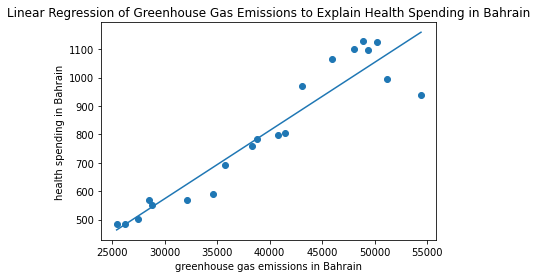

R-squared: 0.02071476476280576


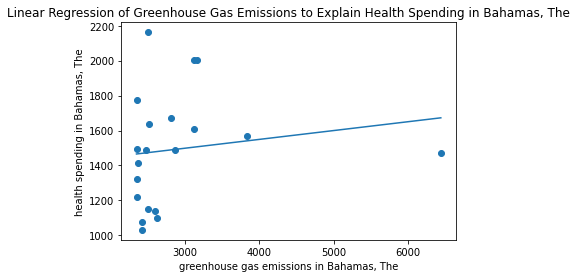

R-squared: 0.8803528662259568


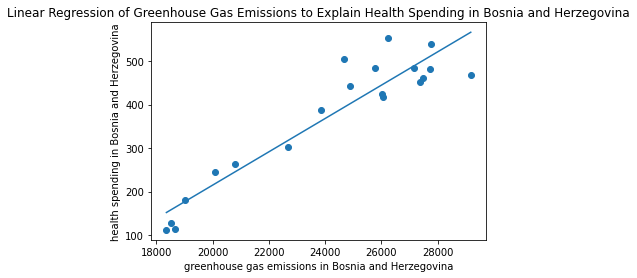

R-squared: 0.8179075218863753


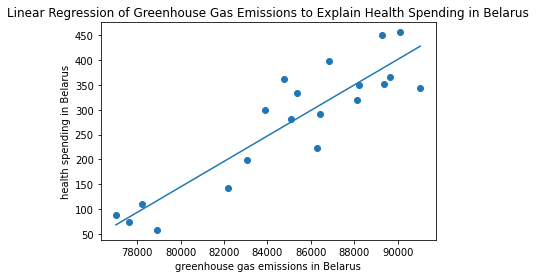

R-squared: 0.576119832326153


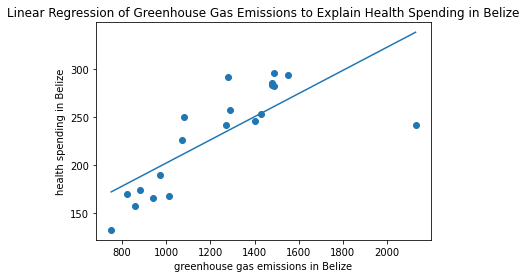

R-squared: 0.9083753854627304


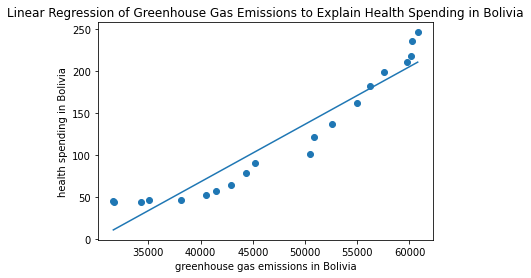

R-squared: 0.8232813428420669


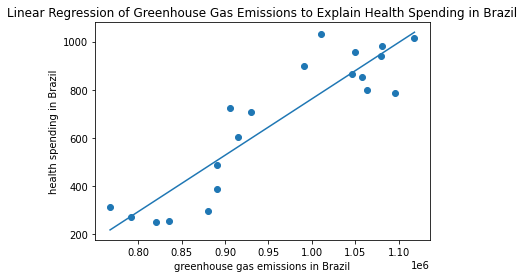

R-squared: 0.0859531852997748


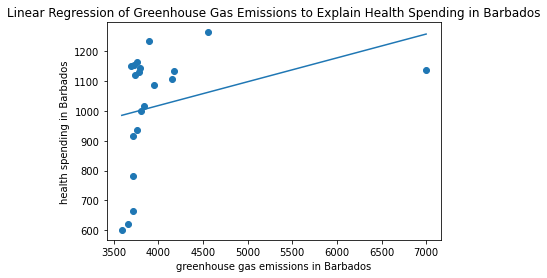

R-squared: 0.6185451317265422


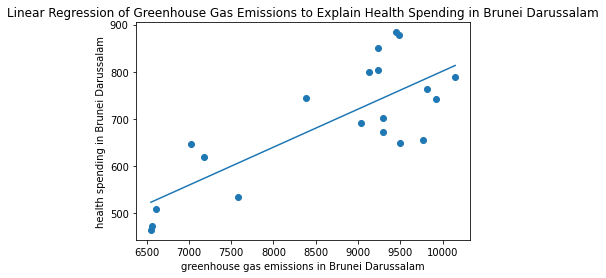

R-squared: 0.9157493074756545


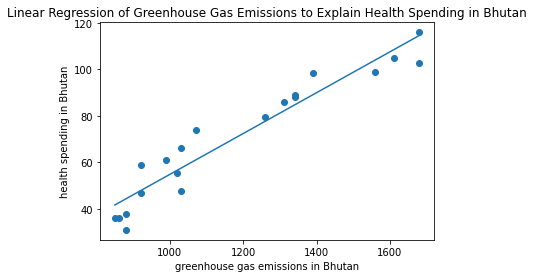

R-squared: 0.022335698925142644


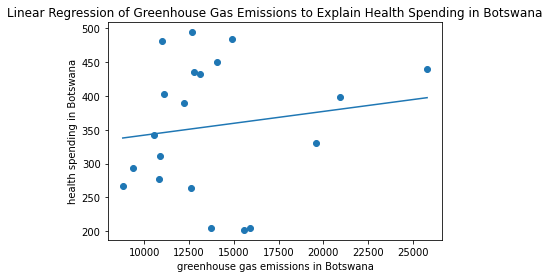

R-squared: 0.02473460494586377


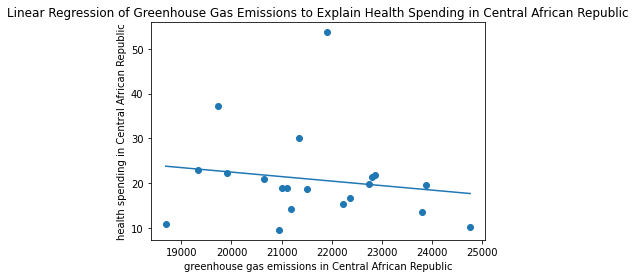

R-squared: 0.4389700084893068


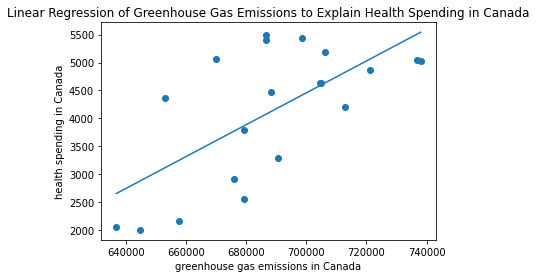

R-squared: 0.5457610317812986


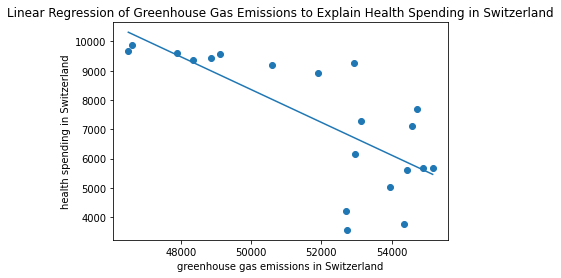

R-squared: 0.9691042893891583


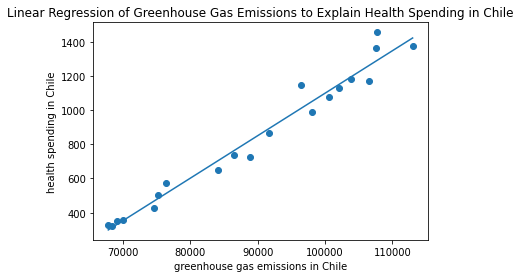

R-squared: 0.8323714140650352


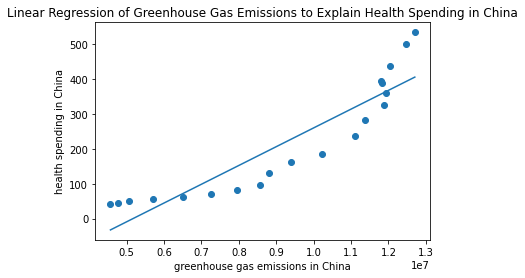

R-squared: 0.42770852701947626


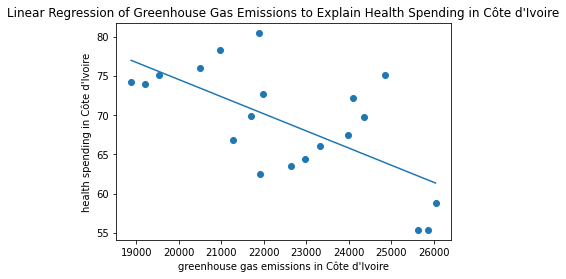

R-squared: 0.2477319298935401


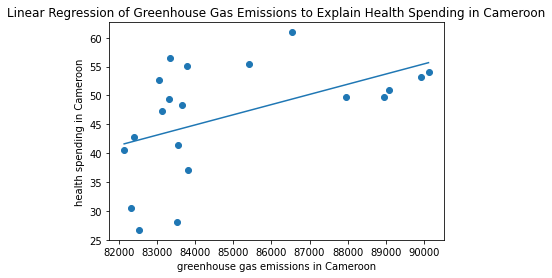

R-squared: 0.30388271934207567


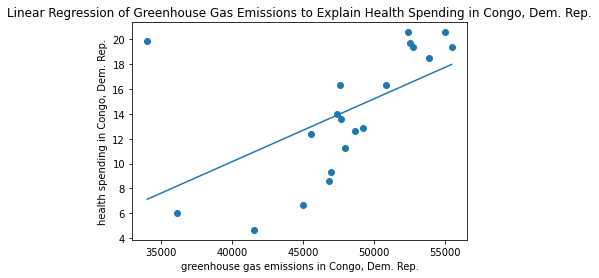

R-squared: 0.40986997141091086


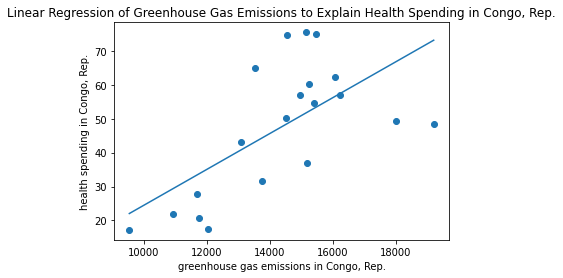

R-squared: 0.8014805723959928


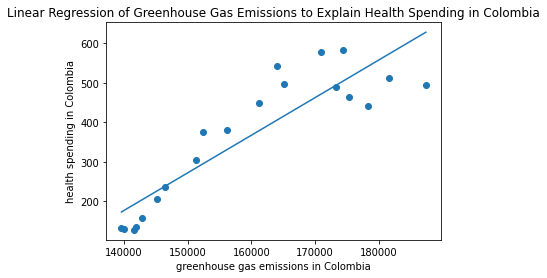

R-squared: 0.2041614433732002


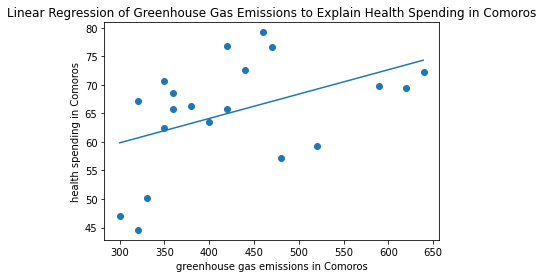

R-squared: 0.7799232444647595


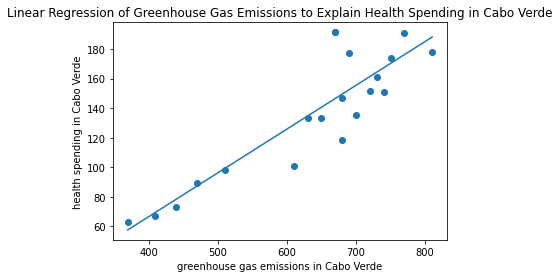

R-squared: 0.9125945560512921


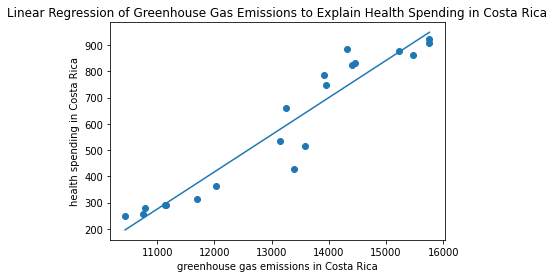

R-squared: 0.08610383472795646


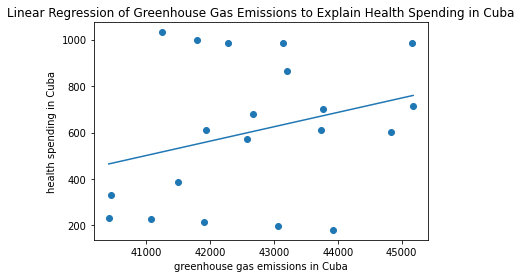

R-squared: 0.1362024124953456


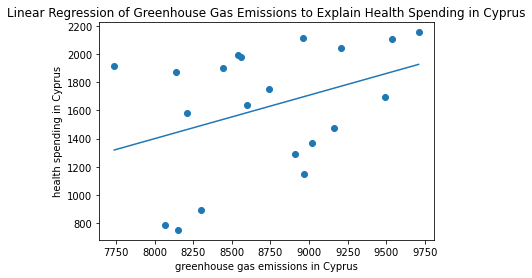

R-squared: 0.6623504481072784


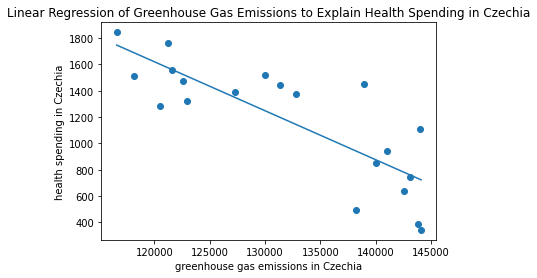

R-squared: 0.8186298647834352


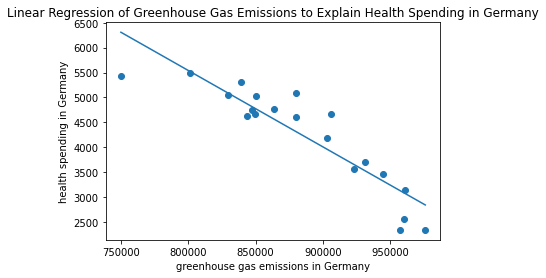

R-squared: 0.6075745146598848


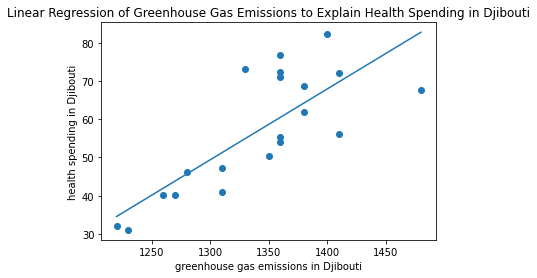

R-squared: 0.047791299206751625


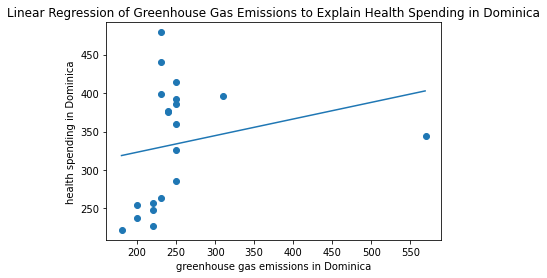

R-squared: 0.46715533190066283


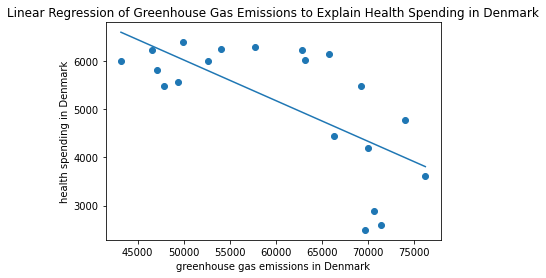

R-squared: 0.9197271113869847


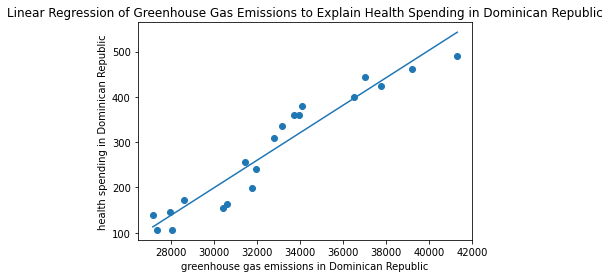

R-squared: 0.6887945023962893


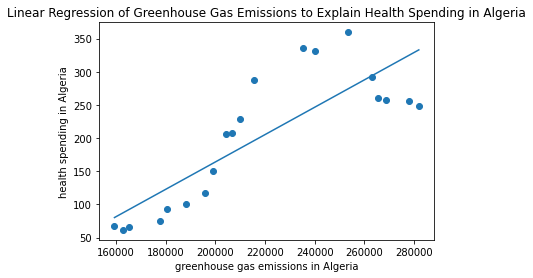

R-squared: 0.8884724010126688


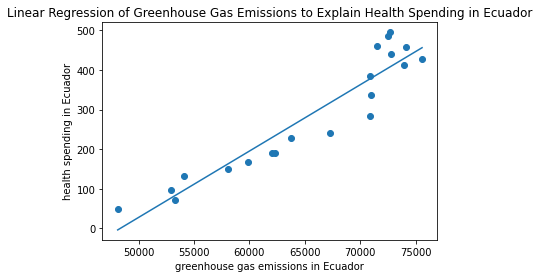

R-squared: 0.6727216975455603


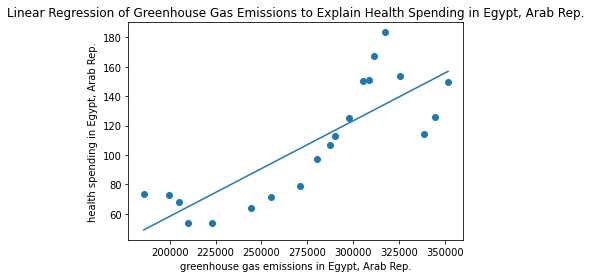

R-squared: 0.23330363299884038


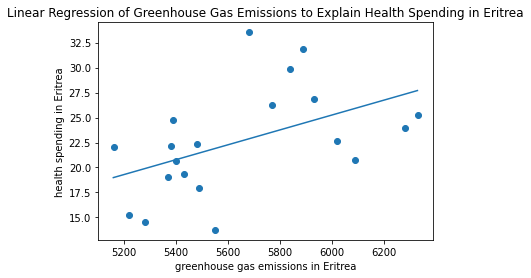

R-squared: 0.09767094564958545


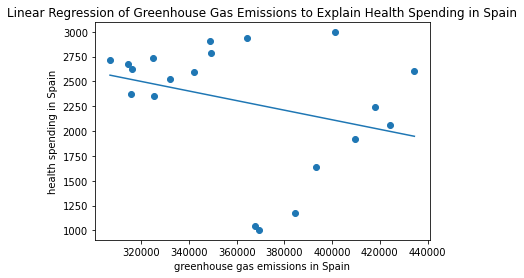

R-squared: 0.009715839556026729


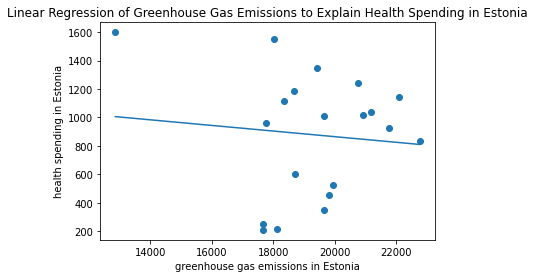

R-squared: 0.9737990886301979


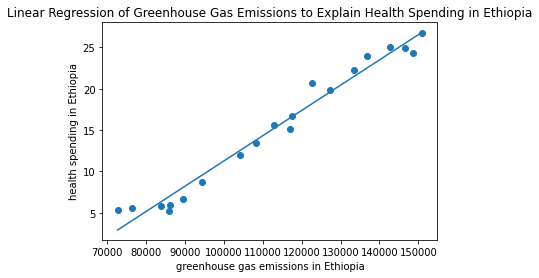

R-squared: 0.35707948602326334


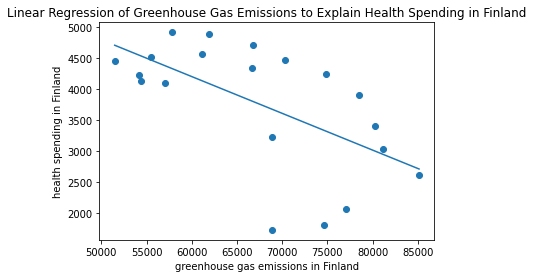

R-squared: 0.01711377638067224


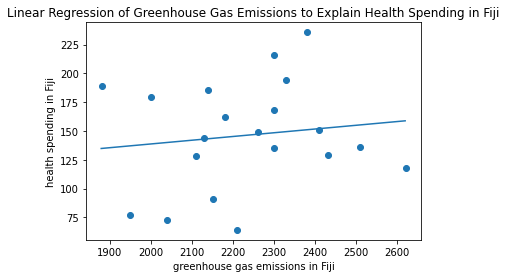

R-squared: 0.4856368633837287


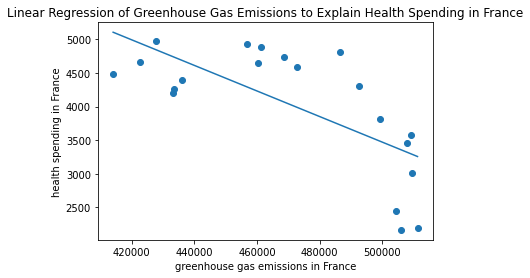

R-squared: 0.14067577995854563


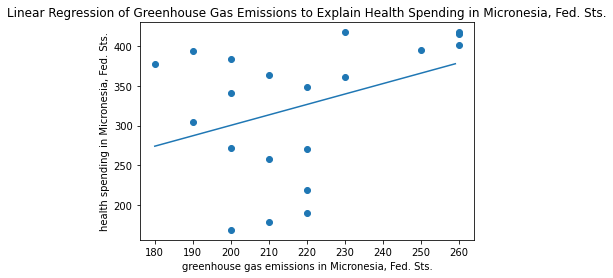

R-squared: 0.3865736067958012


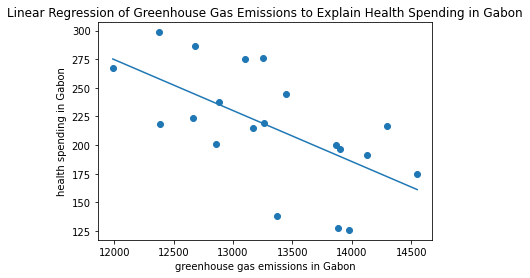

R-squared: 0.4548196644069563


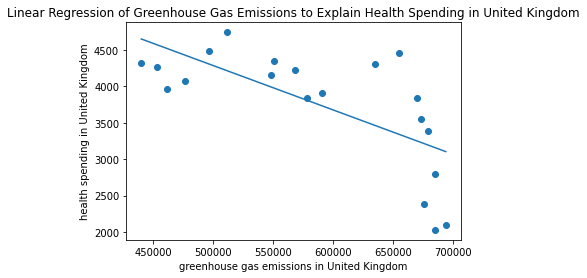

R-squared: 0.5882521885214245


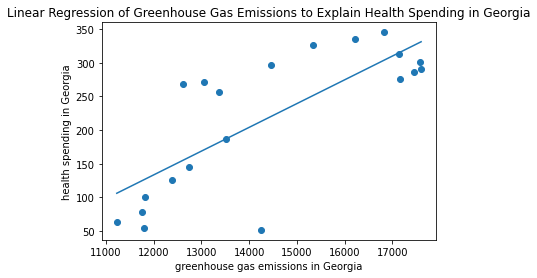

R-squared: 0.5680860470246281


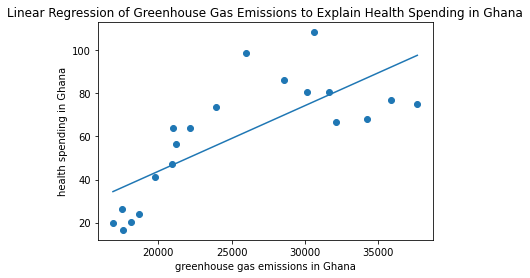

R-squared: 0.5882023212225366


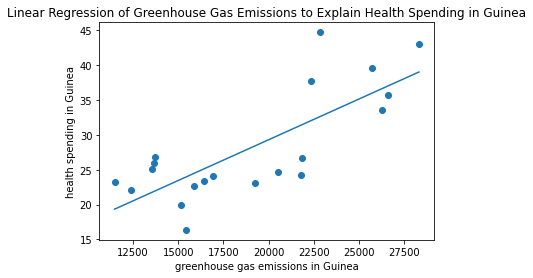

R-squared: 0.1349332448578633


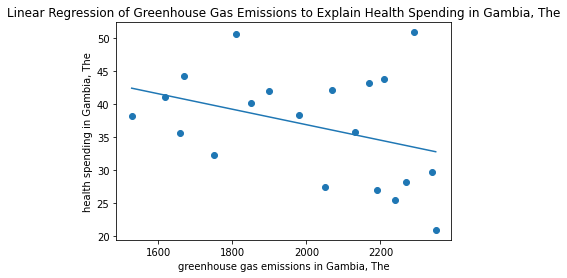

R-squared: 0.7348979348834661


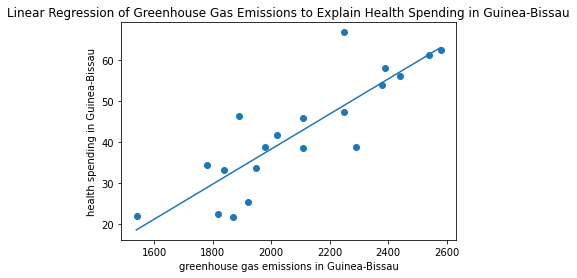

R-squared: 0.5026662839117386


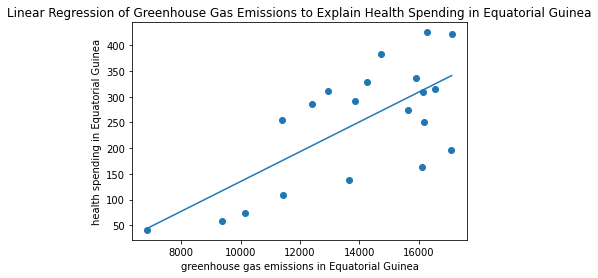

R-squared: 0.06791888379159461


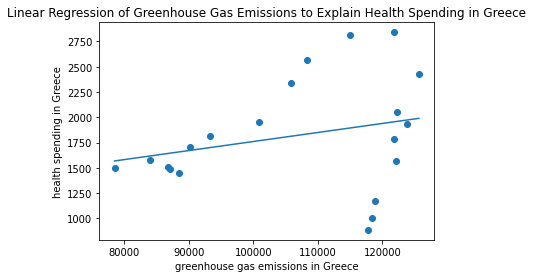

R-squared: 0.3936813764405318


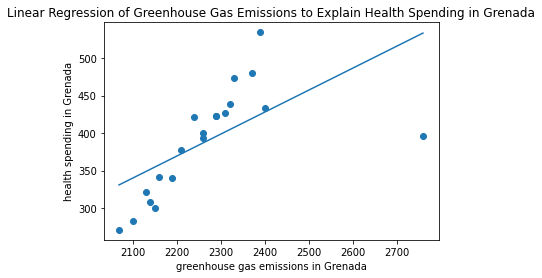

R-squared: 0.947911550187242


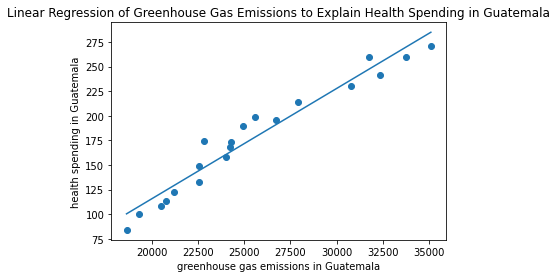

R-squared: 0.8730030434561205


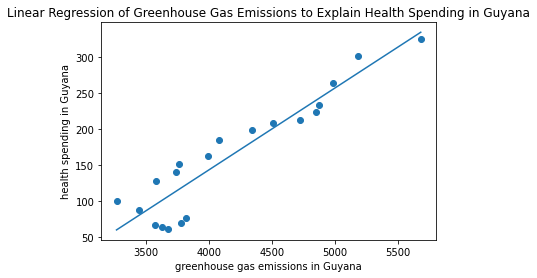

R-squared: 0.8684754835302023


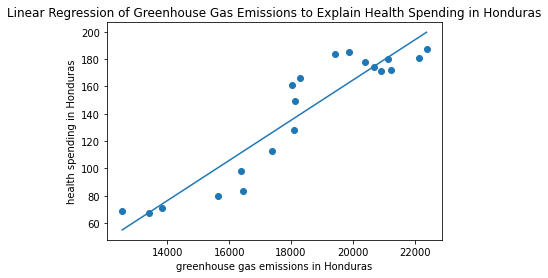

R-squared: 0.008261399999632157


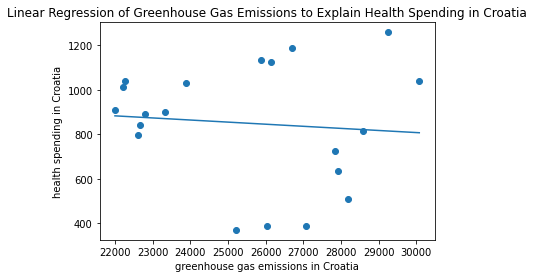

R-squared: 0.7064958716497098


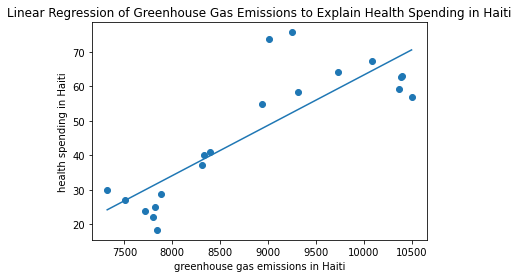

R-squared: 0.35085214965305356


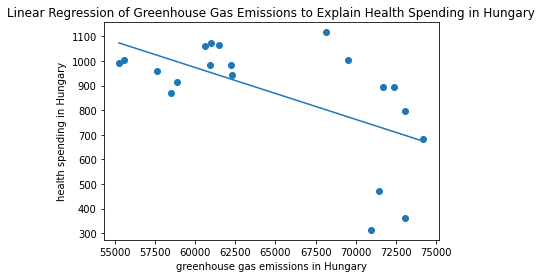

R-squared: 0.8164780236316095


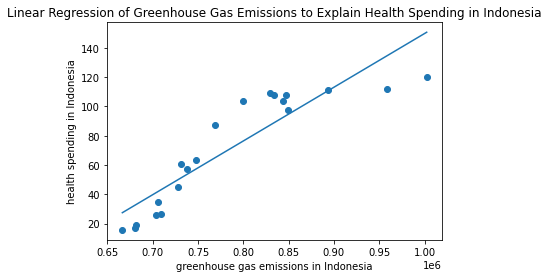

R-squared: 0.9763552039384699


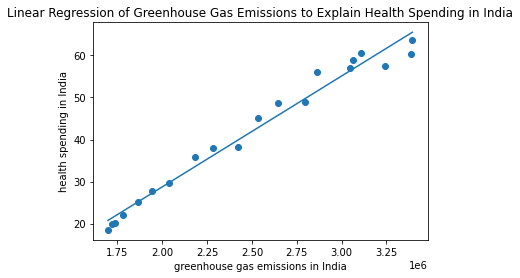

R-squared: 0.4859929618583192


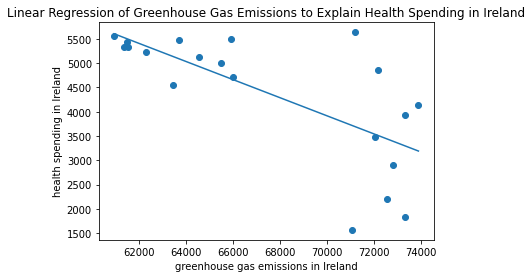

R-squared: 0.8319347883430472


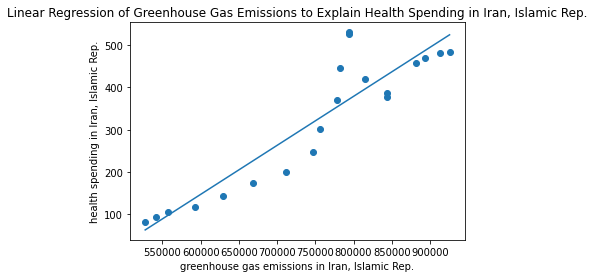

R-squared: 0.8173745198172774


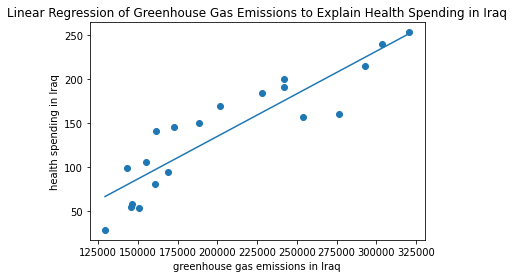

R-squared: 0.0340779040682373


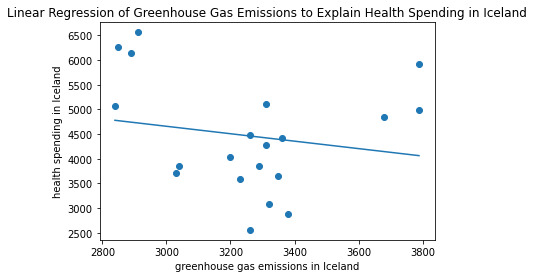

R-squared: 0.5388236622991557


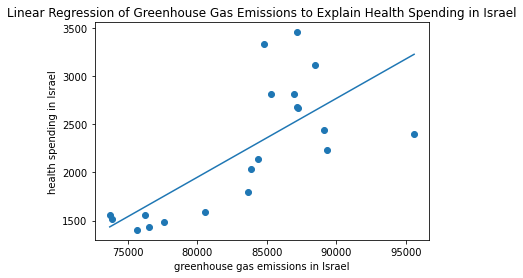

R-squared: 0.11906042976981746


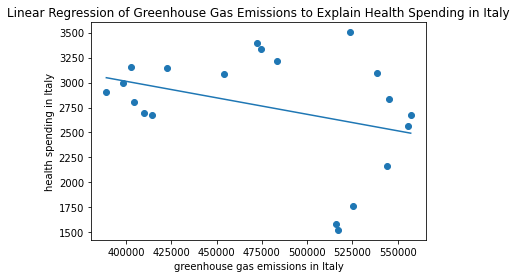

R-squared: 0.43713759057040424


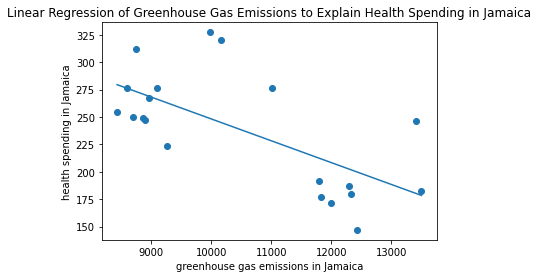

R-squared: 0.7443192524922293


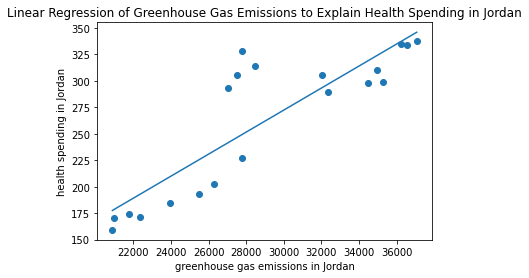

R-squared: 0.000246297632063075


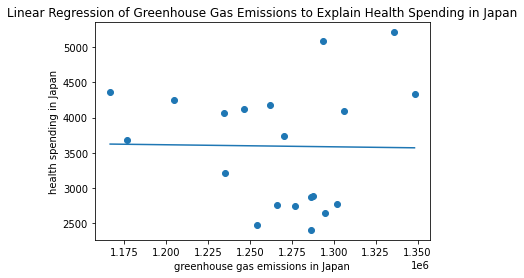

R-squared: 0.816341564359599


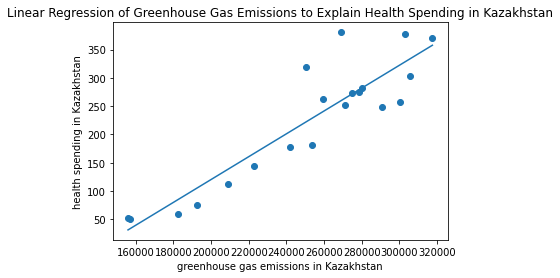

R-squared: 0.954919665813193


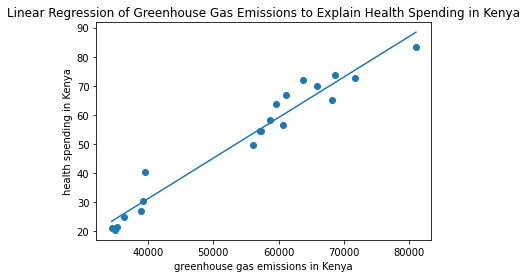

R-squared: 0.6936074586288423


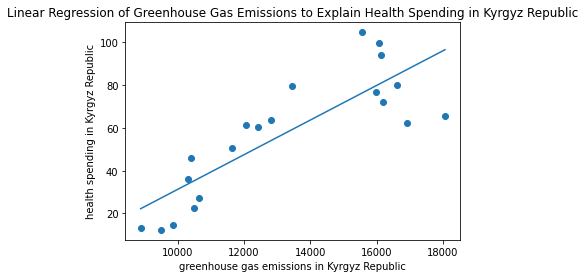

R-squared: 0.9242301341815699


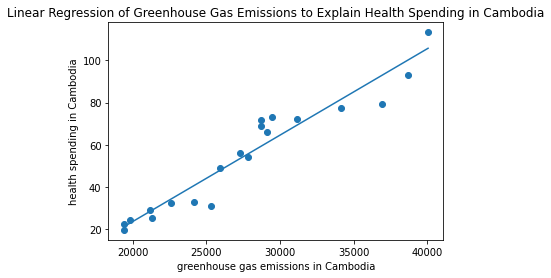

R-squared: 0.5915362412009713


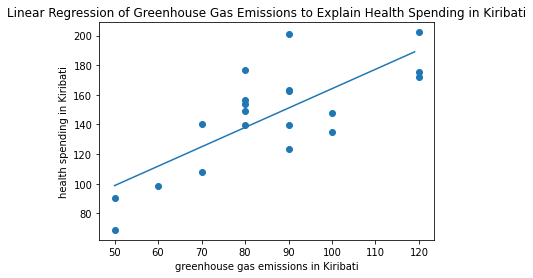

R-squared: 0.05126577690117251


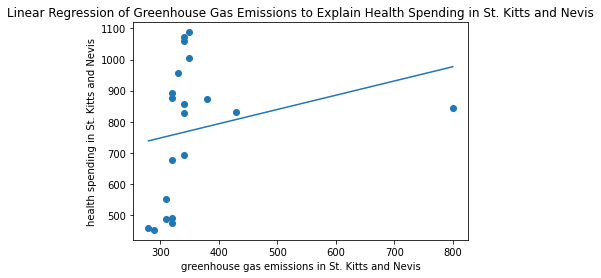

R-squared: 0.8994151818188855


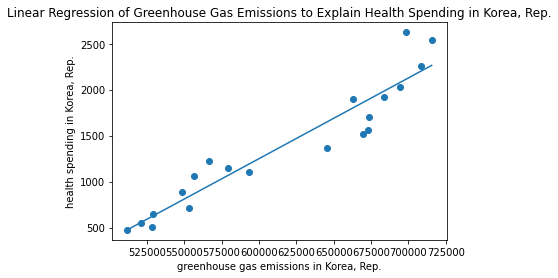

R-squared: 0.9324465584006075


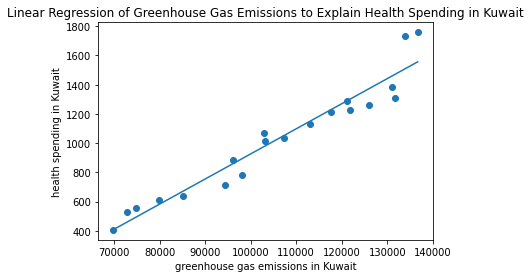

R-squared: 0.8619924589940414


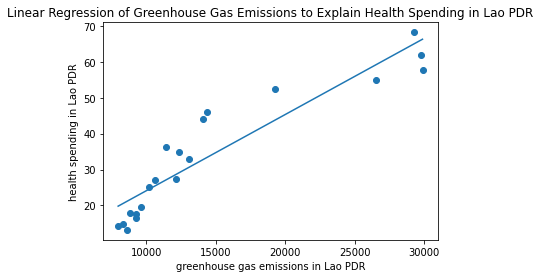

R-squared: 0.7295354716364701


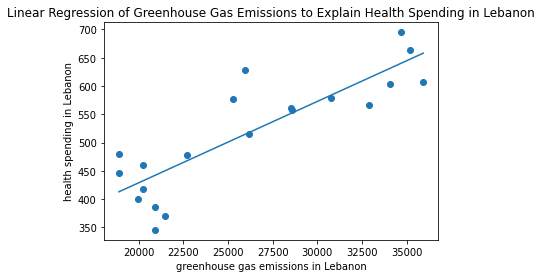

R-squared: 0.8434059048250333


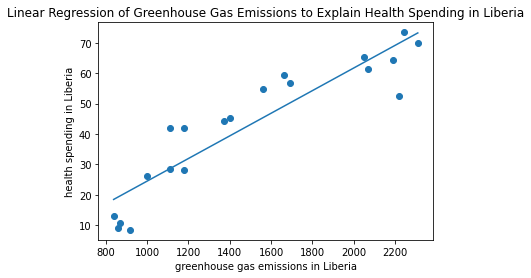

R-squared: 0.07424356860674597


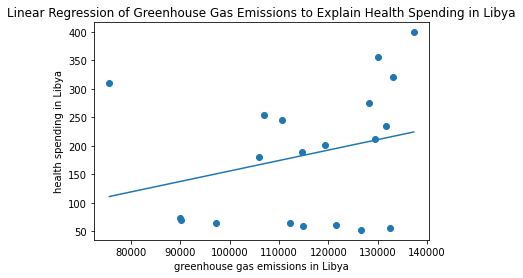

R-squared: 0.15041720441286488


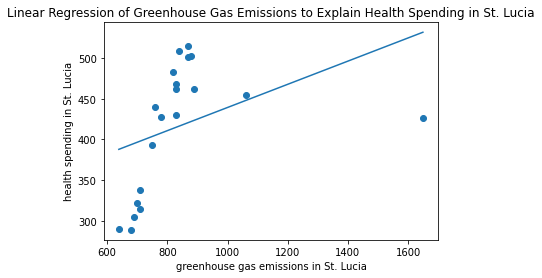

R-squared: 0.8460915739044279


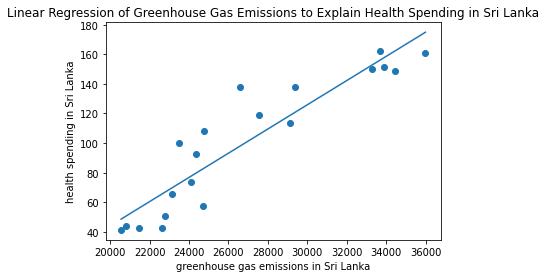

R-squared: 0.6334614967378653


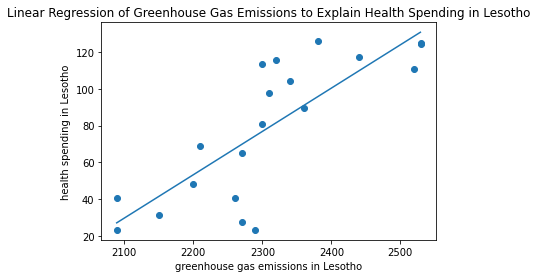

R-squared: 0.17926414440643323


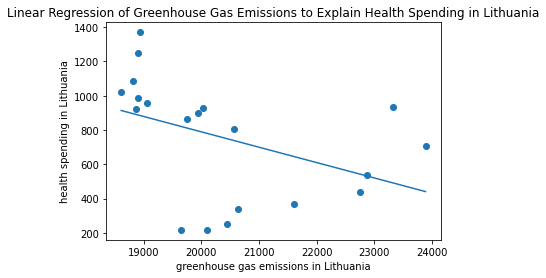

R-squared: 0.27593523650857954


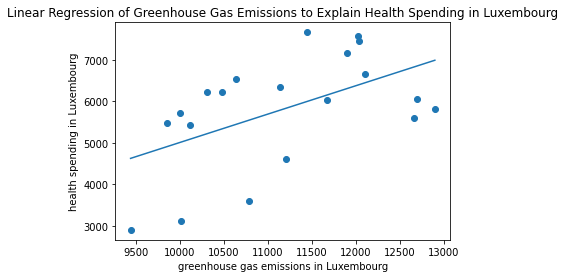

R-squared: 0.28344611990051427


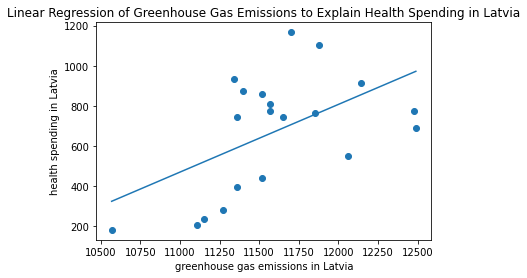

R-squared: 0.7550130598151976


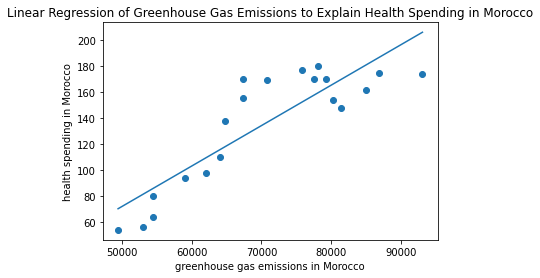

R-squared: 0.3492258714070713


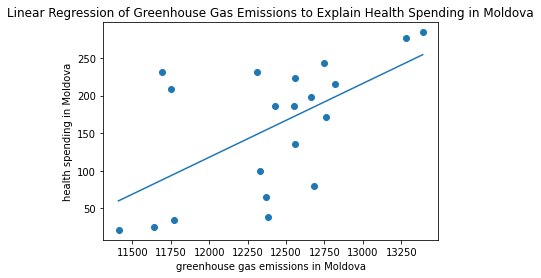

R-squared: 0.5085361733158859


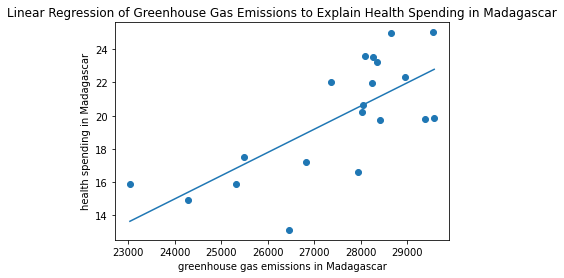

R-squared: 0.7439035315935922


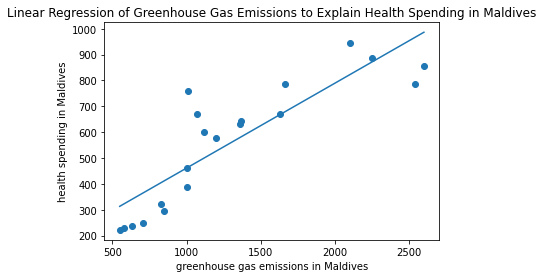

R-squared: 0.7570041891491922


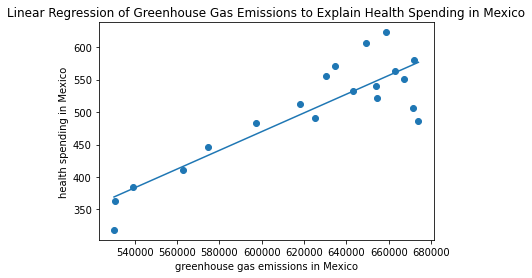

R-squared: 0.7476812327560326


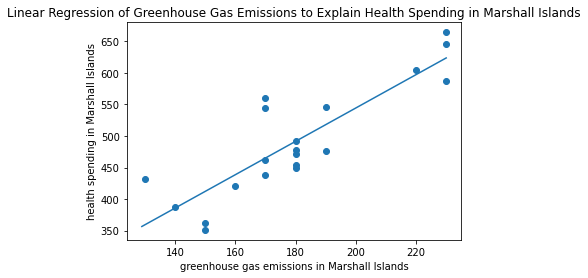

R-squared: 0.1656626942412971


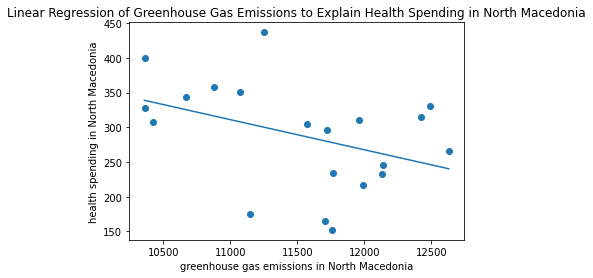

R-squared: 0.4564289455083125


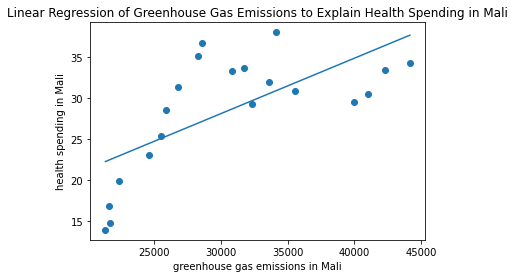

R-squared: 0.20611856465929868


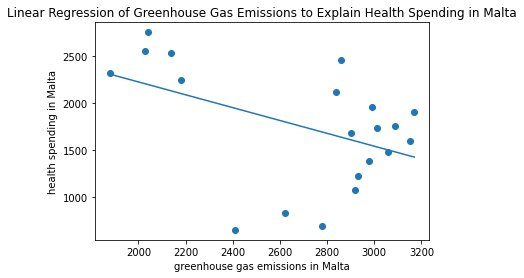

R-squared: 0.8331738324165227


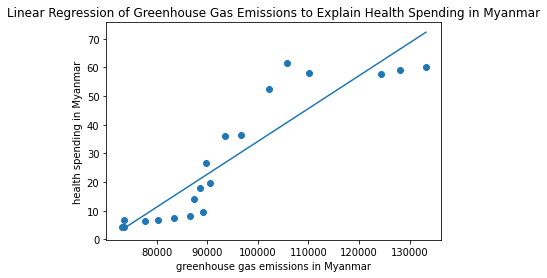

R-squared: 0.5075142956720357


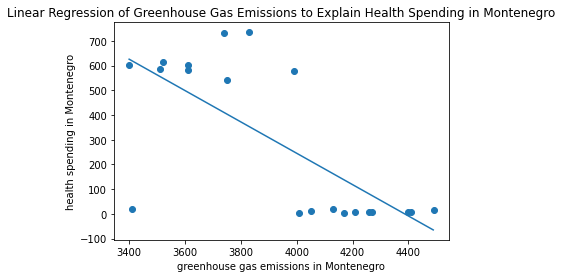

R-squared: 0.769202417633677


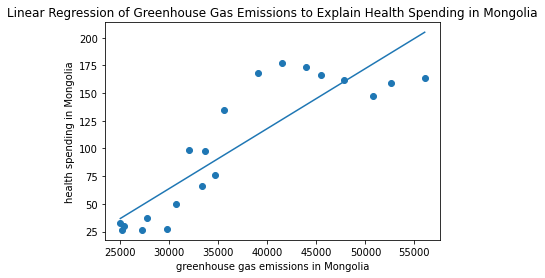

R-squared: 0.8228369870096357


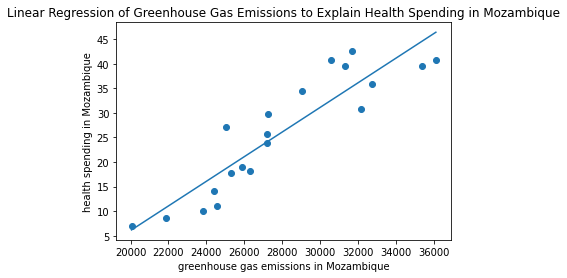

R-squared: 0.7420894402151241


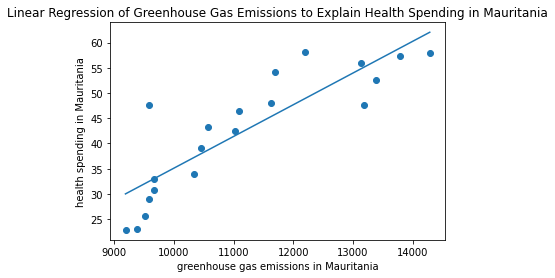

R-squared: 0.9560607278427412


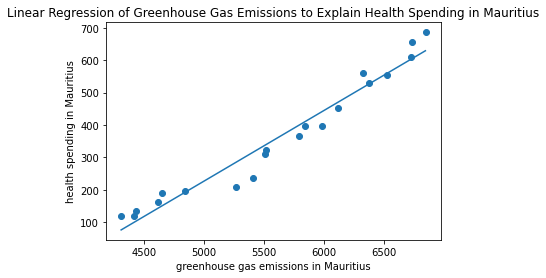

R-squared: 0.5662930604842833


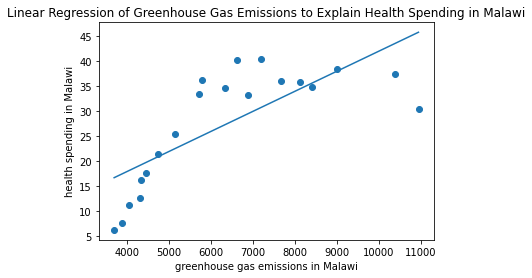

R-squared: 0.9406434737142448


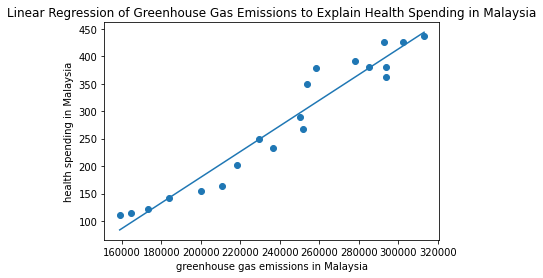

R-squared: 0.4415780244530608


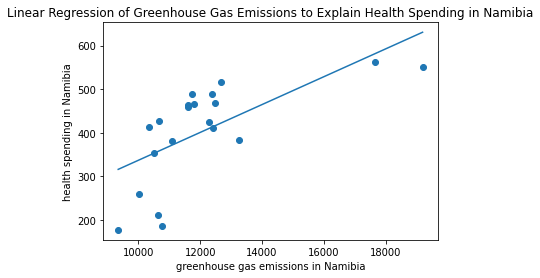

R-squared: 0.7975057587387989


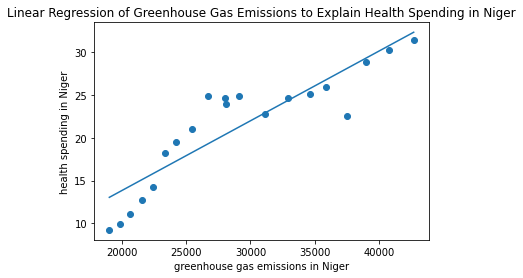

R-squared: 0.25071995339498254


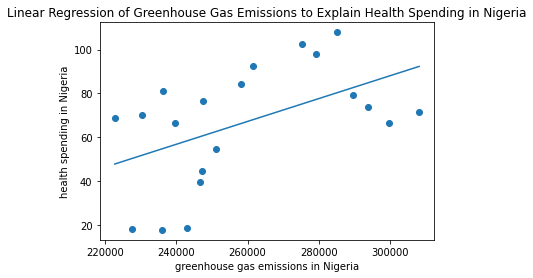

R-squared: 0.93073586629402


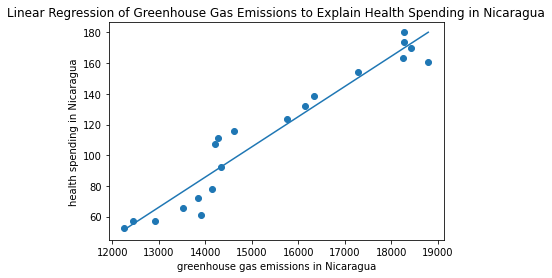

R-squared: 0.6316878056180271


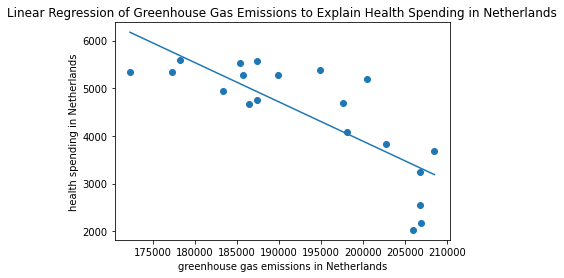

R-squared: 0.014357438573700754


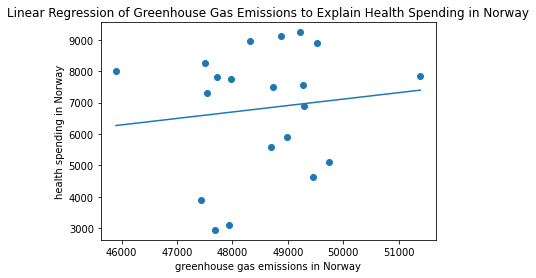

R-squared: 0.9217257577951596


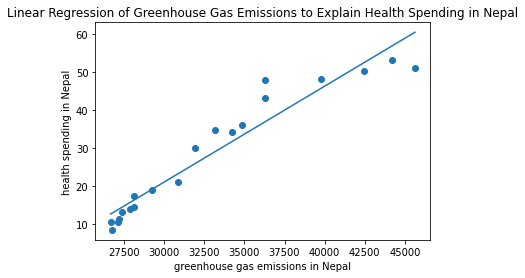

R-squared: 0.07594086415329848


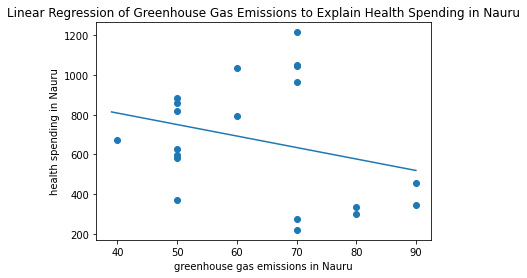

R-squared: 0.03298263611701757


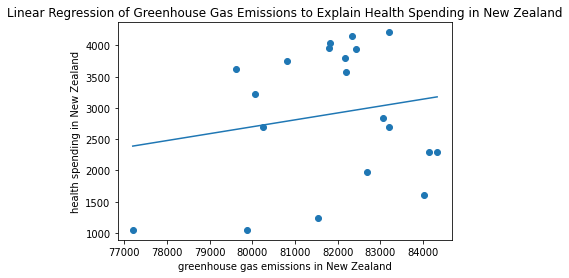

R-squared: 0.9093529252497166


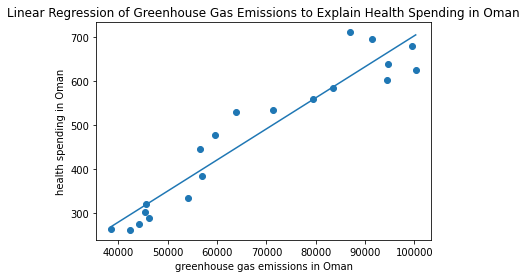

R-squared: 0.9585383696164743


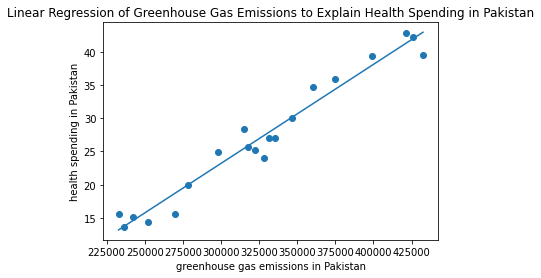

R-squared: 0.8716462315770966


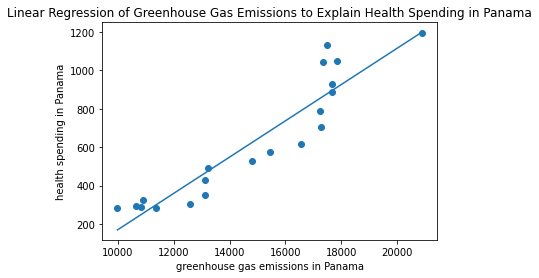

R-squared: 0.972881134512074


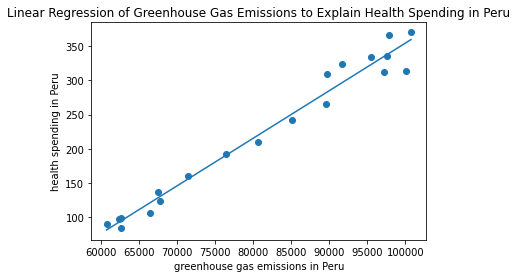

R-squared: 0.7545420868005677


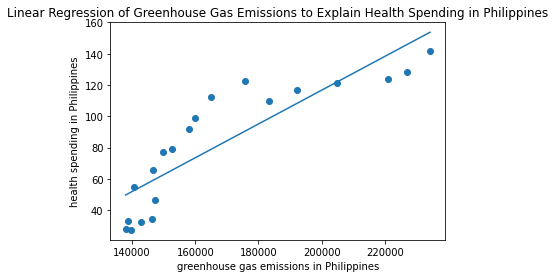

R-squared: 0.3085719250831289


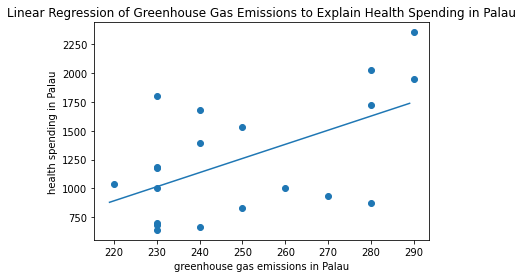

R-squared: 0.48370755371837304


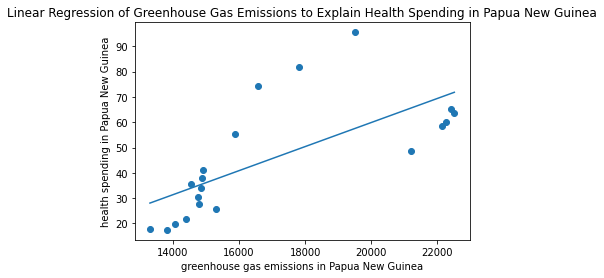

R-squared: 0.06454122213251323


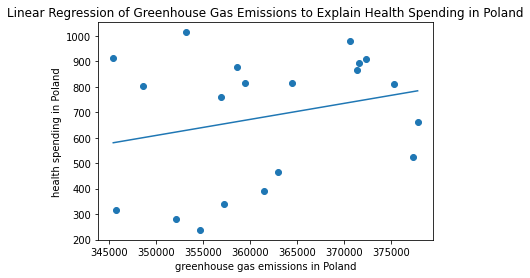

R-squared: 0.3518423516321144


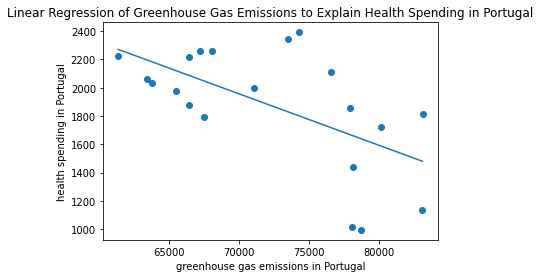

R-squared: 0.9238062990912862


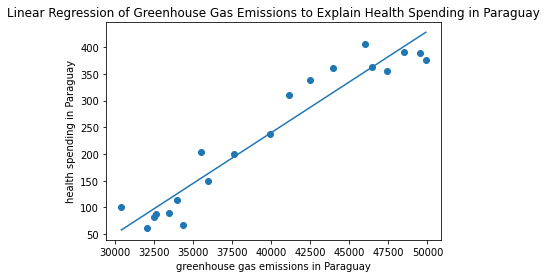

R-squared: 0.789053692131698


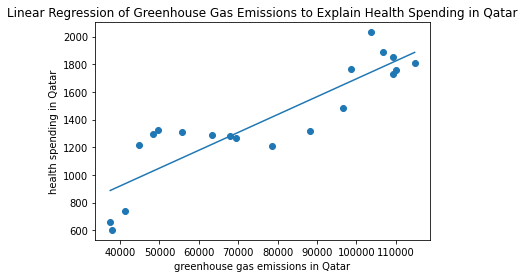

R-squared: 0.5359035082053921


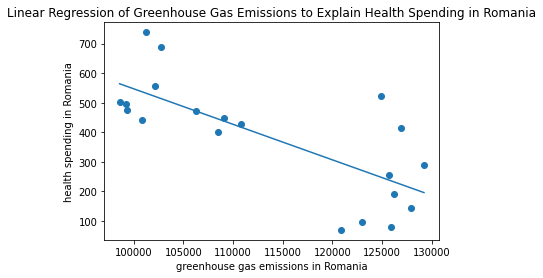

R-squared: 0.4930972278692741


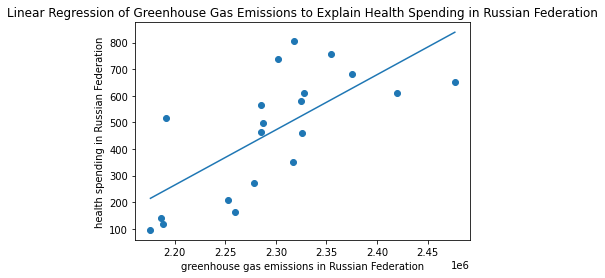

R-squared: 0.8065038713448542


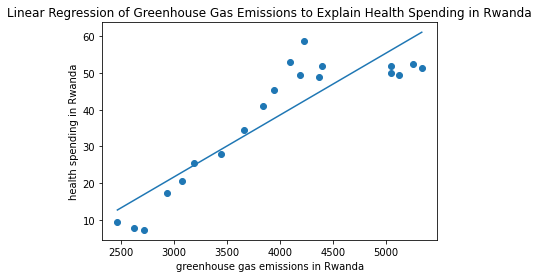

R-squared: 0.9584037619100814


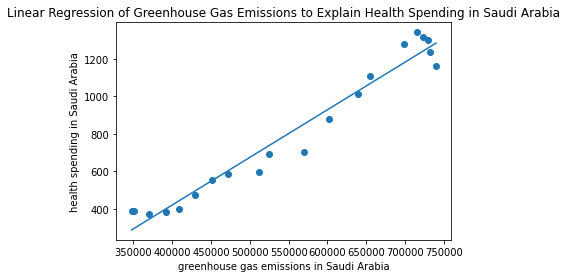

R-squared: 0.5858615256672411


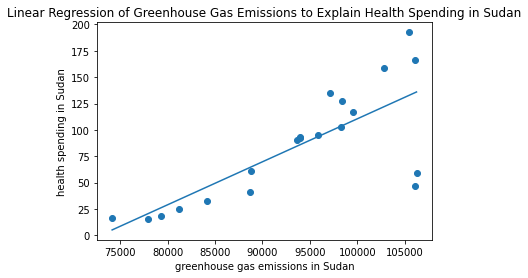

R-squared: 0.6977662346929302


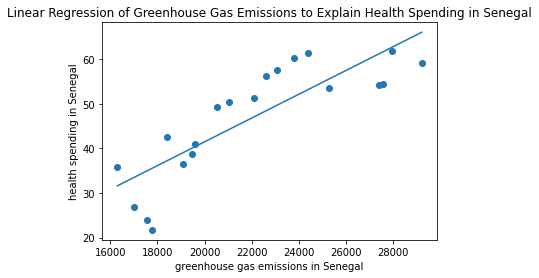

R-squared: 0.853750088576995


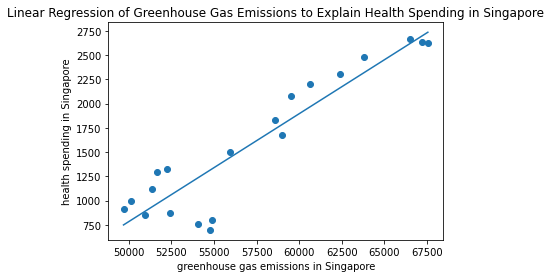

R-squared: 0.5183141770600639


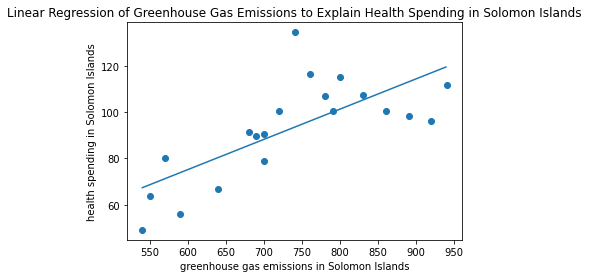

R-squared: 0.47871574611263024


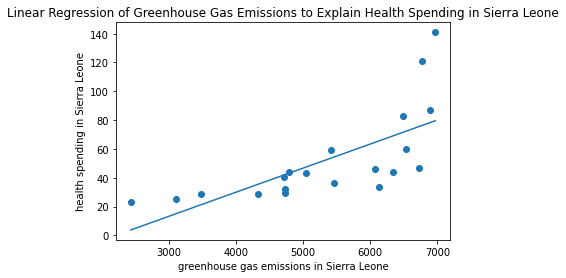

R-squared: 0.11287174072915906


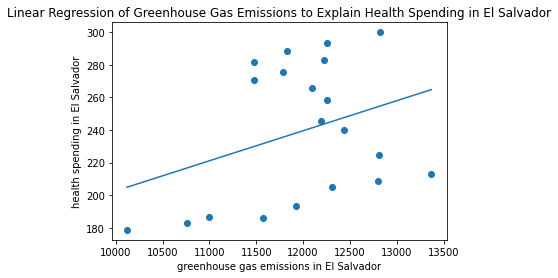

R-squared: 0.04769468040812308


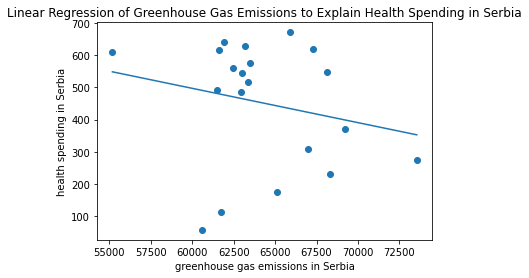

R-squared: 0.24175188428772532


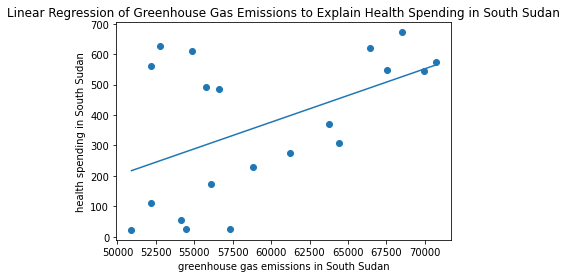

R-squared: 0.7145157661579


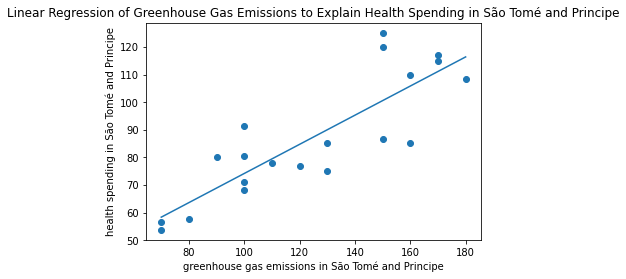

R-squared: 0.5970576972769247


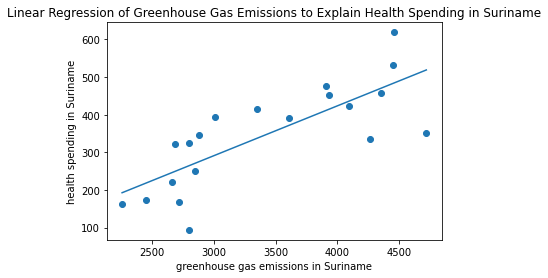

R-squared: 0.6076670686314142


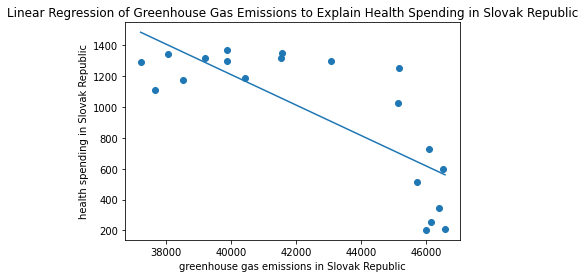

R-squared: 0.06262063895561498


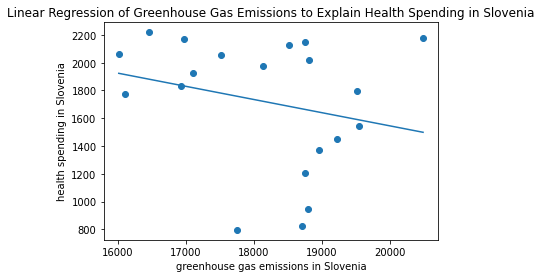

R-squared: 0.7797476255178264


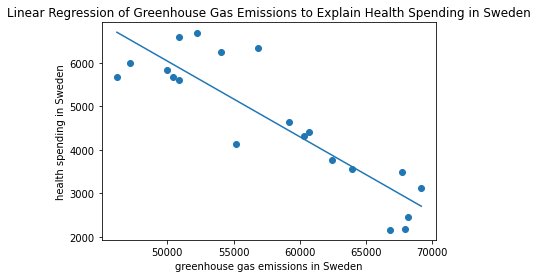

R-squared: 0.10944851687983082


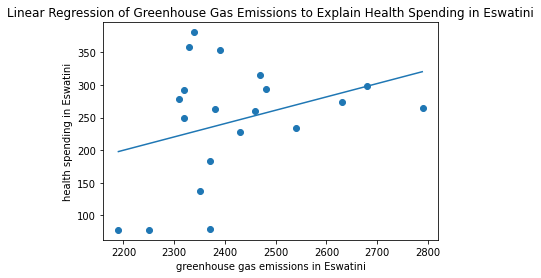

R-squared: 0.813753564496276


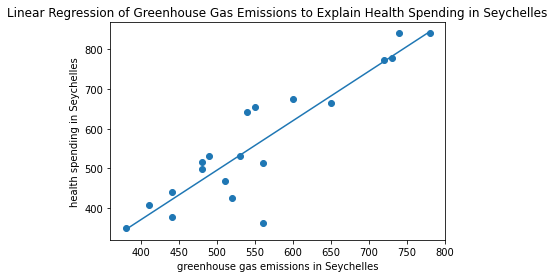

R-squared: 0.9088458194261164


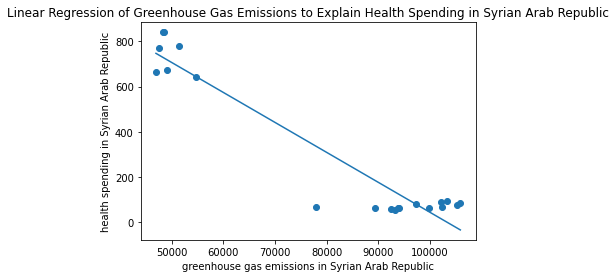

R-squared: 0.2522307469323336


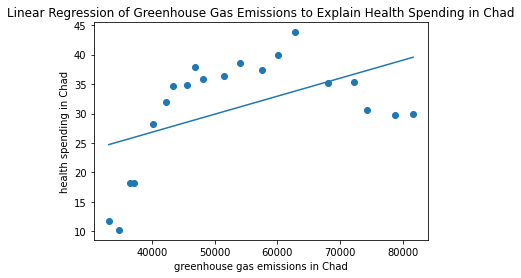

R-squared: 0.837322309392897


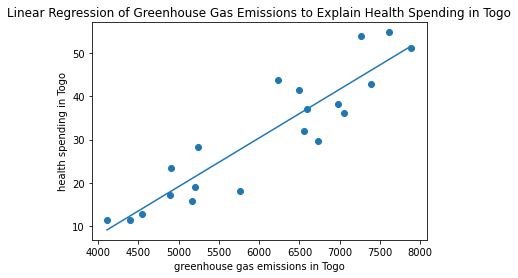

R-squared: 0.9525531595253718


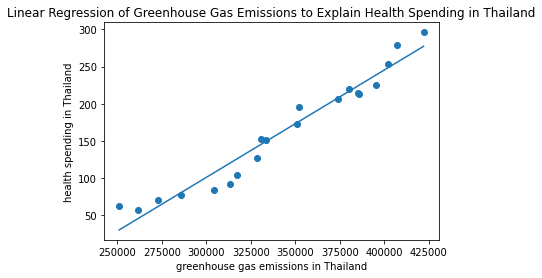

R-squared: 0.6063476782555026


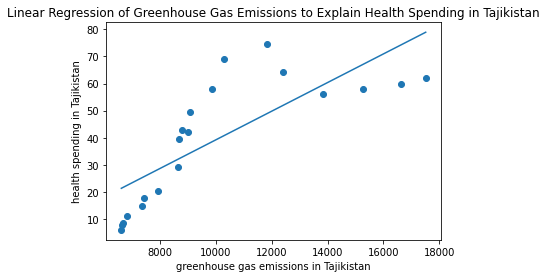

R-squared: 0.806052217940322


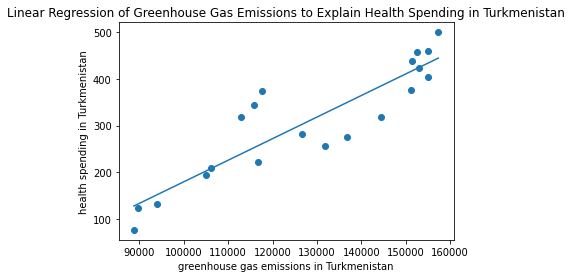

R-squared: 0.019032486522230996


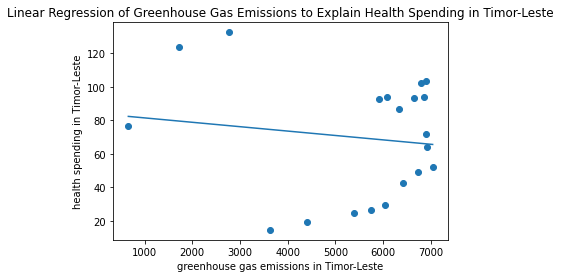

R-squared: 0.44711928102275655


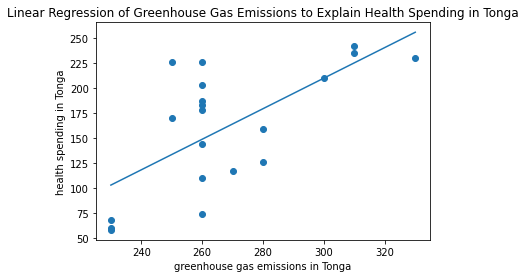

R-squared: 0.6767636201416515


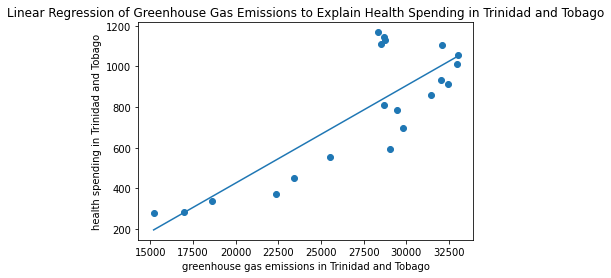

R-squared: 0.7743640183272283


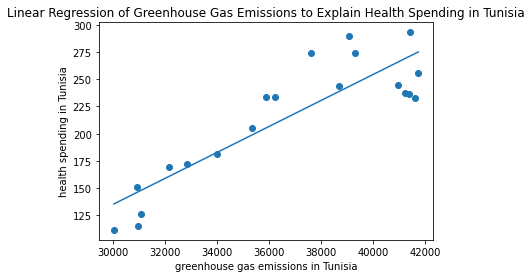

R-squared: 0.3533470420044329


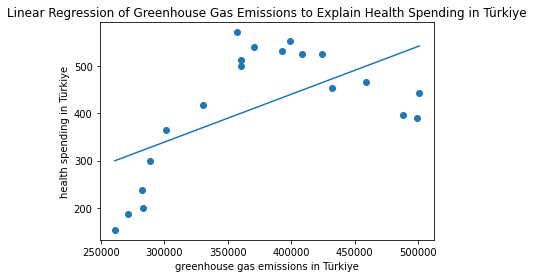

R-squared: 0.22293019236619238


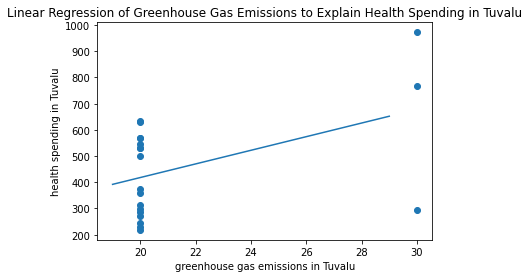

R-squared: 0.6795917785568855


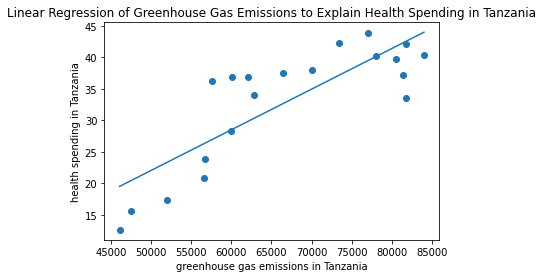

R-squared: 0.4194106905728935


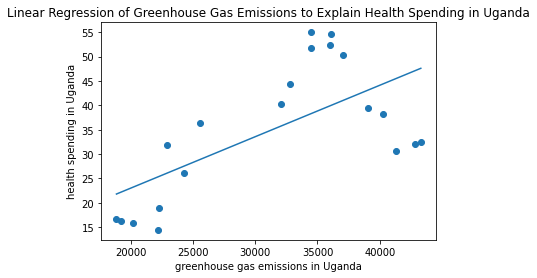

R-squared: 0.2204642875007854


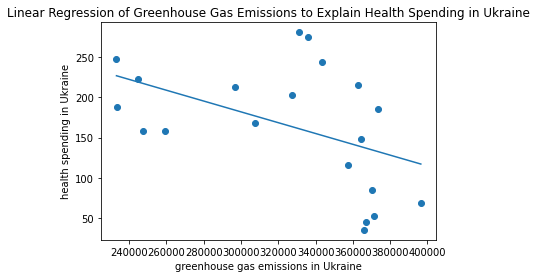

R-squared: 0.23257902867011204


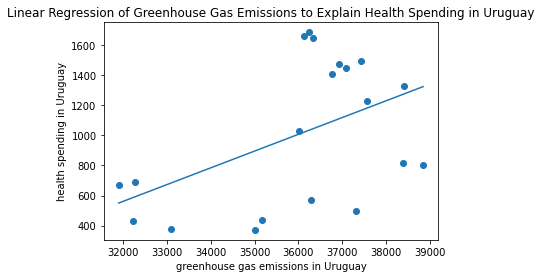

R-squared: 0.7725592861118553


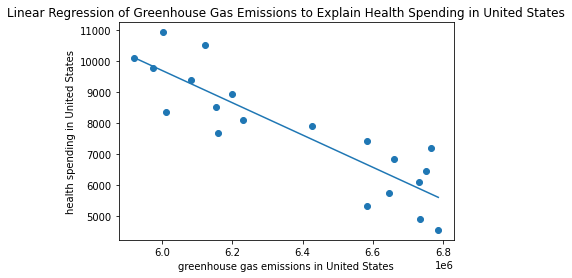

R-squared: 0.05763336281572318


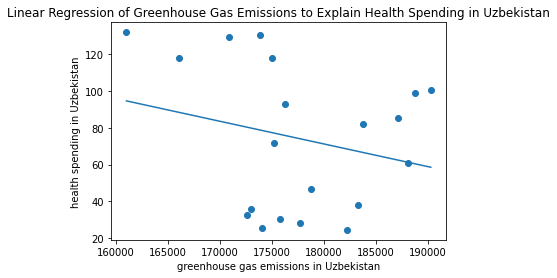

R-squared: 0.036857454584036886


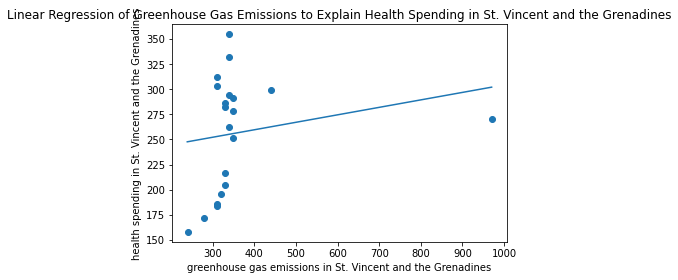

R-squared: 0.3393566434848678


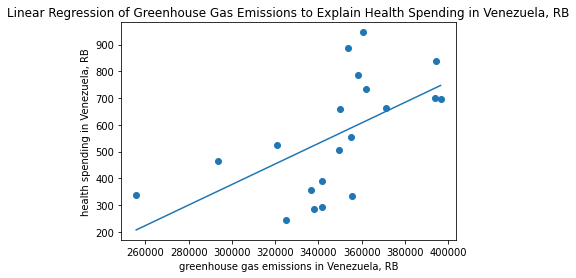

R-squared: 0.9571732650008725


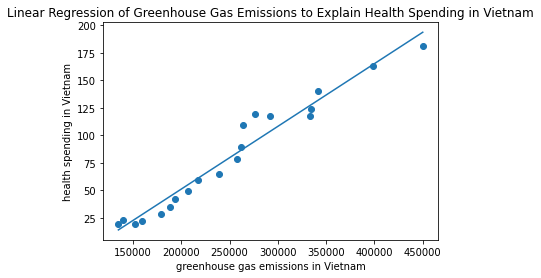

R-squared: 0.5886319802206028


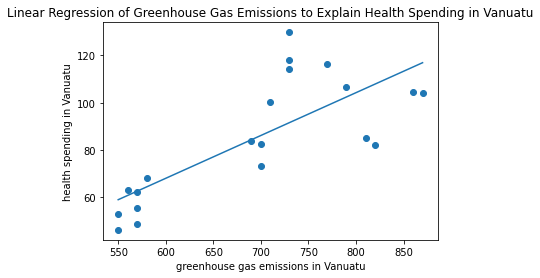

R-squared: 0.5918697148756802


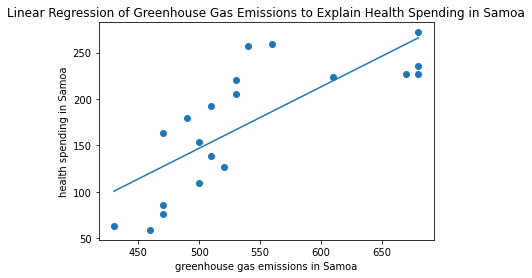

R-squared: 0.5177618551990076


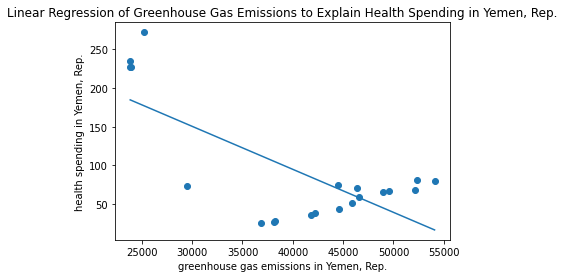

R-squared: 0.746761948524086


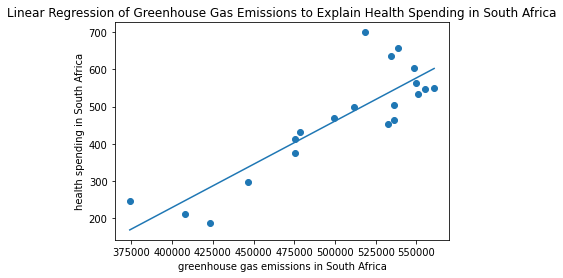

R-squared: 0.6677563139292507


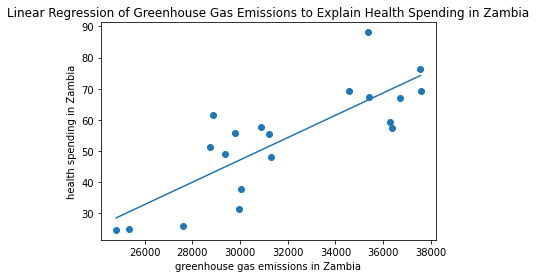

R-squared: 0.11697453039328876


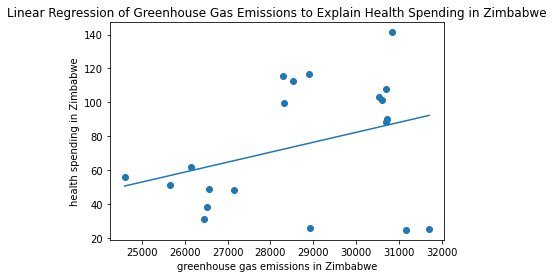

Good fits: 98/188
Poor fits: 78/188
Opposites: 12/188


In [ ]:
# for each country
big_x = np.array(0)
big_y = np.array(0)
good_fits = 0
poor_fits = 0
opposites = 0
total = 0
for country in df_gas.T:
  if country == 'Country Name':
    continue
  x = np.array(df_gas.T[country])
  y = np.array(df_health.T[country])

  i = 0
  while i < len(x):
    if math.isnan(x[i]):
      x = np.delete(x, i)
      y = np.delete(y, i)
    elif math.isnan(y[i]):
      x = np.delete(x, i)
      y = np.delete(y, i)
    else:
      i += 1

  big_x = np.append(big_x, x)
  big_y = np.append(big_y, y)

  x = np.reshape(x, (-1,1))

  model = LinearRegression()
  model.fit(x,y)
  r_sq = model.score(x, y)
  print("R-squared: {}".format(r_sq))

  if r_sq > 0.5 and model.coef_ > 0:
    good_fits += 1
  elif r_sq < 0.5:
    poor_fits += 1
  else:
    opposites += 1
  total += 1

  x_model = np.arange(math.floor(min(x)),1+math.floor(max(x))).reshape((-1,1))
  y_model = model.predict(x_model)

  plt.scatter(x,y , label='health spending')
  plt.plot(x_model, y_model)

  plt.title('Linear Regression of Greenhouse Gas Emissions to Explain Health Spending in {}'.format(country))
  plt.ylabel('health spending in {}'.format(country))
  plt.xlabel('greenhouse gas emissions in {}'.format(country))
  plt.show()
print("Good fits: {}/{}".format(good_fits, total))
print("Poor fits: {}/{}".format(poor_fits, total))
print("Opposites: {}/{}".format(opposites, total))

R-squared: 0.036828943218817356
Slope: [0.00032904]


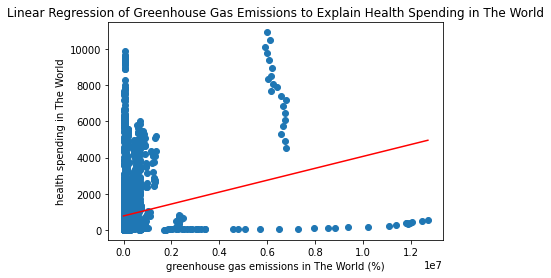

In [ ]:
# for all countries at once
big_x = np.reshape(big_x, (-1,1))

model = LinearRegression()
model.fit(big_x,big_y)
r_sq = model.score(big_x, big_y)
print("R-squared: {}".format(r_sq))
print("Slope: {}".format(model.coef_))

x_model = np.arange(math.floor(min(big_x)),1+math.floor(max(big_x))).reshape((-1,1))
y_model = model.predict(x_model)

plt.scatter(big_x,big_y , label='health spending')
plt.plot(x_model, y_model, color = 'red')

plt.title('Linear Regression of Greenhouse Gas Emissions to Explain Health Spending in The World')
plt.ylabel('health spending in The World')
plt.xlabel('greenhouse gas emissions in The World (%)')
plt.show()

**Discussion of results:** From the model, 98 out of 188 countries had the expected relationship between greenhouse gas emissions and health spending with an R-value of 0.5 or better. There were also 78 countries with no strong relation. There were 12 countries with a strong relation opposite of what would be expected. Once again, the world plot shows lots of variation and a low R-squared value due to the differences between each country. This relation is weaker than the previous relation as there are more countries that go against the expected relation. This could be caused by the fact that there are many factors that go into determining how much a country spends on health and greenhouse gas emissions are just one factor that go into determining that value. Still, there is a definite positive relation between health spending and greenhouse gas emissions as shown by the 98 countries with a strong relation.

Next, we are using data clustering on countries in a given year, over health expenditures and greenhouse gas emissions. This is in response to the second hypothesis: if health expenditures are high for a country, then so should greenhouse gas emissions in that given year. 

The first thing we want to do is to use the dataframe from when we merged all of the health expenditure, greenhouse gas emissions, and renewable energy consumption data together. The goal is to make a centralized yet temporary dataframe that contains all of the first two categories for each country, given a desired year. 

For example, if the "proposed_year" value is 2010, then we will get every countries' values for health expenditure, greenhouse gas emissions, and renewable energy consumption for 2010.


In [ ]:
# from df, get health expenditure and greenhouse gas emission for each country
# for each year. then, make a data cluster model that has every country for that year
def get_yearly_data(proposed_year):
  yearly_data = []

  for year_increment in range(proposed_year - 2000, 4720, 20):  
    if ( df.loc[year_increment]['Year'] == proposed_year ):
      a = df.loc[year_increment]['Country Name']
      b = df.loc[year_increment]['Income Group']
      c = df.loc[year_increment]['Year']
      d = df.loc[year_increment]['Health Expenditure']
      e = df.loc[year_increment]['Greenhouse Gas Emission']
      f = df.loc[year_increment]['Renewable Energy Usage']
      x = [a,b,c,d,e,f]
      
      yearly_data.append(x)
  
  # return the 2D array as a temporary dataset
  df_yearly_data = pd.DataFrame(yearly_data, columns=['Country Name', 
                                    'Income Group',
                                    'Year', 
                                    'Health Expenditure', 
                                    'Greenhouse Gas Emission', 
                                    'Renewable Energy Usage'])
  return df_yearly_data


The code below is the main data clustering process that generates the model we want. This uses the 'Elbow Method,' which is used to find the optimal K-value ('K' is the number of centroids in the data). 
 
Initially, the "for-loop" below was set up with multiple dummy ranges (1-10, 1-20, 1-50, 1-100) to find our optimal K-value. Respectively, this tests for 10 clusters, 20 clusters, 50 clusters, and 100 clusters. In all cases, the "elbow point" was found to be three. This means that the optimal K-value or number of clusters is three.
 
The next step is to then calculate the WCSS (Within-Cluster Sum of Square), our distance metric. WCSS is the sum of squared distance between each point and the centroid in a cluster. The generated elbow graph shows single-digit values for WCSS, when they are actually not. In reality, the values are significantly larger than that, which is due to the fact that the number of clusters is low. 


In [ ]:
def generate_clustering_model_2(proposed_year):
  # output customization
  elbow_title = "Elbow Method Graph (" + str(proposed_year) + ")"
  pre_cluster_title = "Pre-Cluster Model (" + str(proposed_year) + ")"
  cluster_title = "Cluster Model (" + str(proposed_year) + ")"

  # create a temporary yearly dataset 
  yearly_data = get_yearly_data(proposed_year)

  # input for K-means clustering algorithm
  #X = df_yearly_data[['Health Expenditure', 'Greenhouse Gas Emission']].copy()
  X = yearly_data.filter(["Health Expenditure", "Greenhouse Gas Emission"], axis=1)
  wcss = []
  
  # run over three clusters
  for i in range(1,10):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(X)
    # wcss = within-cluster-sum-of-squares
    wcss.append(kmeans.inertia_)

  # plot the WCSS vs the clusters
  plt.plot(range(1,10), wcss)
  plt.title(elbow_title)
  plt.xlabel('# of Clusters')
  plt.ylabel('WCSS')
  plt.show()

  # style the plots using Seaborn
  sns.set_style("darkgrid")

  # plot the raw scatterplot data w/o clusters
  sns.scatterplot(data = X, 
                  x = "Health Expenditure", 
                  y = "Greenhouse Gas Emission", 
                  c = ["green"])
  plt.title(pre_cluster_title)
  plt.xlabel('Health Expenditure per capita (US$)')
  plt.ylabel('Greenhouse Gas Emission (kt of CO2)')
  plt.show()
  
  # initialize the number of clusters for our model
  model = KMeans(n_clusters=3)
  model.fit(X)

  #print the centroids
  #print(model.cluster_centers_)

  #plot the clustered data with centroids overlaid
  sns.scatterplot(data = X, 
                  x="Health Expenditure", 
                  y= "Greenhouse Gas Emission", 
                  c= model.labels_, 
                  cmap= 'rainbow' )
  sns.scatterplot(x=model.cluster_centers_[:, 0], 
                  y=model.cluster_centers_[:, 1], 
                  c=['black'])
  plt.title(cluster_title)
  plt.xlabel('Health Expenditure per capita (US$)')
  plt.ylabel('Greenhouse Gas Emission (kt of CO2)')
  plt.show()

  # create a dataframe with the clustered labels
  segmented_data = pd.DataFrame()
  segmented_data['Country Name'] = X.index.values
  segmented_data['Segment'] = model.labels_

  segmented_data = segmented_data[segmented_data.Segment==5]
  segmented_data.head()

The code below generates the models for 2000 and 2019. 

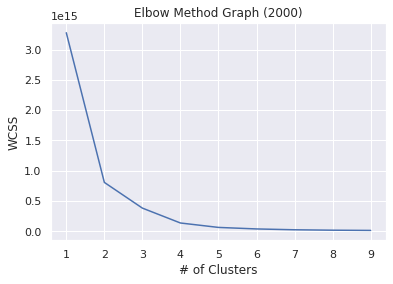

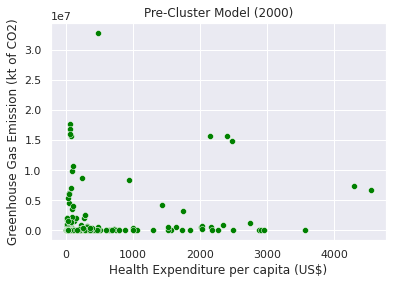

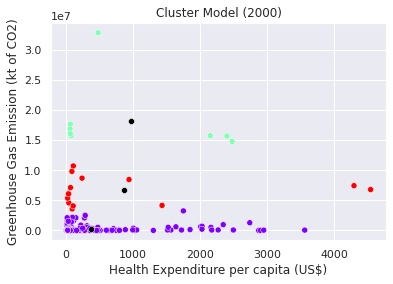

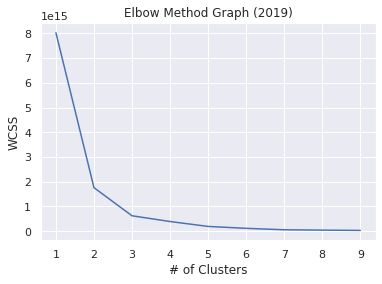

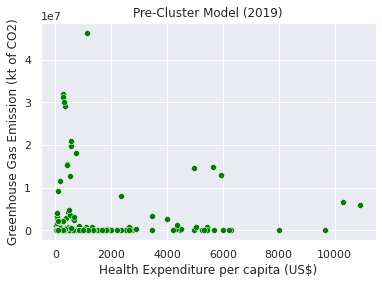

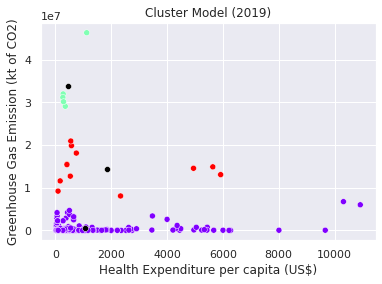

In [ ]:
generate_clustering_model_2(2000)
generate_clustering_model_2(2019)

Moving forward to the modeling process, we plot a graph of the raw data (shown in the 'Pre-Cluster Model' figure). Each point is a country and where they fall in their respective health expenditure and greenhouse gas emissions values. From this graph, we can already anticipate that there will be unconventional clusters - not everything is placed in an ideal manner. 
 
This anticipation was properly met, as the third figure (shown as 'Cluster Model') shows where our clusters lie. Each group is indicated by color, with black dots specifying the center of the clusters. The grouping appears to be done in a horizontal manner into three groups: group one is made up of countries with considerably high greenhouse gas emissions (2.9> kt of CO2). Group two is made up of those moderate emissions (2.1> & >0.8 kt of CO2). Group three is made up of those with comparably lower emissions (0.7> kt of CO2). 
 
As discussed earlier, the optimality of using a K-Means approach was tested by using a wide range of the number of clusters we could test. In all cases, the same K-value was returned (k=3). Furthermore, because the parameters allow for it, this model was applied to all years for the sake of comparison. 
 
When we compare the cluster model throughout the years, a few noticeable differences appear. For one, despite the similarity in distribution of data points, the range of the y-axis (Greenhouse gas emissions in kt of CO2) increases. In 2000, this range was [0,3.5). In 2019, this range was [0,4.5). The same thing applies with the x-axis (Health expenditure in US$). In 2000, this range was [0,5000). In 2019, this range was [0,12000) - a drastic increase in health expenditures.
 
The consistency in visual distribution means that from 2000 to 2019, a majority of countries manage to stay in that third cluster group: those who have lower greenhouse gas emissions compared to others. Even though the range for both axis' increase, the models allow for us to infer that countries that typically stay on the lower end of health expenditures tend to be on the lower end of greenhouse gas emissions.
